# Projet 7 : Implémentez un modèle de scoring

# 1. Text Exploratory

## 1.1 Context

**Parcours** : Data Scientist

**Projet**   : Projet 7: **Implémentez un modèle de scoring**

**Date**     : Octobre 2023

**Auteur**   : Lewis Tshimanga

##  1.2 Requirements

## 1.3 Imports

In [1]:
import sys
sys.version_info

sys.version_info(major=3, minor=8, micro=10, releaselevel='final', serial=0)

In [2]:
import platform
print(platform.python_version())

3.8.10


In [3]:
from IPython.display import display, HTML
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.cm import Spectral, RdYlGn
from sklearn.inspection import permutation_importance
from sklearn.metrics import roc_curve, auc, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics import make_scorer
from sklearn.model_selection import StratifiedKFold

from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.dummy import DummyClassifier
import time

from sklearn.metrics import fbeta_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

from sklearn.pipeline import Pipeline

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score 
from sklearn.metrics import classification_report, confusion_matrix, roc_curve
from imblearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import cross_val_predict, cross_val_score, learning_curve, cross_validate
from sklearn.feature_selection import RFECV
from yellowbrick.classifier import ClassificationReport, DiscriminationThreshold
import warnings

import lightgbm
from yellowbrick.classifier import ROCAUC

from sklearn.metrics import (classification_report,
                             precision_score,
                             recall_score,
                             f1_score,
                             precision_recall_fscore_support,
                             fbeta_score, 
                             make_scorer)

import pickle
import re
from dataprep.eda import create_report
from dataprep.eda import plot, plot_correlation, plot_missing, plot_diff
import os
from lightgbm import plot_importance
import joblib
from pprint import pprint
import webbrowser
import requests
import itertools
import eli5
import shap


In [4]:
import sklearn

print(sklearn.__version__)


1.2.0


In [5]:
try:
    from sklearn.utils.metaestimators import if_delegate_has_method
    print("Le module 'if_delegate_has_method' est disponible dans votre version de scikit-learn.")
except ImportError:
    print("Le module 'if_delegate_has_method' n'est pas disponible dans votre version de scikit-learn.")


Le module 'if_delegate_has_method' est disponible dans votre version de scikit-learn.


In [6]:
plt.style.use('seaborn')

warnings.simplefilter(category=FutureWarning, action='ignore')
warnings.simplefilter(category=UserWarning, action='ignore')

# pour gérer l'affichage des dataframes pandas
pd.options.display.max_rows = 100
pd.options.display.max_columns = 200
pd.set_option("colheader_justify", "left")

# pour gérer l'affichage des arrays numpy
# 230 sur config bureau, 165 sur config portable
np.set_printoptions(linewidth=165)

# pour afficher les gros fichiers sur toute la largeur de l'écran
HTML("<style>.container { width:95% }</style>")

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.


## 1.4  Dataset

In [7]:
def get_dataframe_info(data_frame):
    """
    Cette fonction prend en entrée un DataFrame et renvoie les informations suivantes :
    - Nom du DataFrame
    - Nombre de lignes et de colonnes
    - Taux de complétion (en pourcentage)
    - Nombre de valeurs manquantes
    """
    # Nom du DataFrame

    data_frame_name = [var_name for var_name in globals() if globals()[var_name] is data_frame][0]

    # Nombre de lignes et de colonnes
    num_rows, num_cols = data_frame.shape

    # Taux de complétion (en pourcentage)
    completion_rate = (1 - data_frame.isnull().sum().sum() / (num_rows * num_cols)) * 100

    # Nombre de valeurs manquantes
    num_missing_values = data_frame.isnull().sum().sum()

    # Nombre de valeurs manquantes en %
    missing_percent = data_frame.isnull().mean().mean() * 100

    # Nombre de doublons
    doublons = data_frame.duplicated().sum()

    # Affichage des informations
    print(f"DataFrame name: {data_frame_name}")
    print(f"Number of rows: {num_rows}")
    print(f"Number of columns: {num_cols}")
    print(f"Completion rate: {completion_rate:.2f}%")
    print(f"Number of missing values: {num_missing_values}")
    print(f"Number of missing values %: {missing_percent:.2f}%")
    print(f"Doublons: {doublons}")

In [8]:
import pandas as pd

def calculate_dataframe_stats(data):
    # Calculer le nombre de valeurs non nulles par colonne
    count_values = data.count()

    # Calculer le nombre total de valeurs dans le dataframe
    total_values = data.shape[0]

    # Calculer le taux de remplissage par colonne
    filling_rates = count_values / total_values

    # Calculer le nombre de valeurs manquantes par colonne
    missing_values = total_values - count_values

    # Créer un nouveau dataframe pour afficher les résultats
    df_stats = pd.DataFrame({
        "Nombre de valeurs": count_values,
        "Taux de remplissage": filling_rates,
        "Nombre de valeurs manquantes": missing_values
    })

    # Afficher le dataframe des statistiques
    return df_stats

### 1.4.1 Paths

In [9]:
os.listdir()

['.ipynb_checkpoints',
 '.pyenv',
 '00_Implementez_un_modele_de_scoring-Copy3.ipynb',
 '00_Implementez_un_modele_de_scoring-test_kaggle.ipynb',
 '00_Implementez_un_modele_de_scoring.ipynb',
 '00_Implementez_un_modele_de_scoring_copy1.ipynb',
 '01_Implementez_un_modele_de_scoring.ipynb',
 '02_Implementez_un_modele_de_scoring-Copy1.ipynb',
 '02_Implementez_un_modele_de_scoring.ipynb',
 'api_ml',
 'Archived',
 'Cleaned',
 'corrigé_deploy_ml_api',
 'corrigé_deploy_ml_api.zip',
 'dashboard_streamlit',
 'eda',
 'install-pyenv-win.ps1',
 'mlruns',
 'Projet+Mise+en+prod+-+home-credit-default-risk.zip',
 'results_permutation_importance.pkl',
 'Source',
 'Untitled.ipynb',
 '~']

In [10]:
os.listdir("Source")

['application_test.csv',
 'application_train.csv',
 'bureau.csv',
 'bureau_balance.csv',
 'credit_card_balance.csv',
 'HomeCredit_columns_description.csv',
 'installments_payments.csv',
 'POS_CASH_balance.csv',
 'previous_application.csv',
 'sample_submission.csv']

In [11]:
os.getcwd()

'C:\\Users\\jerom\\projet_7'

In [12]:
dirpath = os.getcwd()
print("Working directory is : " + dirpath)

# Liste les fichiers de données .csv
inputpath = dirpath + "/Source"
print("\nFichiers .csv : ", os.listdir(inputpath))


Working directory is : C:\Users\jerom\projet_7

Fichiers .csv :  ['application_test.csv', 'application_train.csv', 'bureau.csv', 'bureau_balance.csv', 'credit_card_balance.csv', 'HomeCredit_columns_description.csv', 'installments_payments.csv', 'POS_CASH_balance.csv', 'previous_application.csv', 'sample_submission.csv']


## 1.5 Exploratory Data Analysis 

In [13]:
import pandas as pd
from dataprep.eda import create_report
import pickle
import os

def perform_eda_analysis(df, samples=10000, title=None, display=None, export_html_file=False):
    """
    Réalise l'analyse exploratoire avec dataprep, affiche le résultat, et sauvegarde le rapport (compressé) sur le disque.
    Si le rapport sauvegardé existe déjà, l'analyse n'est pas refaite et est affichée directement.
    
    Args :
    - df : dataframe pandas à analyser.
    - samples (int) : nb de lignes du df inclues dans l'analyse (si samples=None : on garde le df entier).
    - title (string) : nom du fichier de sauvegarde.
    - display (list of strings) : alias for the "display" parameter of the function dataprep.eda.create_report(df, display).
    - export_html_file (bool) : si True, le rapport est compressé et sérialisé pour une utilisation par le dashboard Streamlit.
    
    Returns :
    - void (le rapport d'analyse est sauvé dans un fichier pickle et affiché dans une nouvelle fenêtre du web-browser)
    """
    # Si le fichier de rapport existe déjà, le charger et l'afficher
    if title and os.path.exists(f"{title}.pkl"):
        with open(f"{title}.pkl", "rb") as file:
            report = pickle.load(file)
        return report
    
    # Sinon, réaliser l'analyse exploratoire
    if samples:
        df = df.sample(min(samples, len(df)))
    report = create_report(df, display=display)
    
    # Afficher le rapport
    report.show_browser()
    
    # Sauvegarder le rapport au format pickle si export_html_file est True
    if export_html_file:
        with open(f"{title}.pkl", "wb") as file:
            pickle.dump(report, file)
    
    return report


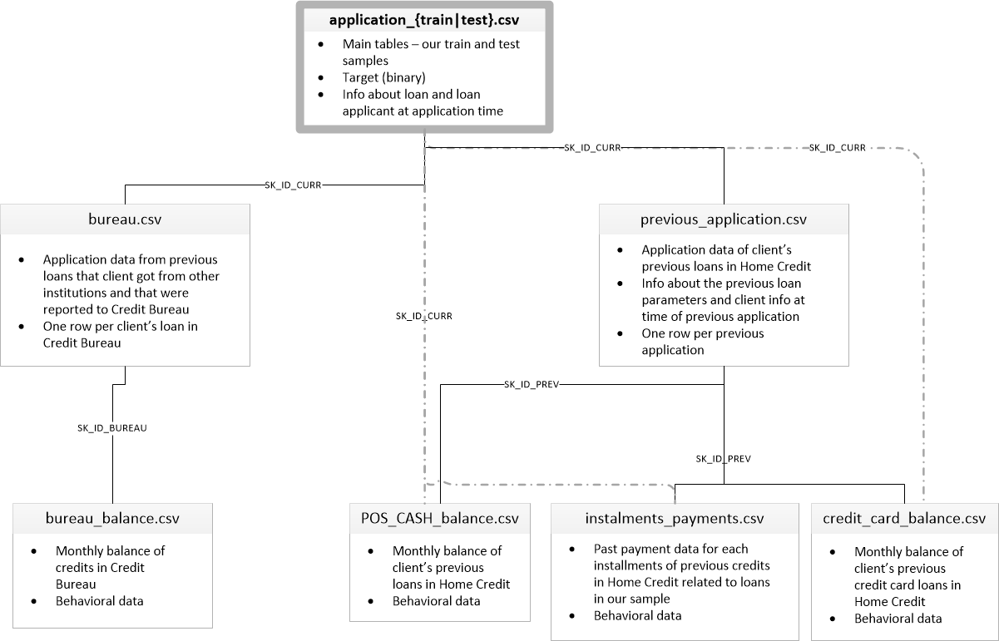

### 1.5.1 Description des fichiers


**application_{train|test}.csv**
Il s'agit de la table principale, divisée en deux fichiers pour Train (avec TARGET) et Test (sans TARGET). Données statiques pour toutes les applications. Une ligne représente un prêt dans notre échantillon de données.

**bureau.csv**

Tous les crédits antérieurs du client fournis par d'autres institutions financières qui ont été signalés au bureau de crédit (pour les clients qui ont un prêt dans notre échantillon). Pour chaque prêt de notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait dans le Credit Bureau avant la date de la demande.

**bureau_balance.csv**

Soldes mensuels des crédits antérieurs au bureau de crédit. Ce tableau comporte une ligne pour chaque mois d'historique de chaque crédit précédent signalé au bureau de crédit - c'est-à-dire que le tableau a (nombre de prêts dans l'échantillon * nombre de crédits précédents relatifs * nombre de mois où nous avons un historique observable pour les crédits précédents) lignes.

**POS_CASH_balance.csv**

Instantanés mensuels du solde des points de vente précédents et des prêts en espèces que le demandeur avait contractés avec Home Credit. Ce tableau a une ligne pour chaque mois d'historique de chaque crédit précédent dans Home Credit (crédit à la consommation et prêts de trésorerie) lié aux prêts de notre échantillon - c'est-à-dire que le tableau a (nombre de prêts dans l'échantillon * nombre de crédits précédents relatifs * nombre de mois dans lequel nous avons un historique observable pour les lignes des crédits précédents).

**credit_card_balance.csv**

Aperçus mensuels du solde des cartes de crédit précédentes que le demandeur a avec Home Credit. Ce tableau comporte une ligne pour chaque mois d'historique de chaque crédit précédent dans Home Credit (crédit à la consommation et prêts de trésorerie) lié aux prêts de notre échantillon - c'est-à-dire que le tableau a (nombre de prêts dans l'échantillon * nombre de cartes de crédit précédentes relatives * nombre de mois où nous avons un historique observable pour la carte de crédit précédente) lignes.

**previous_application.csv**

Toutes les demandes précédentes de prêts immobiliers des clients qui ont des prêts dans notre échantillon. Il y a une ligne pour chaque demande précédente liée aux prêts dans notre échantillon de données.

**installments_payments.csv**

Historique de remboursement des crédits précédemment décaissés en Home Credit liés aux prêts de notre échantillon. Il y a a) une ligne pour chaque paiement effectué plus b) une ligne pour chaque paiement manqué. Une ligne équivaut à un versement d'une échéance OU une échéance correspondant à un versement d'un précédent crédit immobilier lié aux prêts de notre échantillon.

**HomeCredit_columns_description.csv**
Ce fichier contient les descriptions des colonnes des différents fichiers de données.

#### 1.5.1.1. **description.csv**

In [14]:
df_description = pd.read_csv('Source/HomeCredit_columns_description.csv',
                             sep=',',
                             low_memory=False,
                             encoding='ISO-8859-1')

In [15]:
HTML(df_description.drop(columns='Unnamed: 0').to_html())

,Table,Row,Description,Special
0,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",NaN
2,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
6,application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,NaN
7,application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,NaN
8,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,NaN
9,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,NaN


#### 1.5.1.2. **application_train.csv**

In [16]:
df_application_train = pd.read_csv('Source/application_train.csv',
                                   sep=',',
                                   low_memory=False)

In [17]:
df_application_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [18]:
df_application_train[df_application_train['TARGET']== 'Nan']

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


In [19]:
get_dataframe_info(df_application_train)

DataFrame name: __
Number of rows: 307511
Number of columns: 122
Completion rate: 75.60%
Number of missing values: 9152465
Number of missing values %: 24.40%
Doublons: 0


In [20]:
df_application_train[df_application_train['SK_ID_CURR'] == 100002]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.0,0.069,0.0833,0.125,0.0369,0.0202,0.019,0.0,0.0,0.0252,0.0383,0.9722,0.6341,0.0144,0.0,0.069,0.0833,0.125,0.0377,0.022,0.0198,0.0,0.0,0.025,0.0369,0.9722,0.6243,0.0144,0.0,0.069,0.0833,0.125,0.0375,0.0205,0.0193,0.0,0.0,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0


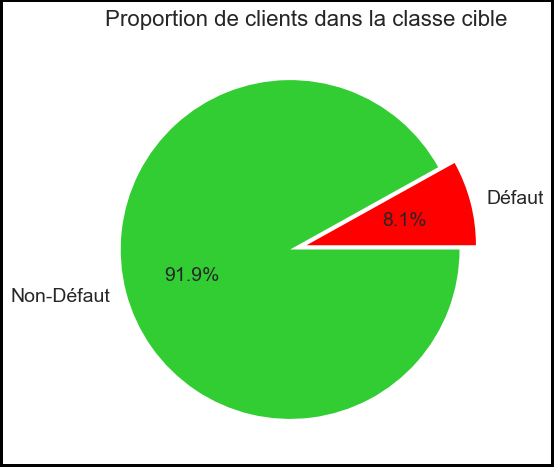

In [21]:
target_0 = (df_application_train['TARGET'] == 0).sum()
target_1 = (df_application_train['TARGET'] == 1).sum()

plt.figure(edgecolor='black', linewidth=4)
plt.pie([target_1, target_0],
        explode=(0, 0.1),
        labels=['Défaut', 'Non-Défaut'],
        colors=['red', 'limegreen'],
        autopct='%.1f%%',
        textprops={'size': 14})
plt.title("Proportion de clients dans la classe cible", size=16)
plt.show()

#### 1.5.1.3. **application_test.csv**

In [22]:
df_application_test = pd.read_csv('Source/application_test.csv',
                                  sep=',',
                                  low_memory=False)

In [23]:
df_application_test

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Marr

#### 1.5.1.4. **bureau.csv**

In [24]:
df_bureau = pd.read_csv('Source/bureau.csv', sep=',', low_memory=False)

In [25]:
df_bureau

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN


In [26]:
df_bureau[df_bureau['SK_ID_CURR'] == 100002]

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
675684,100002,6158904,Closed,currency 1,-1125,0,-1038.0,-1038.0,NaN,0,40761.000,NaN,NaN,0.0,Credit card,-1038,0.0
675685,100002,6158905,Closed,currency 1,-476,0,NaN,-48.0,NaN,0,0.000,0.0,NaN,0.0,Credit card,-47,NaN
675686,100002,6158906,Closed,currency 1,-1437,0,-1072.0,-1185.0,0.000,0,135000.000,0.0,0.000,0.0,Consumer credit,-1185,0.0
675687,100002,6158907,Closed,currency 1,-1121,0,-911.0,-911.0,3321.000,0,19071.000,NaN,NaN,0.0,Consumer credit,-906,0.0
675688,100002,6158908,Closed,currency 1,-645,0,85.0,-36.0,5043.645,0,120735.000,0.0,0.000,0.0,Consumer credit,-34,0.0
675689,100002,6158909,Active,currency 1,-103,0,NaN,NaN,40.500,0,31988.565,0.0,31988.565,0.0,Credit card,-24,0.0
1337779,100002,6158903,Active,currency 1,-1042,0,780.0,NaN,NaN,0,450000.000,245781.0,0.000,0.0,Consumer credit,-7,0.0
1486113,100002,6113835,Closed,currency 1,-1043,0,62.0,-967.0,0.000,0,67500.000,NaN,NaN,0.0,Credit card,-758,0.0


#### 1.5.1.5. **bureau_balance.csv**

In [27]:
df_bureau_balance = pd.read_csv('Source/bureau_balance.csv',
                                sep=',',
                                low_memory=False)

In [28]:
df_bureau_balance

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
...,...,...,...
27299920,5041336,-47,X
27299921,5041336,-48,X
27299922,5041336,-49,X
27299923,5041336,-50,X


#### 1.5.1.6. **POS_CASH_balance.csv**

In [29]:
df_POS_CASH_balance = pd.read_csv('Source/POS_CASH_balance.csv',
                                  sep=',',
                                  low_memory=False)

In [30]:
df_POS_CASH_balance

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
...,...,...,...,...,...,...,...,...
10001353,2448283,226558,-20,6.0,0.0,Active,843,0
10001354,1717234,141565,-19,12.0,0.0,Active,602,0
10001355,1283126,315695,-21,10.0,0.0,Active,609,0
10001356,1082516,450255,-22,12.0,0.0,Active,614,0


In [31]:
df_POS_CASH_balance[df_POS_CASH_balance['SK_ID_CURR'] == 100002].sort_values(
    'MONTHS_BALANCE')

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
8473918,1038818,100002,-19,24.0,24.0,Active,0,0
2012884,1038818,100002,-18,24.0,23.0,Active,0,0
5258607,1038818,100002,-17,24.0,22.0,Active,0,0
1216849,1038818,100002,-16,24.0,21.0,Active,0,0
9849444,1038818,100002,-15,24.0,20.0,Active,0,0
7403606,1038818,100002,-14,24.0,19.0,Active,0,0
513222,1038818,100002,-13,24.0,18.0,Active,0,0
9228061,1038818,100002,-12,24.0,17.0,Active,0,0
8701895,1038818,100002,-11,24.0,16.0,Active,0,0
7601963,1038818,100002,-10,24.0,15.0,Active,0,0


#### 1.5.1.7. **credit_card_balance.csv**

In [32]:
df_credit_card_balance = pd.read_csv('Source/credit_card_balance.csv',
                                     sep=',',
                                     low_memory=False)

In [33]:
df_credit_card_balance

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.00,1800.000,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.00,2250.000,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.00,2250.000,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.00,11925.000,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.00,27000.000,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1036507,328243,-9,0.000,45000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.000,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840308,1714892,347207,-9,0.000,45000,0.0,0.0,0.0,0.0,0.000,1879.11,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,23.0,Active,0,0
3840309,1302323,215757,-9,275784.975,585000,270000.0,270000.0,0.0,0.0,2250.000,375750.00,356994.675,269356.140,273093.975,273093.975,2.0,2,0.0,0.0,18.0,Active,0,0
3840310,1624872,430337,-10,0.000,450000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.000,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0


#### 1.5.1.8. **previous_application.csv**

In [34]:
df_previous_application = pd.read_csv('Source/previous_application.csv',
                                      sep=',',
                                      low_memory=False)

In [35]:
df_previous_application

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,Y,1,0.000000,NaN,NaN,XAP,Approved,-544,Cash through the bank,XAP,NaN,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,Y,1,0.340554,NaN,NaN,XAP,Approved,-1694,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,Y,1,0.101401,NaN,NaN,XAP,Approved,-1488,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,Y,1,NaN,NaN,NaN,XNA,Approved,-1185,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


In [36]:
df_previous_application[df_previous_application['SK_ID_CURR'] == 100002]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
892077,1038818,100002,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,9,Y,1,0.0,NaN,NaN,XAP,Approved,-606,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0


#### 1.5.1.9. **installments_payments.csv**

In [37]:
df_installments_payments = pd.read_csv('Source/installments_payments.csv',
                                       sep=',',
                                       low_memory=False)

In [38]:
df_installments_payments

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.435,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500,NaN


In [39]:
df_installments_payments[df_installments_payments['SK_ID_CURR'] ==
                         100002].sort_values('NUM_INSTALMENT_NUMBER')

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
2144879,1038818,100002,1.0,1,-565.0,-587.0,9251.775,9251.775
2163032,1038818,100002,1.0,2,-535.0,-562.0,9251.775,9251.775
1675768,1038818,100002,1.0,3,-505.0,-529.0,9251.775,9251.775
3343696,1038818,100002,1.0,4,-475.0,-498.0,9251.775,9251.775
2841063,1038818,100002,1.0,5,-445.0,-468.0,9251.775,9251.775
1807424,1038818,100002,1.0,6,-415.0,-446.0,9251.775,9251.775
3594829,1038818,100002,1.0,7,-385.0,-412.0,9251.775,9251.775
210205,1038818,100002,1.0,8,-355.0,-375.0,9251.775,9251.775
607863,1038818,100002,1.0,9,-325.0,-344.0,9251.775,9251.775
2646927,1038818,100002,1.0,10,-295.0,-312.0,9251.775,9251.775


## 1.6. Pré-traitement des données (nettoyage, feature engineering, encodage)

**1.application_{train|test}.csv :**

Lecture des données des demandes de prêt.
Traitement des valeurs NaN dans la colonne DAYS_EMPLOYED.
Création de nouvelles caractéristiques basées sur les pourcentages et les ratios.

**2.bureau.csv et bureau_balance.csv :**

Lecture des données des crédits antérieurs et de leurs soldes mensuels.
Agrégation des informations du fichier bureau_balance.csv.
Création de nouvelles caractéristiques basées sur les agrégations des crédits antérieurs actifs et fermés.

**3.previous_application.csv :**

Lecture des données des demandes de prêts précédentes.
Traitement des valeurs 365.243 pour les remplacer par NaN.
Création de nouvelles caractéristiques basées sur les pourcentages et les agrégations des demandes de prêts précédentes approuvées et refusées.

**4.POS_CASH_balance.csv :**

Lecture des données des points de vente et des prêts en espèces précédents.
Agrégation des informations des points de vente et des prêts en espèces.
Création de nouvelles caractéristiques basées sur les agrégations des points de vente.

**5.installments_payments.csv :**

Lecture de l'historique des remboursements des crédits précédemment décaissés.
Création de nouvelles caractéristiques basées sur les pourcentages et les agrégations des remboursements.

**6.credit_card_balance.csv :**

Lecture des données des soldes des cartes de crédit précédentes.
Agrégation des informations des soldes des cartes de crédit.
Création de nouvelles caractéristiques basées sur les agrégations des soldes des cartes de crédit.

**7.Jointures :**

Les différentes caractéristiques créées sont jointes au dataframe principal df_all en utilisant les identifiants des clients (SK_ID_CURR)


Les différentes caractéristiques créées sont jointes au dataframe principal df_all en utilisant les identifiants des clients (SK_ID_CURR).
Ces étapes préparent les données en agrégeant et en transformant les informations de diverses sources pour créer de nouvelles fonctionnalités pertinentes pour notre modèle de scoring de crédit. 

In [40]:
import pandas as pd
import numpy as np

# Mode debug : calculs rapides sur un nombre limité de lignes
debug = False
num_rows_debug = 2000
num_rows = num_rows_debug if debug else None

# application_train.csv ###
# Lecture des données et fusion
train_data = pd.read_csv('Source/application_train.csv', nrows=num_rows)
test_data = pd.read_csv('Source/application_test.csv', nrows=num_rows)
print("Échantillons d'entraînement : {}, échantillons de test : {}".format(len(train_data), len(test_data)))

# Les lignes de test_data sont concaténées après les lignes du jeu de données d'entraînement
df_all = pd.concat([train_data, test_data], ignore_index=True)

# Les valeurs NaN pour DAYS_EMPLOYED: 365.243 -> nan
df_all['DAYS_EMPLOYED'].replace(365243, np.nan, inplace=True)
# Ajout de quelques nouvelles fonctionnalités simples (pourcentages)
df_all['DAYS_EMPLOYED_PERC'] = df_all['DAYS_EMPLOYED'] / df_all['DAYS_BIRTH']
df_all['INCOME_CREDIT_PERC'] = df_all['AMT_INCOME_TOTAL'] / df_all['AMT_CREDIT']
df_all['INCOME_PER_PERSON'] = df_all['AMT_INCOME_TOTAL'] / df_all['CNT_FAM_MEMBERS']
df_all['ANNUITY_INCOME_PERC'] = df_all['AMT_ANNUITY'] / df_all['AMT_INCOME_TOTAL']
df_all['PAYMENT_RATE'] = df_all['AMT_ANNUITY'] / df_all['AMT_CREDIT']
print(f"Forme après application_train.csv : {df_all.shape}")

# bureau.csv et bureau_balance.csv ###
bureau = pd.read_csv('Source/bureau.csv', nrows=num_rows)
bureau_balance = pd.read_csv('Source/bureau_balance.csv', nrows=num_rows)
# Bureau balance : Agrégations et fusion avec bureau.csv
bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
bb_agg = bureau_balance.groupby('SK_ID_BUREAU').agg(bb_aggregations)
bb_agg.columns = pd.Index(['BB_' + e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
bureau.drop(['SK_ID_BUREAU'], axis=1, inplace=True)
del bureau_balance, bb_agg
# Fonctionnalités numériques de bureau
num_aggregations = {
    'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
    'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
    'DAYS_CREDIT_UPDATE': ['mean'],
    'CREDIT_DAY_OVERDUE': ['max', 'mean'],
    'AMT_CREDIT_MAX_OVERDUE': ['mean'],
    'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_OVERDUE': ['mean'],
    'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
    'AMT_ANNUITY': ['max', 'mean'],
    'CNT_CREDIT_PROLONG': ['sum'],
    'BB_MONTHS_BALANCE_MIN': ['min'],
    'BB_MONTHS_BALANCE_MAX': ['max'],
    'BB_MONTHS_BALANCE_SIZE': ['mean', 'sum']
}
bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations})
bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
# Fusion avec le jeu de données principal df_all
df_all = df_all.join(bureau_agg, how='left', on='SK_ID_CURR')
del bureau, bureau_agg
print(f"Forme après bureau.csv et bureau_balance.csv : {df_all.shape}")

# previous_application.csv ###
previous_applications = pd.read_csv('Source/previous_application.csv', nrows=num_rows)
# Remplacement des valeurs 365.243 par NaN
previous_applications['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace=True)
previous_applications['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace=True)
previous_applications['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace=True)
previous_applications['DAYS_LAST_DUE'].replace(365243, np.nan, inplace=True)
previous_applications['DAYS_TERMINATION'].replace(365243, np.nan, inplace=True)
# Ajout de la fonctionnalité : pourcentage de la valeur demandée / valeur reçue
previous_applications['APP_CREDIT_PERC'] = previous_applications['AMT_APPLICATION'] / previous_applications['AMT_CREDIT']
# Fonctionnalités numériques des demandes de prêt précédentes
num_aggregations = {
    'AMT_ANNUITY': ['min', 'max', 'mean'],
    'AMT_APPLICATION': ['min', 'max', 'mean'],
    'AMT_CREDIT': ['min', 'max', 'mean'],
    'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
    'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
    'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
    'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
    'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
    'DAYS_DECISION': ['min', 'max', 'mean'],
    'CNT_PAYMENT': ['mean', 'sum'],
}
previous_agg = previous_applications.groupby('SK_ID_CURR').agg({**num_aggregations})
previous_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in previous_agg.columns.tolist()])


# Fusion avec le jeu de données principal df_all
df_all = df_all.join(previous_agg, how='left', on='SK_ID_CURR')
del previous_applications, previous_agg
print(f"Forme après previous_application.csv : {df_all.shape}")

# POS_CASH_balance.csv ###
pos_cash = pd.read_csv('Source/POS_CASH_balance.csv', nrows=num_rows)
# Fonctionnalités
aggregations = {
    'MONTHS_BALANCE': ['max', 'mean', 'size'],
    'SK_DPD': ['max', 'mean'],
    'SK_DPD_DEF': ['max', 'mean']
}
pos_cash_agg = pos_cash.groupby('SK_ID_CURR').agg(aggregations)
pos_cash_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_cash_agg.columns.tolist()])
# Compter les comptes de caisse POS
pos_cash_agg['POS_COUNT'] = pos_cash.groupby('SK_ID_CURR').size()
df_all = df_all.join(pos_cash_agg, how='left', on='SK_ID_CURR')
del pos_cash, pos_cash_agg
print(f"Forme après POS_CASH_balance.csv : {df_all.shape}")

# installments_payments.csv ###
installments_payments = pd.read_csv('Source/installments_payments.csv', nrows=num_rows)
# Pourcentage et différence payés à chaque versement (montant payé et valeur du versement)
installments_payments['PAYMENT_PERC'] = installments_payments['AMT_PAYMENT'] / installments_payments['AMT_INSTALMENT']
installments_payments['PAYMENT_DIFF'] = installments_payments['AMT_INSTALMENT'] - installments_payments['AMT_PAYMENT']
# Jours de retard et jours avant l'échéance (pas de valeurs négatives)
installments_payments['DPD'] = installments_payments['DAYS_ENTRY_PAYMENT'] - installments_payments['DAYS_INSTALMENT']
installments_payments['DBD'] = installments_payments['DAYS_INSTALMENT'] - installments_payments['DAYS_ENTRY_PAYMENT']
installments_payments['DPD'] = installments_payments['DPD'].apply(lambda x: x if x > 0 else 0)
installments_payments['DBD'] = installments_payments['DBD'].apply(lambda x: x if x > 0 else 0)
# Fonctionnalités : Agrégations
aggregations = {
    'NUM_INSTALMENT_VERSION': ['nunique'],
    'DPD': ['max', 'mean', 'sum'],
    'DBD': ['max', 'mean', 'sum'],
    'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
    'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
    'AMT_INSTALMENT': ['max', 'mean', 'sum'],
    'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
    'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
}
installments_payments_agg = installments_payments.groupby('SK_ID_CURR').agg(aggregations)
installments_payments_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in installments_payments_agg.columns.tolist()])
# Compter les comptes d'installments
installments_payments_agg['INSTAL_COUNT'] = installments_payments.groupby('SK_ID_CURR').size()
df_all = df_all.join(installments_payments_agg, how='left', on='SK_ID_CURR')
del installments_payments, installments_payments_agg
print(f"Forme après installments_payments.csv : {df_all.shape}")

# credit_card_balance.csv ###
credit_card_balance = pd.read_csv('Source/credit_card_balance.csv', nrows=num_rows)
# Agrégations générales
credit_card_balance.drop(['SK_ID_PREV'], axis=1, inplace=True)
cc_aggregations = {
    'MONTHS_BALANCE': ['min', 'max', 'mean', 'size'],
    'AMT_BALANCE': ['max', 'mean'],
    'AMT_CREDIT_LIMIT_ACTUAL': ['max', 'mean'],
    'AMT_DRAWINGS_ATM_CURRENT': ['max', 'mean'],
    'AMT_DRAWINGS_CURRENT': ['max', 'mean'],
    'AMT_DRAWINGS_OTHER_CURRENT': ['max', 'mean'],
    'AMT_DRAWINGS_POS_CURRENT': ['max', 'mean'],
    'AMT_INST_MIN_REGULARITY': ['max', 'mean'],
    'AMT_PAYMENT_CURRENT': ['max', 'mean'],
    'AMT_PAYMENT_TOTAL_CURRENT': ['max', 'mean'],
    'AMT_RECEIVABLE_PRINCIPAL': ['max', 'mean'],
    'AMT_RECIVABLE': ['max', 'mean'],
    'AMT_TOTAL_RECEIVABLE': ['max', 'mean'],
    'CNT_DRAWINGS_ATM_CURRENT': ['max', 'mean'],
    'CNT_DRAWINGS_CURRENT': ['max', 'mean'],
    'CNT_DRAWINGS_OTHER_CURRENT': ['max', 'mean'],
    'CNT_DRAWINGS_POS_CURRENT': ['max', 'mean'],
    'CNT_INSTALMENT_MATURE_CUM': ['max', 'mean']
}
cc_agg = credit_card_balance.groupby('SK_ID_CURR').agg(cc_aggregations)
cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
# Compter les lignes de cartes de crédit
cc_agg['CC_COUNT'] = credit_card_balance.groupby('SK_ID_CURR').size()
df_all = df_all.join(cc_agg, how='left', on='SK_ID_CURR')
del credit_card_balance, cc_agg
print(f"Forme après credit_card_balance.csv : {df_all.shape}")

# Afficher la forme finale
print(f"Forme finale du jeu de données : {df_all.shape}")





Échantillons d'entraînement : 307511, échantillons de test : 48744
Forme après application_train.csv : (356255, 127)
Forme après bureau.csv et bureau_balance.csv : (356255, 154)
Forme après previous_application.csv : (356255, 184)
Forme après POS_CASH_balance.csv : (356255, 192)
Forme après installments_payments.csv : (356255, 218)
Forme après credit_card_balance.csv : (356255, 257)
Forme finale du jeu de données : (356255, 257)


In [41]:
for col in df_all.columns:
    print(col)

SK_ID_CURR
TARGET
NAME_CONTRACT_TYPE
CODE_GENDER
FLAG_OWN_CAR
FLAG_OWN_REALTY
CNT_CHILDREN
AMT_INCOME_TOTAL
AMT_CREDIT
AMT_ANNUITY
AMT_GOODS_PRICE
NAME_TYPE_SUITE
NAME_INCOME_TYPE
NAME_EDUCATION_TYPE
NAME_FAMILY_STATUS
NAME_HOUSING_TYPE
REGION_POPULATION_RELATIVE
DAYS_BIRTH
DAYS_EMPLOYED
DAYS_REGISTRATION
DAYS_ID_PUBLISH
OWN_CAR_AGE
FLAG_MOBIL
FLAG_EMP_PHONE
FLAG_WORK_PHONE
FLAG_CONT_MOBILE
FLAG_PHONE
FLAG_EMAIL
OCCUPATION_TYPE
CNT_FAM_MEMBERS
REGION_RATING_CLIENT
REGION_RATING_CLIENT_W_CITY
WEEKDAY_APPR_PROCESS_START
HOUR_APPR_PROCESS_START
REG_REGION_NOT_LIVE_REGION
REG_REGION_NOT_WORK_REGION
LIVE_REGION_NOT_WORK_REGION
REG_CITY_NOT_LIVE_CITY
REG_CITY_NOT_WORK_CITY
LIVE_CITY_NOT_WORK_CITY
ORGANIZATION_TYPE
EXT_SOURCE_1
EXT_SOURCE_2
EXT_SOURCE_3
APARTMENTS_AVG
BASEMENTAREA_AVG
YEARS_BEGINEXPLUATATION_AVG
YEARS_BUILD_AVG
COMMONAREA_AVG
ELEVATORS_AVG
ENTRANCES_AVG
FLOORSMAX_AVG
FLOORSMIN_AVG
LANDAREA_AVG
LIVINGAPARTMENTS_AVG
LIVINGAREA_AVG
NONLIVINGAPARTMENTS_AVG
NONLIVINGAREA_AVG
APART

In [42]:
df_all.shape

(356255, 257)

In [43]:
df_all.head(3)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,...,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_COUNT,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT,CC_MONTHS_BALANCE_MIN,CC_MONTHS_BALANCE_MAX,CC_MONTHS_BALANCE_MEAN,CC_MONTHS_BALANCE_SIZE,CC_AMT_BALANCE_MAX,CC_AMT_BALANCE_MEAN,CC_AMT_CREDIT_LIMIT_ACTUAL_MAX,CC_AMT_CREDIT_LIMIT_ACTUAL_MEAN,CC_AMT_DRAWINGS_ATM_CURRENT_MAX,CC_AMT_DRAWINGS_ATM_CURRENT_MEAN,CC_AMT_DRAWINGS_CURRENT_MAX,CC_AMT_DRAWINGS_CURRENT_MEAN,CC_AMT_DRAWINGS_OTHER_CURRENT_MAX,CC_AMT_DRAWINGS_OTHER_CURRENT_MEAN,CC_AMT_DRAWINGS_POS_CURRENT_MAX,CC_AMT_DRAWINGS_POS_CURRENT_MEAN,CC_AMT_INST_MIN_REGULARITY_MAX,CC_AMT_INST_MIN_REGULARITY_MEAN,CC_AMT_PAYMENT_CURRENT_MAX,CC_AMT_PAYMENT_CURRENT_MEAN,CC_AMT_PAYMENT_TOTAL_CURRENT_MAX,CC_AMT_PAYMENT_TOTAL_CURRENT_MEAN,CC_AMT_RECEIVABLE_PRINCIPAL_MAX,CC_AMT_RECEIVABLE_PRINCIPAL_MEAN,CC_AMT_RECIVABLE_MAX,CC_AMT_RECIVABLE_MEAN,CC_AMT_TOTAL_RECEIVABLE_MAX,CC_AMT_TOTAL_

In [44]:
df_all["CC_CNT_INSTALMENT_MATURE_CUM_MAX"].value_counts()

0.0      33312
5.0       4003
6.0       3862
7.0       3559
8.0       3137
         ...  
116.0        2
120.0        1
118.0        1
119.0        1
117.0        1
Name: CC_CNT_INSTALMENT_MATURE_CUM_MAX, Length: 121, dtype: int64

In [45]:
# Comptez le nombre de NaN dans chaque colonne
nombre_de_nan_par_colonne = df_all.isna().sum()

# Comptez le nombre total de NaN dans le DataFrame
nombre_total_de_nan = df_all.isna().sum().sum()

# Affichez les résultats
print("Nombre de NaN par colonne :\n", nombre_de_nan_par_colonne)
print("Nombre total de NaN dans le DataFrame :", nombre_total_de_nan)

Nombre de NaN par colonne :
 SK_ID_CURR                                0
TARGET                                48744
NAME_CONTRACT_TYPE                        0
CODE_GENDER                               0
FLAG_OWN_CAR                              0
                                      ...  
CC_CNT_DRAWINGS_POS_CURRENT_MAX      284061
CC_CNT_DRAWINGS_POS_CURRENT_MEAN     284061
CC_CNT_INSTALMENT_MATURE_CUM_MAX     252697
CC_CNT_INSTALMENT_MATURE_CUM_MEAN    252697
CC_COUNT                             252697
Length: 257, dtype: int64
Nombre total de NaN dans le DataFrame : 24771516


In [46]:
df_all["TARGET"].value_counts()

0.0    282686
1.0     24825
Name: TARGET, dtype: int64

In [47]:
# Nombre de valeurs manquantes dans la colonne "TARGET"
missing_target_values = df_all['TARGET'].isnull().sum()

# Afficher le nombre de valeurs manquantes dans la colonne "TARGET"
print("Nombre de valeurs manquantes dans la colonne 'TARGET':", missing_target_values)

Nombre de valeurs manquantes dans la colonne 'TARGET': 48744


In [48]:
df_all['CC_CNT_DRAWINGS_POS_CURRENT_MAX']

0         NaN
1         NaN
2         NaN
3         NaN
4         NaN
         ... 
356250    NaN
356251    NaN
356252    NaN
356253    NaN
356254    0.0
Name: CC_CNT_DRAWINGS_POS_CURRENT_MAX, Length: 356255, dtype: float64

In [49]:
# Compter le nombre de NaN dans la colonne "CC_CNT_DRAWINGS_POS_CURRENT_MAX" du dataframe df_all
nombre_de_nan = df_all['CC_CNT_DRAWINGS_POS_CURRENT_MAX'].isna().sum()

print("Nombre de NaN dans la colonne 'CC_CNT_DRAWINGS_POS_CURRENT_MAX':", nombre_de_nan)

Nombre de NaN dans la colonne 'CC_CNT_DRAWINGS_POS_CURRENT_MAX': 284061


In [50]:
# Calculer les pourcentages de NaN pour chaque colonne
pourcentages_nan = (df_all.isna().mean() * 100).round(2)

# Créer un DataFrame avec les noms des colonnes et les pourcentages de NaN
df_pourcentages_nan = pd.DataFrame({'Nom de la Colonne': pourcentages_nan.index, 'Pourcentage de NaN': pourcentages_nan.values})

# Trier le DataFrame par pourcentage de NaN en ordre décroissant
df_pourcentages_nan = df_pourcentages_nan.sort_values(by='Pourcentage de NaN', ascending=False)

# Afficher le DataFrame trié
display(df_pourcentages_nan)

,Nom de la Colonne,Pourcentage de NaN
236,CC_AMT_PAYMENT_CURRENT_MAX,79.76
237,CC_AMT_PAYMENT_CURRENT_MEAN,79.76
233,CC_AMT_DRAWINGS_POS_CURRENT_MEAN,79.74
226,CC_AMT_DRAWINGS_ATM_CURRENT_MAX,79.74
253,CC_CNT_DRAWINGS_POS_CURRENT_MEAN,79.74
...,...,...
39,LIVE_CITY_NOT_WORK_CITY,0.00
38,REG_CITY_NOT_WORK_CITY,0.00
37,REG_CITY_NOT_LIVE_CITY,0.00
36,LIVE_REGION_NOT_WORK_REGION,0.00


In [51]:
import pandas as pd


# Afficher les lignes contenant des valeurs NaN dans la colonne "CC_CNT_INSTALMENT_MATURE_CUM_MAX"
nan_rows = df_all[df_all['CC_CNT_INSTALMENT_MATURE_CUM_MAX'].isna()]
display(nan_rows)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,...,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_COUNT,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT,CC_MONTHS_BALANCE_MIN,CC_MONTHS_BALANCE_MAX,CC_MONTHS_BALANCE_MEAN,CC_MONTHS_BALANCE_SIZE,CC_AMT_BALANCE_MAX,CC_AMT_BALANCE_MEAN,CC_AMT_CREDIT_LIMIT_ACTUAL_MAX,CC_AMT_CREDIT_LIMIT_ACTUAL_MEAN,CC_AMT_DRAWINGS_ATM_CURRENT_MAX,CC_AMT_DRAWINGS_ATM_CURRENT_MEAN,CC_AMT_DRAWINGS_CURRENT_MAX,CC_AMT_DRAWINGS_CURRENT_MEAN,CC_AMT_DRAWINGS_OTHER_CURRENT_MAX,CC_AMT_DRAWINGS_OTHER_CURRENT_MEAN,CC_AMT_DRAWINGS_POS_CURRENT_MAX,CC_AMT_DRAWINGS_POS_CURRENT_MEAN,CC_AMT_INST_MIN_REGULARITY_MAX,CC_AMT_INST_MIN_REGULARITY_MEAN,CC_AMT_PAYMENT_CURRENT_MAX,CC_AMT_PAYMENT_CURRENT_MEAN,CC_AMT_PAYMENT_TOTAL_CURRENT_MAX,CC_AMT_PAYMENT_TOTAL_CURRENT_MEAN,CC_AMT_RECEIVABLE_PRINCIPAL_MAX,CC_AMT_RECEIVABLE_PRINCIPAL_MEAN,CC_AMT_RECIVABLE_MAX,CC_AMT_RECIVABLE_MEAN,CC_AMT_TOTAL_RECEIVABLE_MAX,CC_AMT_TOTAL_

In [52]:
non_null_counts = df_all.count()
total_counts = df_all.shape[0]

non_null_percents = (non_null_counts / total_counts).sort_values(ascending=False)

print(non_null_percents.iloc[:1])

SK_ID_CURR    1.0
dtype: float64


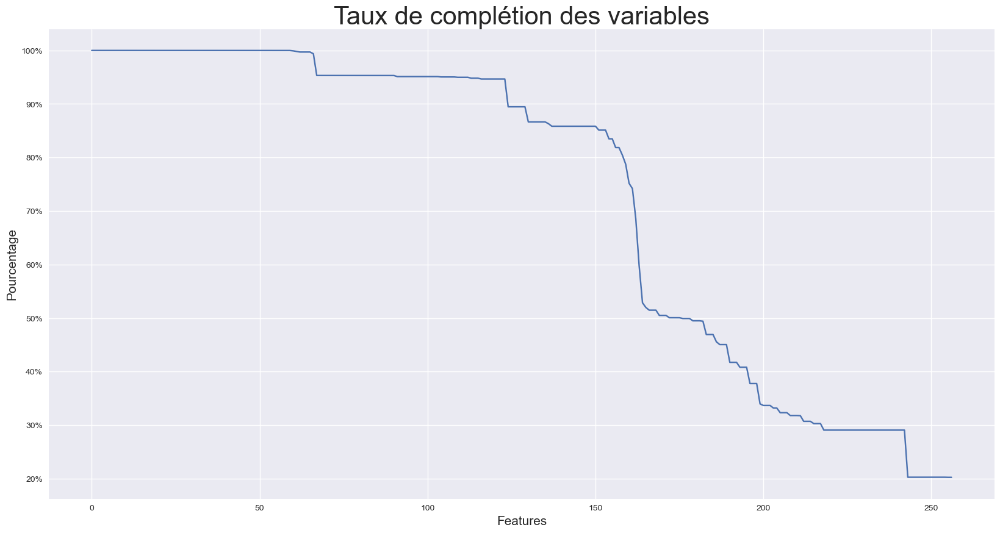

In [53]:

# Graphique Taux de remplissage
fig, ax = plt.subplots(figsize=(20, 10))

x = range(df_all.shape[1])
y = non_null_percents

plt.title("Taux de complétion des variables", fontsize=30)
plt.xlabel("Features", fontsize=15)
plt.ylabel("Pourcentage", fontsize=15)
ax.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
plot = ax.plot(x, y)


In [54]:
# Calculer le seuil de 60% des valeurs manquantes
threshold = 0.6 * len(df_all)

# Éliminer les colonnes avec plus de 60% de valeurs manquantes
df_all_cleaned = df_all.dropna(thresh=threshold, axis=1)

# Afficher les dimensions du dataframe après avoir éliminé les colonnes
print("Dimensions de df_all après élimination des colonnes avec plus de 60% de valeurs manquantes :", df_all_cleaned.shape)


Dimensions de df_all après élimination des colonnes avec plus de 60% de valeurs manquantes : (356255, 163)


In [55]:
# Calculer les pourcentages de NaN pour chaque colonne
pourcentages_nan = (df_all.isna().mean() * 100).round(2)

# Créer un DataFrame avec les noms des colonnes et les pourcentages de NaN
df_pourcentages_nan = pd.DataFrame({'Nom de la Colonne': pourcentages_nan.index, 'Pourcentage de NaN': pourcentages_nan.values})

# Trier le DataFrame par pourcentage de NaN en ordre décroissant
df_pourcentages_nan = df_pourcentages_nan.sort_values(by='Pourcentage de NaN', ascending=False)

# Afficher le DataFrame trié
display(df_pourcentages_nan)

,Nom de la Colonne,Pourcentage de NaN
236,CC_AMT_PAYMENT_CURRENT_MAX,79.76
237,CC_AMT_PAYMENT_CURRENT_MEAN,79.76
233,CC_AMT_DRAWINGS_POS_CURRENT_MEAN,79.74
226,CC_AMT_DRAWINGS_ATM_CURRENT_MAX,79.74
253,CC_CNT_DRAWINGS_POS_CURRENT_MEAN,79.74
...,...,...
39,LIVE_CITY_NOT_WORK_CITY,0.00
38,REG_CITY_NOT_WORK_CITY,0.00
37,REG_CITY_NOT_LIVE_CITY,0.00
36,LIVE_REGION_NOT_WORK_REGION,0.00


In [56]:
df_all.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,...,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_COUNT,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT,CC_MONTHS_BALANCE_MIN,CC_MONTHS_BALANCE_MAX,CC_MONTHS_BALANCE_MEAN,CC_MONTHS_BALANCE_SIZE,CC_AMT_BALANCE_MAX,CC_AMT_BALANCE_MEAN,CC_AMT_CREDIT_LIMIT_ACTUAL_MAX,CC_AMT_CREDIT_LIMIT_ACTUAL_MEAN,CC_AMT_DRAWINGS_ATM_CURRENT_MAX,CC_AMT_DRAWINGS_ATM_CURRENT_MEAN,CC_AMT_DRAWINGS_CURRENT_MAX,CC_AMT_DRAWINGS_CURRENT_MEAN,CC_AMT_DRAWINGS_OTHER_CURRENT_MAX,CC_AMT_DRAWINGS_OTHER_CURRENT_MEAN,CC_AMT_DRAWINGS_POS_CURRENT_MAX,CC_AMT_DRAWINGS_POS_CURRENT_MEAN,CC_AMT_INST_MIN_REGULARITY_MAX,CC_AMT_INST_MIN_REGULARITY_MEAN,CC_AMT_PAYMENT_CURRENT_MAX,CC_AMT_PAYMENT_CURRENT_MEAN,CC_AMT_PAYMENT_TOTAL_CURRENT_MAX,CC_AMT_PAYMENT_TOTAL_CURRENT_MEAN,CC_AMT_RECEIVABLE_PRINCIPAL_MAX,CC_AMT_RECEIVABLE_PRINCIPAL_MEAN,CC_AMT_RECIVABLE_MAX,CC_AMT_RECIVABLE_MEAN,CC_AMT_TOTAL_RECEIVABLE_MAX,CC_AMT_TOTAL_

In [57]:
df_all = df_all_cleaned

In [58]:
# Calculer les pourcentages de NaN pour chaque colonne
pourcentages_nan = (df_all.isna().mean() * 100).round(2)

# Créer un DataFrame avec les noms des colonnes et les pourcentages de NaN
df_pourcentages_nan = pd.DataFrame({'Nom de la Colonne': pourcentages_nan.index, 'Pourcentage de NaN': pourcentages_nan.values})

# Trier le DataFrame par pourcentage de NaN en ordre décroissant
df_pourcentages_nan = df_pourcentages_nan.sort_values(by='Pourcentage de NaN', ascending=False)

# Afficher le DataFrame trié
display(df_pourcentages_nan)

,Nom de la Colonne,Pourcentage de NaN
27,OCCUPATION_TYPE,31.44
81,BURO_DAYS_CREDIT_VAR,25.81
111,PREV_APP_CREDIT_PERC_VAR,24.82
95,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,21.26
41,EXT_SOURCE_3,19.55
...,...,...
39,ORGANIZATION_TYPE,0.00
38,LIVE_CITY_NOT_WORK_CITY,0.00
37,REG_CITY_NOT_WORK_CITY,0.00
35,LIVE_REGION_NOT_WORK_REGION,0.00


In [59]:
# Supprimer les lignes contenant des valeurs manquantes
df_all_cleaned = df_all.dropna()

# Compter le nombre de colonnes restantes
num_variables_sans_nan = len(df_all_cleaned.columns)

print("Nombre de variables sans NaN dans leurs lignes :", num_variables_sans_nan)

Nombre de variables sans NaN dans leurs lignes : 163


In [60]:
df_all['TARGET'].value_counts()

0.0    282686
1.0     24825
Name: TARGET, dtype: int64

In [61]:
import numpy as np

# Filtrer les lignes où OCCUPATION_TYPE a des valeurs manquantes
rows_with_nan_occupation_type = df_all[pd.isnull(df_all['OCCUPATION_TYPE'])]

# ou utilisez np.isnan() pour le même résultat
# rows_with_nan_occupation_type = df_all[np.isnan(df_all['OCCUPATION_TYPE'])]

# Afficher les lignes où OCCUPATION_TYPE a des valeurs manquantes
display(rows_with_nan_occupation_type)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_BB_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_COUNT,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
8,100011,0.0,Cash loans,F,N,Y,0,112500.000,1019610.0,33826.5,913500.0,Children,Pensioner,Secondary / secondary special,Married,House / apartment,0.018634,-20099,NaN,-7427.0,-3514,1,0,0,1,0,0,NaN,2.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,XNA,0.205747,0.751724,1.0,0.0,1.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,NaN,0.110336,56250.0000,0.300680,0.033176,-2508.0,-1309.0,-1773.000000,3.334180e+05,-2173.0,-860.0,-1293.250000,-1454.750000,0.0,0.0,145242.0,108807.075,

In [62]:
display(df_all[np.isnan(df_all['TARGET'])])

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_BB_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_COUNT,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
307511,100001,NaN,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329.0,-5170.0,-812,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.789654,0.159520,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.121044,0.237342,67500.0,0.152300,0.036147,-1572.0,-49.0,-735.000000,240043.666667,-1329.0,1778.0,82.428571,-93.142857,0.0,0.0,378000.00,2.076236e

In [63]:
def afficher_scores(grid_search, tri=True):
    """Affiche les scores et les paramètres de GridSearch ou GridSearchCV.

    Args:
    - grid_search: instance de GridSearch après cross-validation.
    - tri: booléen pour effectuer un tri des scores.

    Returns:
    - Affiche les scores et les paramètres correspondants.
    """

    # Extraire les résultats de la recherche
    scores = grid_search.cv_results_['mean_test_score']
    params = grid_search.cv_results_['params']

    # Créer une liste de tuples (score, paramètres)
    scores_params = list(zip(scores, params))

    # Tri des scores si tri est True
    if tri:
        scores_params.sort(key=lambda x: x[0], reverse=True)

    # Affichage des scores et des paramètres
    for score, param in scores_params:
        print(f"Score : {score:.4f}, Paramètres : {param}")

# Exemple d'utilisation


In [64]:
# Sélectionner les colonnes catégorielles
categorical_columns = df_all.select_dtypes(include=['object']).columns

# Afficher les données catégorielles
categorical_data = df_all[categorical_columns]
display(categorical_data)


,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion
...,...,...,...,...,...,...,...,...,...,...,...,...
356250,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,NaN,WEDNESDAY,Other
356251,Cash loans,F,N,N,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,Sales staff,MONDAY,Trade: type 7
356252,Cash loans,F,Y,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,NaN,WEDNESDAY,Business Entity Type 3
356253,Cash loans,M,N,N,Family,Commercial associate,Higher education,Married,House / apartment,Managers,MONDAY,Self-employed


In [65]:
df_all.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_BB_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_COUNT,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
count,356255.000000,307511.000000,356255.000000,3.562550e+05,3.562550e+05,356219.000000,3.559770e+05,356255.000000,356255.000000,291607.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356253.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,3.555870e+05,286622.000000,355205.000000,355205.000000,355205.000000,355205.000000,356254.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000000,356255.000

In [66]:
# Sélectionner les colonnes de type catégorie
categorical_columns = df_all.select_dtypes(include=['category']).columns

# Afficher la liste des variables de type catégorie
print(categorical_columns)


Index([], dtype='object')


In [67]:
for col in df_all.columns:
    if df_all[col].dtype == 'object' or df_all[col].dtype.name == 'category':
        print(col)


NAME_CONTRACT_TYPE
CODE_GENDER
FLAG_OWN_CAR
FLAG_OWN_REALTY
NAME_TYPE_SUITE
NAME_INCOME_TYPE
NAME_EDUCATION_TYPE
NAME_FAMILY_STATUS
NAME_HOUSING_TYPE
OCCUPATION_TYPE
WEEKDAY_APPR_PROCESS_START
ORGANIZATION_TYPE


In [68]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 356255 entries, 0 to 356254
Columns: 163 entries, SK_ID_CURR to INSTAL_COUNT
dtypes: float64(112), int64(39), object(12)
memory usage: 443.0+ MB


In [69]:
df_all['CODE_GENDER'].value_counts()

F      235126
M      121125
XNA         4
Name: CODE_GENDER, dtype: int64

In [70]:
# Compter les occurrences de chaque valeur dans la colonne CODE_GENDER
gender_counts = df_all['CODE_GENDER'].value_counts()

# Obtenir la valeur la plus fréquente (à l'exception de 'XNA')
most_frequent_gender = gender_counts.index[0]

# Remplacer les occurrences de 'XNA' par la valeur la plus fréquente (F)
df_all['CODE_GENDER'] = df_all['CODE_GENDER'].replace('XNA', most_frequent_gender)


In [71]:
df_all['CODE_GENDER'].value_counts()

F    235130
M    121125
Name: CODE_GENDER, dtype: int64

In [72]:
# Importer la classe MeanMedianImputer du module feature-engine.imputation
from feature_engine.imputation import MeanMedianImputer

# Créer une instance de l'imputeur en spécifiant la méthode d'imputation (median)
imputer = MeanMedianImputer(imputation_method='median')

# Ajuster l'imputeur sur les données 
imputer.fit(df_all)

# Imputer les valeurs manquantes dans X_train en utilisant la médiane
df_all_imputed = imputer.transform(df_all)

# Imputer les valeurs manquantes dans X_test en utilisant la médiane
#X_test_imputed = imputer.transform(X_test)

# Noter que l'on peut également effectuer l'imputation directement sur le df sans ajuster explicitement l'imputeur
# df_imputed = imputer.fit_transform(df)
# X_test_imputed = imputer.transform(X_test)

# Nous pouvons vérifier les variables qui ont été imputées en utilisant l'attribut variables_ de l'imputeur
print(imputer.variables_)


['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14'

In [73]:
imputer.imputer_dict_

{'SK_ID_CURR': 278128.0,
 'TARGET': 0.0,
 'CNT_CHILDREN': 0.0,
 'AMT_INCOME_TOTAL': 153000.0,
 'AMT_CREDIT': 500211.0,
 'AMT_ANNUITY': 25078.5,
 'AMT_GOODS_PRICE': 450000.0,
 'REGION_POPULATION_RELATIVE': 0.01885,
 'DAYS_BIRTH': -15755.0,
 'DAYS_EMPLOYED': -1663.0,
 'DAYS_REGISTRATION': -4502.0,
 'DAYS_ID_PUBLISH': -3252.0,
 'FLAG_MOBIL': 1.0,
 'FLAG_EMP_PHONE': 1.0,
 'FLAG_WORK_PHONE': 0.0,
 'FLAG_CONT_MOBILE': 1.0,
 'FLAG_PHONE': 0.0,
 'FLAG_EMAIL': 0.0,
 'CNT_FAM_MEMBERS': 2.0,
 'REGION_RATING_CLIENT': 2.0,
 'REGION_RATING_CLIENT_W_CITY': 2.0,
 'HOUR_APPR_PROCESS_START': 12.0,
 'REG_REGION_NOT_LIVE_REGION': 0.0,
 'REG_REGION_NOT_WORK_REGION': 0.0,
 'LIVE_REGION_NOT_WORK_REGION': 0.0,
 'REG_CITY_NOT_LIVE_CITY': 0.0,
 'REG_CITY_NOT_WORK_CITY': 0.0,
 'LIVE_CITY_NOT_WORK_CITY': 0.0,
 'EXT_SOURCE_2': 0.5648491432489063,
 'EXT_SOURCE_3': 0.5334816299804352,
 'OBS_30_CNT_SOCIAL_CIRCLE': 0.0,
 'DEF_30_CNT_SOCIAL_CIRCLE': 0.0,
 'OBS_60_CNT_SOCIAL_CIRCLE': 0.0,
 'DEF_60_CNT_SOCIAL_CIRCLE': 0.

In [74]:
df_all_imputed[imputer.variables_].isnull().mean()

SK_ID_CURR                        0.0
TARGET                            0.0
CNT_CHILDREN                      0.0
AMT_INCOME_TOTAL                  0.0
AMT_CREDIT                        0.0
                                 ... 
INSTAL_AMT_PAYMENT_SUM            0.0
INSTAL_DAYS_ENTRY_PAYMENT_MAX     0.0
INSTAL_DAYS_ENTRY_PAYMENT_MEAN    0.0
INSTAL_DAYS_ENTRY_PAYMENT_SUM     0.0
INSTAL_COUNT                      0.0
Length: 151, dtype: float64

In [75]:
# Calculer les pourcentages de NaN pour chaque colonne
pourcentages_nan = (df_all_imputed.isna().mean() * 100).round(2)

# Créer un DataFrame avec les noms des colonnes et les pourcentages de NaN
df_pourcentages_nan = pd.DataFrame({'Nom de la Colonne': pourcentages_nan.index, 'Pourcentage de NaN': pourcentages_nan.values})

# Trier le DataFrame par pourcentage de NaN en ordre décroissant
df_pourcentages_nan = df_pourcentages_nan.sort_values(by='Pourcentage de NaN', ascending=False)

# Afficher le DataFrame trié
display(df_pourcentages_nan)

,Nom de la Colonne,Pourcentage de NaN
27,OCCUPATION_TYPE,31.44
11,NAME_TYPE_SUITE,0.62
0,SK_ID_CURR,0.00
106,PREV_AMT_CREDIT_MAX,0.00
107,PREV_AMT_CREDIT_MEAN,0.00
...,...,...
57,FLAG_DOCUMENT_12,0.00
58,FLAG_DOCUMENT_13,0.00
59,FLAG_DOCUMENT_14,0.00
60,FLAG_DOCUMENT_15,0.00


In [76]:
# Compter le nombre de valeurs infinies dans le DataFrame
count_infinite = df_all_imputed.isin([np.inf, -np.inf]).sum().sum()

# Afficher le nombre de valeurs infinies
print("Nombre de valeurs infinies : ", count_infinite)

Nombre de valeurs infinies :  20


In [77]:
print(df_all_imputed.dtypes)

SK_ID_CURR                          int64
TARGET                            float64
NAME_CONTRACT_TYPE                 object
CODE_GENDER                        object
FLAG_OWN_CAR                       object
                                   ...   
INSTAL_AMT_PAYMENT_SUM            float64
INSTAL_DAYS_ENTRY_PAYMENT_MAX     float64
INSTAL_DAYS_ENTRY_PAYMENT_MEAN    float64
INSTAL_DAYS_ENTRY_PAYMENT_SUM     float64
INSTAL_COUNT                      float64
Length: 163, dtype: object


In [78]:
# Sélectionner les lignes où n'importe quelle valeur est "inf"
rows_with_inf = df_all_imputed[df_all_imputed.isin([np.inf, -np.inf]).any(axis=1)]

# Afficher les lignes avec des valeurs "inf"
display(rows_with_inf)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_BB_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_MEAN,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,POS_COUNT,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
5687,106652,0.0,Cash loans,F,N,N,0,112500.0,760225.5,30150.0,679500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.019101,-17639,-10422.0,-3061.0,-1154,1,1,0,1,0,0,NaN,2.0,2,2,SATURDAY,19,0,0,0,0,0,0,Business Entity Type 3,0.558788,0.837747,5.0,0.0,5.0,0.0,-542.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.590850,0.147982,56250.0,0.268000,0.039659,-1822.0,-305.0,-1052.500000,3.803969e+05,-1272.0,912.0,-131.788889,-479.300000,0

In [79]:
# Calculer les valeurs les plus fréquentes de chaque colonne
modes = df_all_imputed.mode()

# Remplacer les valeurs "inf" par les valeurs les plus fréquentes de chaque colonne
df_all_imputed = df_all_imputed.apply(lambda x: x.replace([np.inf, -np.inf], modes[x.name][0]))

In [80]:
# Compter le nombre de valeurs infinies dans le DataFrame
count_infinite = df_all_imputed.isin([np.inf, -np.inf]).sum().sum()

# Afficher le nombre de valeurs infinies
print("Nombre de valeurs infinies : ", count_infinite)

Nombre de valeurs infinies :  0


In [81]:
#Graphique de la courbe ROC pour l'ensemble de validation.¶

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
import seaborn as sns

def plot_roc_and_proba(clf, X_validation, y_validation, titre="Courbe ROC"):
    # Calcul des probabilités prédites
    y_proba = clf.predict_proba(X_validation)[:, 1]

    # Calcul de la courbe ROC
    fpr, tpr, _ = roc_curve(y_validation, y_proba)

    # Calcul de l'AUC
    auc = roc_auc_score(y_validation, y_proba)

    # Affichage de la courbe ROC
    plt.figure(figsize=(10, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='Courbe ROC (AUC = {:.2f})'.format(auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('Taux de faux positifs')
    plt.ylabel('Taux de vrais positifs')
    plt.title(titre)
    plt.legend(loc='lower right')
    plt.show()

    # Affichage de l'histogramme des probabilités prédites
    plt.figure(figsize=(10, 6))
    sns.histplot(y_proba, kde=True, bins=30)
    plt.xlabel('Probabilité prédite')
    plt.ylabel('Fréquence')
    plt.title('Distribution des Probabilités Prédites')
    plt.show()


In [82]:
import re
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder

def prepare_data_for_lgbm(df_input, test_size=0.1):
    """
    Prépare les données pour être utilisées avec le modèle LightGBM.

    Args:
    - df_input : Le dataframe en entrée.6.
    +
    - test_size : Ratio de train_test_split.

    Returns:
    - X_train, X_test, y_train, X_train_split, X_valid_split, y_train_split, y_valid_split,
      categorical_features, categorical_feature_values, df_test
    """

    # Vérification du type de l'entrée
    if not isinstance(df_input, pd.DataFrame):
        raise ValueError("L'entrée doit être un objet de type DataFrame.")

    # Copie du dataframe d'entrée pour éviter de modifier les données d'origine
    df = df_input.copy()

    # Identification des variables catégorielles
    categorical_features = [col for col in df.columns if df[col].dtype == 'object']

    # Remplacement des NaN par 'NAN' dans les variables catégorielles
    df[categorical_features] = df[categorical_features].fillna('NAN')

    # Encodage des variables catégorielles avec l'encodeur ordinal
    ordinal_enc = OrdinalEncoder(dtype=int)
    df[categorical_features] = ordinal_enc.fit_transform(df[categorical_features])

    # Préparation des ensembles d'entraînement et de test
    features_to_exclude = ['TARGET', 'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV', 'index']
    features = [col for col in df.columns if col not in features_to_exclude]

    X_train = df[df['TARGET'].notnull()][features]
    y_train = df[df['TARGET'].notnull()]['TARGET']
    X_test = df[df['TARGET'].isnull()][features]
    df_test = df[df['TARGET'].isnull()]

    # Split des données avec stratification
    X_train_split, X_valid_split, y_train_split, y_valid_split = train_test_split(
        X_train, y_train, test_size=test_size, stratify=y_train, random_state=0)

    # Renommage des objets pour plus de clarté
    X_train_split, X_valid_split = X_train_split.copy(), X_valid_split.copy()
    y_train_split, y_valid_split = y_train_split.copy(), y_valid_split.copy()

    # Nettoyage des noms de colonnes pour éviter les erreurs avec LightGBM
    X_train_split.columns = [re.sub('[^A-Za-z0-9_]+', '', col) for col in X_train_split.columns]
    X_valid_split.columns = [re.sub('[^A-Za-z0-9_]+', '', col) for col in X_valid_split.columns]

    print("Shape de l'ensemble d'entraînement :", X_train.shape)
    print("Shape de l'ensemble de test :", X_test.shape)
    print("Shape de l'ensemble d'entraînement (split) :", X_train_split.shape)
    print("Shape de l'ensemble de validation (split) :", X_valid_split.shape)

    # Création d'un dictionnaire des catégories catégorielles pour référence future
    categorical_feature_values = {}
    for feature, categories in zip(categorical_features, ordinal_enc.categories_):
        categorical_feature_values[feature] = list(categories)

    return X_train, X_test, y_train, X_train_split, X_valid_split, y_train_split, y_valid_split, categorical_features, categorical_feature_values, df_test


In [83]:

# Appel de la fonction pour préparer les données
X_train, X_test, y_train, X_Xtrain, X_val, y_ytrain, y_val, categorical_features, categorical_feature_values, df_test = prepare_data_for_lgbm(df_all_imputed)

# Vérification des shapes des ensembles de données
print("Shape de l'ensemble d'entraînement :", X_train.shape)
print("Shape de l'ensemble de test :", X_test.shape)
print("Shape de l'ensemble d'entraînement (split) :", X_Xtrain.shape)
print("Shape de l'ensemble de validation (split) :", X_val.shape)


Shape de l'ensemble d'entraînement : (356255, 161)
Shape de l'ensemble de test : (0, 161)
Shape de l'ensemble d'entraînement (split) : (320629, 161)
Shape de l'ensemble de validation (split) : (35626, 161)
Shape de l'ensemble d'entraînement : (356255, 161)
Shape de l'ensemble de test : (0, 161)
Shape de l'ensemble d'entraînement (split) : (320629, 161)
Shape de l'ensemble de validation (split) : (35626, 161)


In [84]:
categorical_features = df_all.select_dtypes(include=['object']).columns
categorical_features

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE'],
      dtype='object')

In [85]:
categorical_feature_values

{'NAME_CONTRACT_TYPE': ['Cash loans', 'Revolving loans'],
 'CODE_GENDER': ['F', 'M'],
 'FLAG_OWN_CAR': ['N', 'Y'],
 'FLAG_OWN_REALTY': ['N', 'Y'],
 'NAME_TYPE_SUITE': ['Children',
  'Family',
  'Group of people',
  'NAN',
  'Other_A',
  'Other_B',
  'Spouse, partner',
  'Unaccompanied'],
 'NAME_INCOME_TYPE': ['Businessman',
  'Commercial associate',
  'Maternity leave',
  'Pensioner',
  'State servant',
  'Student',
  'Unemployed',
  'Working'],
 'NAME_EDUCATION_TYPE': ['Academic degree',
  'Higher education',
  'Incomplete higher',
  'Lower secondary',
  'Secondary / secondary special'],
 'NAME_FAMILY_STATUS': ['Civil marriage',
  'Married',
  'Separated',
  'Single / not married',
  'Unknown',
  'Widow'],
 'NAME_HOUSING_TYPE': ['Co-op apartment',
  'House / apartment',
  'Municipal apartment',
  'Office apartment',
  'Rented apartment',
  'With parents'],
 'OCCUPATION_TYPE': ['Accountants',
  'Cleaning staff',
  'Cooking staff',
  'Core staff',
  'Drivers',
  'HR staff',
  'High skil

In [86]:
# Calculer les pourcentages de NaN pour chaque colonne
pourcentages_nan = (X_Xtrain.isna().mean() * 100).round(2)

# Créer un DataFrame avec les noms des colonnes et les pourcentages de NaN
df_pourcentages_nan = pd.DataFrame({'Nom de la Colonne': pourcentages_nan.index, 'Pourcentage de NaN': pourcentages_nan.values})

# Trier le DataFrame par pourcentage de NaN en ordre décroissant
df_pourcentages_nan = df_pourcentages_nan.sort_values(by='Pourcentage de NaN', ascending=False)

# Afficher le DataFrame trié
display(df_pourcentages_nan)

,Nom de la Colonne,Pourcentage de NaN
0,NAME_CONTRACT_TYPE,0.0
81,BURO_DAYS_CREDIT_ENDDATE_MAX,0.0
103,PREV_AMT_CREDIT_MIN,0.0
104,PREV_AMT_CREDIT_MAX,0.0
105,PREV_AMT_CREDIT_MEAN,0.0
...,...,...
55,FLAG_DOCUMENT_12,0.0
56,FLAG_DOCUMENT_13,0.0
57,FLAG_DOCUMENT_14,0.0
58,FLAG_DOCUMENT_15,0.0


In [87]:
y_ytrain.value_counts()

0.0    298287
1.0     22342
Name: TARGET, dtype: int64

In [88]:
y_ytrain.head(5)

326855    0.0
277896    0.0
304597    0.0
207315    0.0
205669    0.0
Name: TARGET, dtype: float64

## Classifieur Naïf: Dummy classifier

 Le DummyClassifier est en effet un classificateur naïf qui fournit une implémentation simple pour un modèle de référence.
 
Il est principalement utilisé comme base de comparaison pour évaluer la performance de modèles de classification plus sophistiqués.

Le DummyClassifier génère des prédictions en suivant des règles simples basées sur la distribution des classes dans les données d'entraînement.

Par exemple, dans le cas d'une classification binaire, il peut prédire toujours la classe majoritaire, toujours la classe minoritaire ou prédire aléatoirement en fonction des proportions de classes.

Utiliser le DummyClassifier peut être utile dans les situations suivantes :

Modèle de Référence : Il sert de modèle de référence naïf. Tout modèle que vous construisez doit au moins être capable de faire mieux que ce modèle naïf.

Détecter des Problèmes : Si votre modèle sophistiqué ne peut pas surperformer par rapport au DummyClassifier, cela peut indiquer qu'il y a un problème dans la façon dont vous construisez ou entraînez votre modèle.

Évaluation Initiale : Il peut être utilisé lors des premières étapes de développement d'un modèle pour avoir une idée initiale de la performance minimale à attendre.

In [89]:


# Instancier le DummyClassifier
dummy_clf = DummyClassifier(strategy='most_frequent')  # Vous pouvez ajuster la stratégie selon vos besoins

# Entraîner le modèle sur les données suréchantillonnées
dummy_clf.fit(X_Xtrain, y_ytrain)

# Faire des prédictions
y_pred = dummy_clf.predict(X_val) 

# Évaluer la performance du modèle
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_val, y_pred)

print("Accuracy du DummyClassifier : {:.2f}%".format(accuracy * 100))

Accuracy du DummyClassifier : 93.03%


In [90]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve, auc

# calculate f2-measure
def f2_measure(y_true, y_pred):
    return fbeta_score(y_true, y_pred, beta=2)

def custom_score(estimator, X_train, y_train, X_val, y_val):
    # Calculer les prédictions sur les données de validation
    y_pred = estimator.predict(X_val)
    
    # Calculer les taux de faux positifs et de vrais positifs
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_val, y_pred)

    # Calculer l'aire sous la courbe ROC (AUC)
    roc_auc = auc(false_positive_rate, true_positive_rate)

    # Afficher l'AUC
    print("Aire sous la courbe ROC (AUC):", roc_auc)
    
    # Calculer les métriques
    accuracy = accuracy_score(y_val, y_pred)
    precision = precision_score(y_val, y_pred)
    recall = recall_score(y_val, y_pred)
    f1 = f1_score(y_val, y_pred)
    f2 = f2_measure(y_val, y_pred)
    
    # Afficher les métriques
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"F2 Score: {f1:.4f}")
    print()
    tr_score = estimator.score(X_train, y_train).round(4)
    te_score = estimator.score(X_val, y_val).round(4)
    print(f"score train:{tr_score} score test:{te_score}")
    print()
    # Afficher les proportions des classes dans y_train et y_val
    print("Proportion des classes dans y_train:")
    print(y_train.value_counts(normalize=True).round(4))
    print()
    print('_________________________________________')
    print()
    print("Proportion des classes dans y_val:")
    print(y_val.value_counts(normalize=True).round(4))
    print()
    print('_________________________________________')
    print()
    # Calculer et afficher la matrice de confusion sur y_val
    y_pred = estimator.predict(X_val)
    mat = confusion_matrix(y_val, y_pred)
    mat = pd.DataFrame(mat)
    mat.columns = [f"pred_{i}" for i in mat.columns]
    mat.index = [f"test_{i}" for i in mat.index]
    print("Matrice de confusion sur y_val:")
    display(mat)

In [91]:
# Utilisation de la fonction custom_score avec un modèle DummyClassifier par exemple
custom_score(dummy_clf, X_Xtrain, y_ytrain, X_val, y_val)

Aire sous la courbe ROC (AUC): 0.5
Accuracy: 0.9303
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
F2 Score: 0.0000

score train:0.9303 score test:0.9303

Proportion des classes dans y_train:
0.0    0.9303
1.0    0.0697
Name: TARGET, dtype: float64

_________________________________________

Proportion des classes dans y_val:
0.0    0.9303
1.0    0.0697
Name: TARGET, dtype: float64

_________________________________________

Matrice de confusion sur y_val:


,pred_0,pred_1
test_0,33143,0
test_1,2483,0


### Fonction de coût métier

-VN = Vrai Négatif (Crédit octroyé à un client qui rembourse)

-FN = Faux Négatif (Crédit Octroyé à un client qui ne rembourse pas)

-VP = Vrai Positif (Crédit Refusé  à un Client qui n'aurait pas remboursé )

-FP = Faux Positif (Crédit Refusé  à un client qui aurait remboursé)


Le taux de vrai positif est appelé la sensibilité. 

L'inverse, taux de faux positifs est appelé la Spécificité.

**Sensibilité (TVP)** = Vrai Positif (VP) / (Vrai Positif (VP) + Faux Negatif (FN))

Sensibilité =  Recall

Précision = Precision


**Spécificité (TFP)** = Vrai Negatif (VN) / (Faux Positif (FP) + Vrai Negatif (VF))

**Précision** = VP/(VP+FP) 


En d'autres termes, la précision indique combien de fois le modèle a correctement prédit la classe positive parmi toutes les fois où il a prédit la classe positive. 

C'est une mesure importante, surtout lorsque le coût des faux positifs est élevé.

Un modèle avec une haute précision est capable de minimiser le nombre de fausses alertes lorsqu'il prédit la classe positive.

**La fonction coût sera déterminée par l'analyse des erreurs de prédiction**

FP (False Positive) : les cas où la prédiction est positive, mais où la valeur réelle est négative.

Perte d'opportunité si le crédit client est refusé à tort, alors qu'il aurait été en mesure d'être remboursé.

FN (False Negative) : les cas où la prédiction est négative, mais où la valeur réelle est positive.

Perte réelle si le crédit client accepté se transforme en défaut de paiement.

Les pertes d'un crédit en raison d'une mauvaise classification dépendront des probabilités **Faux Positifs** et **Faux Négatifs**.



L'objectif est de minimiser les risques associés aux clients présentant un haut risque de défaut de paiement. 

Par conséquent, il est crucial de réduire à la fois les faux positifs et les faux négatifs mentionnés précédemment. 

Cette stratégie vise à minimiser le risque financier en maximisant à la fois le rappel (recall, Sensibilité) et la précision.


#### Fonction qui optimise Precision et Recall

En introduisant le coefficient β, qui représente l'importance relative de la précision par rapport au rappel :

Fscore = (precision.recall)/β².(precision + recall)

**Fscore = [(1+β²).VP] / [(1+β²).VP + β².FN + FP]**

L'utilisation de cette métrique métier implique d'évaluer l'importance relative entre le rappel et la précision, représentée par le coefficient β. 

Cela implique d'estimer le coût moyen d'un défaut et le coût d'opportunité associé à un client rejeté par erreur.

Bien que ces informations métier ne soient pas encore disponibles à ce stade du projet, nous allons les estimer.

Cette hypothèse pourra être ajustée ultérieurement en consultation avec les parties prenantes métier.

Coût par client qui fait Défaut de paiement et frais de recouvrement: **30%** du montant du crédit en pertes

Les FN pèsent plus que les FP

Chance d'obtenir un crédit pour un client quelconque: **10%**

    **β = coef Recall / coef Precision**



In [92]:
# Code 1 : Définir la fonction de score personnalisée
# **Hypothèse: β = 3**
# C'est la fonction Fbeta_score des scikit-learn
def custom_score(y_true, y_pred, beta=3):
    vp, vn, fp, fn = confusion_matrix(y_true, y_pred).ravel()
    recall = vp / (vp + fn)
    
    precision = vp / (vp + fp)
    fscore = (1 + beta) * ((vp / ((1 + beta) * vp + beta * fn + fp)))
    return 1 - fscore

In [93]:
## Coût métier selon nos hyphothèses
def cout_metier(y_true, y_pred, cout_fn = 10, cout_fp = 1 ):
    vp, vn, fp, fn = confusion_matrix(y_true, y_pred).ravel()
    cout = cout_fn*fn + cout_fp*fp
    return cout

In [94]:
# Code 2 : Définir la fonction de coût personnalisée
def cost_false(model, y_true, X_true):
    cm = confusion_matrix(y_true, model.predict(X_true))
    FP = cm[0][1] / np.sum(cm)
    FN = cm[1][0] / np.sum(cm)
    return FP, FN

In [95]:
from sklearn.metrics import make_scorer


# Création du score métier en utilisant make_scorer
custom_scorer = make_scorer(custom_score, greater_is_better=False)

# Utilisation du score métier dans GridSearchCV ou d'autres méthodes d'optimisation
# Par exemple, dans GridSearchCV :
# grid_search = GridSearchCV(estimator, param_grid, scoring=custom_scorer, cv=5)


In [96]:
# calculate f2-measure
def f2_measure(y_true, y_pred):
    return fbeta_score(y_true, y_pred, beta=2)

In [97]:

# evaluate a model
def evaluate_model(X, y, model):
    # define evaluation procedure
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=101)
    # define the model evaluation metric
    metric = make_scorer(f2_measure)
    # evaluate model
    scores = cross_val_score(model, X, y, scoring=metric, cv=cv, n_jobs=-2)
    return scores

# evaluate a model
def evaluate_model_2(X, y, model):
    # define evaluation procedure
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=101)
    # evaluate model
    scores = cross_val_score(model, X, y, scoring=custom_scorer, cv=cv, n_jobs=-2)
    return scores


In [98]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve, auc

def classification_metrics(estimator, X_train, y_train, X_val, y_val):
    # Calculer les prédictions sur les données de validation
    y_pred = estimator.predict(X_val)
    
    y_true = y_val


    
    # Calculer les taux de faux positifs et de vrais positifs
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_val, y_pred)

    # Calculer l'aire sous la courbe ROC (AUC)
    roc_auc = auc(false_positive_rate, true_positive_rate)

    # Afficher l'AUC
    print("Aire sous la courbe ROC (AUC):", roc_auc)
    
    # Calculer les métriques
    def cout_metier(y_true, y_pred, cout_fn = 10, cout_fp = 1 ):
        vp, vn, fp, fn = confusion_matrix(y_true, y_pred).ravel()
        cout = cout_fn*fn + cout_fp*fp
        return cout

        
    

    classification_metrics
    accuracy = accuracy_score(y_val, y_pred)
    precision = precision_score(y_val, y_pred)
    recall = recall_score(y_val, y_pred)
    f1 = f1_score(y_val, y_pred)
    f2 = f2_measure(y_true, y_pred)
    cout_metier_value = cout_metier(y_true, y_pred)
    
    # Afficher les métriques
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"F2 Score: {f2:.4f}")
    print(f"Cout_metier:{cout_metier_value:.4f}")
    print()
    tr_score = estimator.score(X_train, y_train).round(4)
    te_score = estimator.score(X_val, y_val).round(4)
    print(f"score train:{tr_score} score test:{te_score}")
    print()
    # Afficher les proportions des classes dans y_train et y_val
    print("Proportion des classes dans y_train:")
    print(y_train.value_counts(normalize=True).round(4))
    print()
    print('_________________________________________')
    print()
    print("Proportion des classes dans y_val:")
    print(y_val.value_counts(normalize=True).round(4))
    print()
    print('_________________________________________')
    print()
    # Calculer et afficher la matrice de confusion sur y_val
    y_pred = estimator.predict(X_val)
    mat = confusion_matrix(y_val, y_pred)
    mat = pd.DataFrame(mat)
    mat.columns = [f"pred_{i}" for i in mat.columns]
    mat.index = [f"test_{i}" for i in mat.index]
    print("Matrice de confusion sur y_val:")
    display(mat)

**Standardisation**

In [99]:
X_Xtrain.shape, X_val.shape

((320629, 161), (35626, 161))

In [100]:
from sklearn.preprocessing import StandardScaler
# Standardisation des données

scaler = StandardScaler()
scaler.fit(X_Xtrain)

X_train_sd = scaler.transform(X_Xtrain)
X_val_sd = scaler.transform(X_val)

In [101]:
# Transformation des matrices standardisées en dataframe pour avoir les noms des variables

X_train_sd_df = pd.DataFrame(X_train_sd, columns=list(X_Xtrain))
X_val_sd_df = pd.DataFrame(X_val_sd, columns=list(X_Xtrain))
y_train_df = pd.DataFrame(y_ytrain)
y_val_df = pd.DataFrame(y_val)

## Classification Sans prise en compte du déséquilibre

### Logistic Regression

In [102]:
#Preprocessing, Upsampling, Model Selection, Model Evaluation

warnings.filterwarnings("ignore")


In [103]:
from sklearn.linear_model import LogisticRegression

In [104]:
logistic_regression = LogisticRegression(C = 0.0001, max_iter=100)
logistic_regression.fit(X_Xtrain, y_ytrain)
roc_auc = roc_auc_score(y_val, logistic_regression.predict_proba(X_val)[:,1])
print('AUC : %0.4f' %roc_auc)
print(classification_report(y_val, logistic_regression.predict(X_val)))

AUC : 0.5692
              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96     33143
         1.0       0.00      0.00      0.00      2483

    accuracy                           0.93     35626
   macro avg       0.47      0.50      0.48     35626
weighted avg       0.87      0.93      0.90     35626



In [105]:
logistic_regression.fit(X_train_sd, y_ytrain)
roc_auc = roc_auc_score(y_val, logistic_regression.predict_proba(X_val_sd)[:,1])
print('AUC : %0.4f' %roc_auc)
print(classification_report(y_val, logistic_regression.predict(X_val_sd)))

AUC : 0.7551
              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96     33143
         1.0       0.00      0.00      0.00      2483

    accuracy                           0.93     35626
   macro avg       0.47      0.50      0.48     35626
weighted avg       0.87      0.93      0.90     35626



In [106]:
y_train_log_regression = logistic_regression.predict_proba(X_train_sd)[:,1]
y_val_log_regression =logistic_regression.predict_proba(X_val_sd)[:,1]

In [107]:
print(f"ROC-AUC Logistic Regression Train : {roc_auc_score(y_ytrain, y_train_log_regression):.2%}")
print(f"ROC-AUC Logistic Regression test : {roc_auc_score(y_val, y_val_log_regression):.2%}")

ROC-AUC Logistic Regression Train : 75.60%
ROC-AUC Logistic Regression test : 75.51%


In [108]:
from sklearn.metrics import roc_auc_score, roc_curve

from yellowbrick.classifier import ROCAUC

La courbe ROC (Receiver Operating Characteristic) et l'aire sous la courbe (AUC) sont des outils essentiels pour évaluer un modèle, en particulier pour comprendre son seuil de détection optimal.

La courbe ROC mesure la qualité d'un modèle en se détachant des coûts associés aux erreurs de classification et des variations potentielles dans les proportions des classes dans l'échantillon (qui peuvent différer de celles de la population totale).

Cette courbe graphique évalue la performance d'un modèle en termes de vrais positifs (Taux de Vrais Positifs, TVP) et de faux positifs (Taux de Faux Positifs, TFP). 

**Le TVP** représente la proportion de vrais positifs parmi toutes les occurrences positives, ce qui équivaut à la sensibilité. 

**Le TFP** est la proportion de faux positifs parmi toutes les occurrences négatives, calculée comme 1 moins la spécificité.

Étant donné que le seuil de probabilité n'est généralement pas connu à l'avance, la courbe ROC trace le taux de vrais positifs (ou sensibilité) en fonction du taux de faux positifs (ou 1 - spécificité) à différents seuils de probabilité possibles.

Elle illustre le compromis entre la capacité à correctement prédire les positifs et la tendance à prédire incorrectement les négatifs. En termes visuels, la courbe ROC doit se situer au-dessus de la ligne diagonale (de l'origine au coin supérieur droit) qui représente le hasard complet.

L'AUC résume la performance globale du modèle en évaluant sa capacité à discriminer entre les classes pour tous les seuils de probabilité possibles. Cette métrique varie entre 0,50 (performance d'un classificateur aléatoire) et 1,00 (performance parfaite). Les valeurs d'AUC supérieures à 0,80 indiquent généralement un bon classificateur.

Pour comparer deux modèles, la courbe ROC est un outil précieux. 

Un modèle dont la courbe ROC est significativement plus élevée que celle d'un autre est considéré comme meilleur. 

En cas de croisement des courbes, la décision dépendra des erreurs considérées comme les moins graves et des seuils choisis.

Cependant, le point le plus proche de (0,1), soit le coin supérieur gauche du graphique, est généralement le plus crucial, car il représente le taux de vrais positifs élevé associé à un faible taux de faux positifs

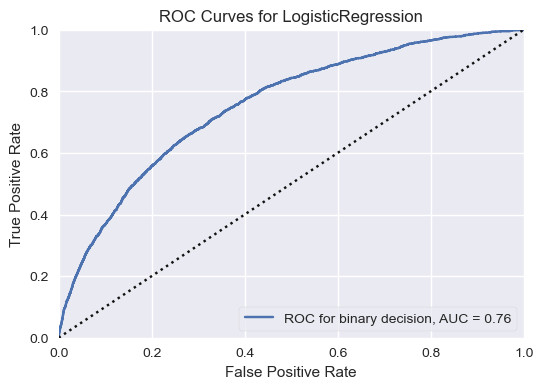

<Axes: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [109]:
fig, ax = plt.subplots(figsize=(6, 4))

visualizer = ROCAUC(logistic_regression, binary=True, random_state=101)

visualizer.fit(X_train_sd, y_ytrain)        # Fit the visualizer and the model
visualizer.score(X_val_sd, y_val)        # Evaluate the model on the test data
visualizer.show()                       # Finalize and show the figurev


### Linear SVC

In [110]:
from sklearn.svm import LinearSVC

# Instancier le modèle LinearSVC
linear_svc = LinearSVC()

# Entraîner le modèle sur les données d'entraînement
linear_svc.fit(X_train_sd, y_ytrain)


LinearSVC()

In [111]:
y_pred_linear_svc = linear_svc.predict(X_val_sd)
y_pred_linear_svc

array([0., 0., 0., ..., 0., 0., 0.])

In [112]:
y_true = y_val

In [113]:
classification_metrics(linear_svc, X_train_sd, y_ytrain, X_val_sd, y_val)

Aire sous la courbe ROC (AUC): 0.5002820494876733
Accuracy: 0.9301
Precision: 0.2000
Recall: 0.0008
F1 Score: 0.0016
F2 Score: 0.0010
Cout_metier:2501.0000

score train:0.93 score test:0.9301

Proportion des classes dans y_train:
0.0    0.9303
1.0    0.0697
Name: TARGET, dtype: float64

_________________________________________

Proportion des classes dans y_val:
0.0    0.9303
1.0    0.0697
Name: TARGET, dtype: float64

_________________________________________

Matrice de confusion sur y_val:


,pred_0,pred_1
test_0,33135,8
test_1,2481,2


### Random Forest

In [114]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=100, random_state=101, max_depth=2, n_jobs=4)

rf.fit(X_train_sd, y_ytrain)

RandomForestClassifier(max_depth=2, n_jobs=4, random_state=101)

In [115]:
y_train_rf = rf.predict_proba(X_train_sd)[:,1]
y_val_rf = rf.predict_proba(X_val_sd)[:,1]

In [116]:
print(f"ROC-AUC Logistic Regression Train : {roc_auc_score(y_ytrain, y_train_rf):.2%}")
print(f"ROC-AUC Logistic Regression test : {roc_auc_score(y_val, y_val_rf):.2%}")

ROC-AUC Logistic Regression Train : 71.09%
ROC-AUC Logistic Regression test : 70.74%


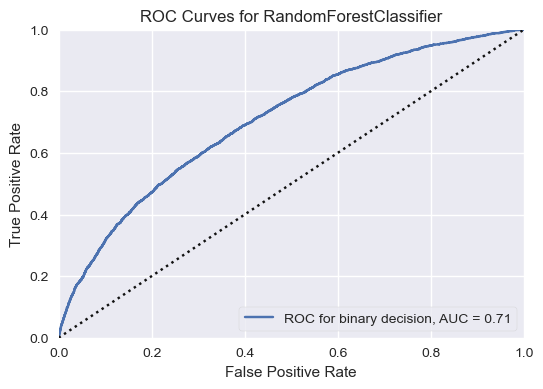

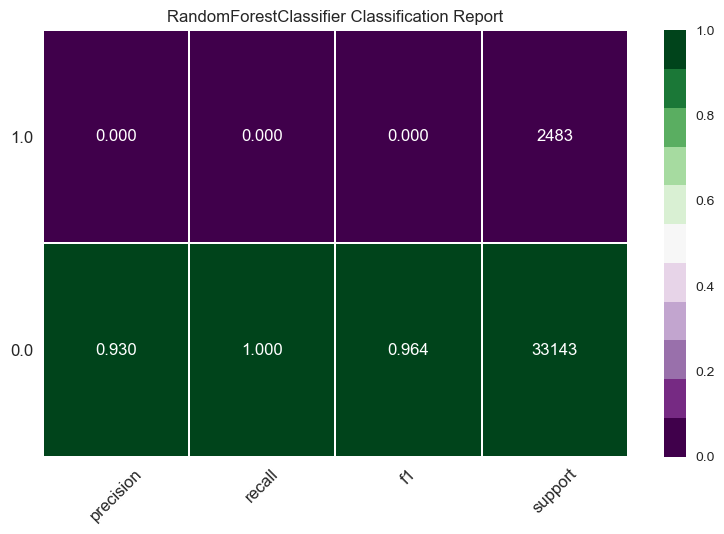

<Axes: title={'center': 'RandomForestClassifier Classification Report'}>

In [117]:
fig, ax = plt.subplots(figsize=(6, 4))

visualizer_1 = ROCAUC(rf, binary=True, random_state=101)

visualizer_2 = ClassificationReport(rf, support=True, cmap='PRGn')

visualizer_1.fit(X_train_sd, y_ytrain)        # Fit the visualizer and the model
visualizer_1.score(X_val_sd, y_val)        # Evaluate the model on the test data
visualizer_1.show()                       # Finalize and show the figurev

visualizer_2.fit(X_train_sd, y_ytrain)        
visualizer_2.score(X_val_sd, y_val)        
visualizer_2.show()                       



### Classification avec LightGBM

In [118]:
lgbm_clf = LGBMClassifier()
lgbm_clf.fit(X_train_sd,
        y_ytrain,
        eval_metric='auc')

[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.267355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24843
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 156
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


LGBMClassifier()

In [119]:
y_test_pred_proba = lgbm_clf.predict_proba(X_val_sd)
lgbm_clf.predict(X_val_sd).sum()

115.0

submission.to_csv('./Archived/lgbm_toutes_les_features_v8.csv', index=False)

**Entrainement sur les données d'entraînement**

In [120]:
lgbm_clf = LGBMClassifier()
lgbm_clf_fit = lgbm_clf.fit(X_Xtrain,
        y_ytrain,
        eval_metric='auc')

[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.384434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24744
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 156
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


In [121]:
classification_metrics(lgbm_clf, X_train_sd, y_ytrain, X_val_sd, y_val)

Aire sous la courbe ROC (AUC): 0.6195284802359207
Accuracy: 0.6695
Precision: 0.1154
Recall: 0.5614
F1 Score: 0.1915
F2 Score: 0.3167
Cout_metier:15029.0000

score train:0.6683 score test:0.6695

Proportion des classes dans y_train:
0.0    0.9303
1.0    0.0697
Name: TARGET, dtype: float64

_________________________________________

Proportion des classes dans y_val:
0.0    0.9303
1.0    0.0697
Name: TARGET, dtype: float64

_________________________________________

Matrice de confusion sur y_val:


,pred_0,pred_1
test_0,22459,10684
test_1,1089,1394


In [122]:
y_pred_lgbm = lgbm_clf_fit.predict(X_val)

y_pred_lgbm_proba = lgbm_clf_fit.predict_proba(X_val)

In [123]:
print(classification_report(y_val, y_pred_lgbm))

              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96     33143
         1.0       0.54      0.03      0.05      2483

    accuracy                           0.93     35626
   macro avg       0.74      0.51      0.51     35626
weighted avg       0.90      0.93      0.90     35626



In [124]:
lgbm_clf_fit.predict(X_val).sum()

124.0

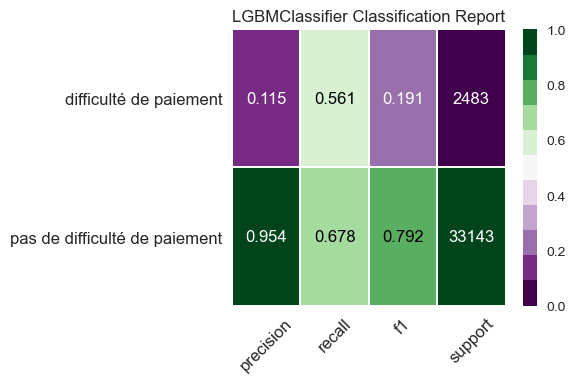

<Axes: title={'center': 'LGBMClassifier Classification Report'}>

In [125]:
import seaborn as sns

# Identification des classes. La variable classes sera utile lors de l'utilisation des visualiseurs de Yellowbrick
classes = ['pas de difficulté de paiement', 'difficulté de paiement']

sns.set_style("ticks")
fig, ax = plt.subplots(figsize=(6, 4))

# Création de l'objet visualizer de la ClassificationReport
visualizer = ClassificationReport(lgbm_clf_fit, classes=classes, support=True, cmap='PRGn')

# Ajustement du visualiseur et du modèle aux données d'entraînement
visualizer.fit(X_train_sd, y_ytrain)

# Évaluation du modèle sur les données de validation
visualizer.score(X_val_sd, y_val)

# Affichage du rapport de classification
visualizer.show()


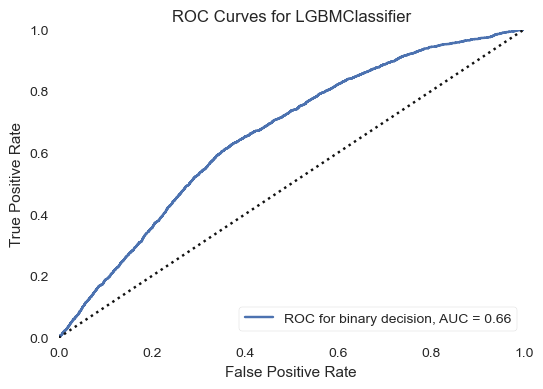

<Axes: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [126]:
fig, ax = plt.subplots(figsize=(6, 4))

visualizer = ROCAUC(lgbm_clf, binary=True, 
                    random_state=101)

visualizer.fit(X_train_sd, y_ytrain)        
visualizer.score(X_val_sd, y_val)
visualizer.show() 

### Classification avec prise en compte du déséquilibre

#### Oversampling Data Using SMOTE

SMOTE with Imbalance Data using imblearn module

In [127]:
from imblearn.over_sampling import SMOTE

In [128]:
print("Label 1, Before using SMOTE: {} ".format(sum(y_ytrain==1)))
print("Label 0, Before using SMOTE: {} ".format(sum(y_ytrain==0)))

Label 1, Before using SMOTE: 22342 
Label 0, Before using SMOTE: 298287 


In [129]:
%%time
sm = SMOTE(random_state=2)
X_train_smote, y_train_smote = sm.fit_resample(X_Xtrain, y_ytrain)


CPU times: total: 8.8 s
Wall time: 6.12 s


In [130]:
# Standardisation des données

scaler = StandardScaler()
scaler.fit(X_train_smote)

X_train_smote_sd = scaler.transform(X_train_smote)

In [131]:
X_train_smote_sd_df = pd.DataFrame(X_train_smote_sd, columns=list(X_train_smote))

In [132]:
print("Label 1, After using SMOTE: {}".format(sum(y_train_smote==1)))
print("Label 0, After using SMOTE: {}".format(sum(y_train_smote==0)))

Label 1, After using SMOTE: 298287
Label 0, After using SMOTE: 298287


#### Logistic Regression with SMOTE

In [133]:
%%time
logistic_regression = LogisticRegression(C = 0.0001, max_iter=100)
logistic_regression.fit(X_train_smote, y_train_smote)
roc_auc = roc_auc_score(y_val, logistic_regression.predict_proba(X_val_sd)[:,1])
print('AUC : %0.4f' %roc_auc)
print(classification_report(y_val, logistic_regression.predict(X_val_sd)))

AUC : 0.5732
              precision    recall  f1-score   support

         0.0       0.94      0.54      0.69     33143
         1.0       0.09      0.57      0.15      2483

    accuracy                           0.54     35626
   macro avg       0.51      0.56      0.42     35626
weighted avg       0.88      0.54      0.65     35626

CPU times: total: 37.3 s
Wall time: 14.4 s


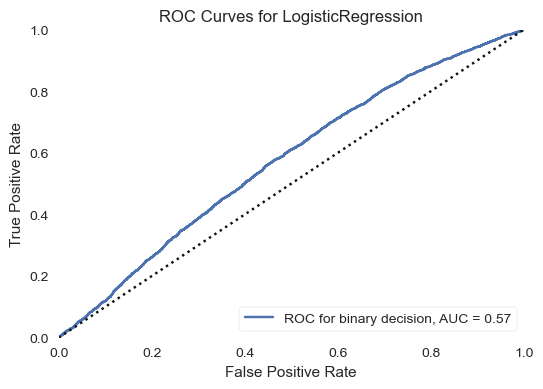

<Axes: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [134]:
fig, ax = plt.subplots(figsize=(6, 4))

visualizer = ROCAUC(logistic_regression, binary=True, 
                    random_state=101)

visualizer.fit(X_train_smote_sd, y_train_smote)        
visualizer.score(X_val_sd, y_val)
visualizer.show() 

#### Autres Algorithmes

In [135]:

# Modèles à ajouter
models_to_add = [
    LogisticRegression(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    XGBClassifier(),
    LGBMClassifier()
]


In [136]:
def train_models(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)  #  le modèle est entraîné ici
    y_pred = model.predict(X_test)
    def cout_metier(y_test, y_pred, cout_fn = 10, cout_fp = 1 ):
        vp, vn, fp, fn = confusion_matrix(y_true, y_pred).ravel()
        cout = cout_fn*fn + cout_fp*fp
        return cout
    output = {
        'AUC': roc_auc_score(y_test, model.predict_proba(X_test)[:,1]),
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1': f1_score(y_test, y_pred), 
        'F2': f2_measure(y_test, y_pred),
        'Cout_metier': cout_metier(y_test, y_pred)
    }
          
    return output


In [137]:
# Ajouter les nouveaux modèles à la liste existante

name = []
auc = []
accuracy = []
precision = []
recall = []
f1 = []
f2 = []
cout_metier_value = []
time_ = []

for model in models_to_add:
    start = time.time()
    results = train_models(model, X_train = X_train_sd, X_test = X_val_sd, y_train = y_ytrain, y_test=y_val)
    
    name.append(type(model).__name__)
    auc.append(results['AUC'])
    accuracy.append(results['Accuracy'])
    precision.append(results['Precision'])
    recall.append(results['Recall'])
    f1.append(results['F1'])
    f2.append(results['F2'])
    cout_metier_value.append(results['Cout_metier'])
    time_.append(time.time()-start)

#Initialise data of lists
base_models = pd.DataFrame(data=[name, auc, accuracy, precision, recall, f1, f2, cout_metier_value, time_]).T
base_models.columns = ['Model', 'AUC', 'Accuracy', 'Precision', 'Recall', 'F1', 'F2','Cout_metier', 'Time']
base_models.sort_values('AUC', ascending=False, inplace=True)

[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.300882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24843
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 156
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


In [138]:
base_models

,Model,AUC,Accuracy,Precision,Recall,F1,F2,Cout_metier,Time
4,LGBMClassifier,0.78145,0.930612,0.547826,0.025373,0.048499,0.031353,3050,11.87345
3,XGBClassifier,0.775526,0.930584,0.520492,0.051148,0.093143,0.062402,3626,144.983011
0,LogisticRegression,0.760004,0.9305,0.568627,0.011679,0.022889,0.014525,2744,7.974681
2,RandomForestClassifier,0.72021,0.930304,0.5,0.001208,0.002411,0.001509,2510,386.829301
1,DecisionTreeClassifier,0.537519,0.86667,0.12677,0.155054,0.139493,0.148431,5948,76.532924


### GridSearchCV sur LGBM

#### GridSearchCV à 1 dimension pour estimer les ranges des hyperparamètres

In [139]:
param_grid = [{'num_leaves': [7, 15, 31, 63, 127]}]

lgbm_clf  = LGBMClassifier()
grid_search = GridSearchCV(lgbm_clf,
                           param_grid,
                           cv=5,
                           scoring='roc_auc',
                           return_train_score=True,
                           verbose=10,
                           n_jobs=5)
grid_search.fit(X_train_sd,
                y_ytrain,
                eval_metric='auc'
                )

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.352526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24843
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 156
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


GridSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=5,
             param_grid=[{'num_leaves': [7, 15, 31, 63, 127]}],
             return_train_score=True, scoring='roc_auc', verbose=10)

In [140]:
import pandas as pd

def display_grid_search_results(grid_search):
    # Obtenez les résultats de la recherche sur la grille
    results = pd.DataFrame(grid_search.cv_results_)
    
    # Sélectionnez les colonnes pertinentes
    results = results[['mean_test_score', 'params', 'mean_fit_time', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score']]
    
    # Affichez les résultats triés par 'mean_test_score' dans l'ordre décroissant
    results = results.sort_values(by='mean_test_score', ascending=False).reset_index(drop=True)
    
    # Affichez le tableau des résultats
    display(results)
    
    # Affichez le meilleur score et les paramètres correspondants
    best_score = grid_search.best_score_
    best_params = grid_search.best_params_
    print(f"Best roc_auc = {best_score:.3f}    {best_params}")


In [141]:
# Utilisation de la fonction
display_grid_search_results(grid_search)

,mean_test_score,params,mean_fit_time,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
0,0.778815,{'num_leaves': 31},45.055298,0.779635,0.783842,0.777447,0.774776,0.778376
1,0.778060,{'num_leaves': 63},46.908064,0.778304,0.783240,0.776768,0.773382,0.778606
2,0.777011,{'num_leaves': 15},40.307928,0.777714,0.781210,0.776422,0.773175,0.776532
3,0.775367,{'num_leaves': 127},53.883491,0.776880,0.780392,0.775722,0.768746,0.775096
4,0.771490,{'num_leaves': 7},37.778371,0.772129,0.776264,0.771021,0.767505,0.770533


Best roc_auc = 0.779    {'num_leaves': 31}


In [142]:
param_grid = [{'num_iterations': [25, 50, 100, 200, 400]}]

lgbm_clf  = LGBMClassifier()
grid_search = GridSearchCV(lgbm_clf,
                           param_grid,
                           cv=5,
                           scoring='roc_auc',
                           return_train_score=True,
                           verbose=10,
                           n_jobs=5)
grid_search.fit(X_train_sd,
                y_ytrain,
                eval_metric='auc')

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.094481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24843
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 156
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


GridSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=5,
             param_grid=[{'num_iterations': [25, 50, 100, 200, 400]}],
             return_train_score=True, scoring='roc_auc', verbose=10)

In [143]:
display_grid_search_results(grid_search)

,mean_test_score,params,mean_fit_time,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
0,0.780291,{'num_iterations': 200},65.515677,0.780939,0.784450,0.778946,0.776660,0.780461
1,0.779203,{'num_iterations': 400},95.823192,0.779085,0.783488,0.778226,0.776037,0.779179
2,0.778815,{'num_iterations': 100},40.454410,0.779635,0.783842,0.777447,0.774776,0.778376
3,0.771482,{'num_iterations': 50},32.075272,0.775141,0.775717,0.768372,0.767613,0.770568
4,0.757773,{'num_iterations': 25},22.636945,0.762695,0.761800,0.753250,0.752759,0.758364


Best roc_auc = 0.780    {'num_iterations': 200}



L'argument min_data_in_leaf (aussi appelé min_child_samples dans certaines versions de LightGBM) est un hyperparamètre important dans les modèles basés sur des arbres de décision, y compris le modèle LGBMClassifier de LightGBM. 

Cet hyperparamètre contrôle le nombre minimum d'échantillons (ou points de données) qui doivent être présents dans une feuille (nœud terminal) de l'arbre lors de la construction du modèle.

En d'autres termes, min_data_in_leaf spécifie la condition minimale pour qu'un nœud soit une feuille de l'arbre. 

Si le nombre d'échantillons dans un nœud donné est inférieur à min_data_in_leaf, l'arbre ne continuera pas à se diviser et ce nœud deviendra une feuille.

In [144]:
param_grid = [{'min_data_in_leaf': [5, 10, 20, 40, 80]}]

lgbm_clf = LGBMClassifier()
grid_search = GridSearchCV(lgbm_clf,
                           param_grid,
                           cv=5,
                           scoring='roc_auc',
                           return_train_score=True,
                           verbose=10,
                           n_jobs=5)
grid_search.fit(X_train_sd,
                y_ytrain,
                eval_metric='auc')

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.089747 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24840
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 155
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


GridSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=5,
             param_grid=[{'min_data_in_leaf': [5, 10, 20, 40, 80]}],
             return_train_score=True, scoring='roc_auc', verbose=10)

In [145]:
display_grid_search_results(grid_search)

,mean_test_score,params,mean_fit_time,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
0,0.779773,{'min_data_in_leaf': 80},39.245925,0.780448,0.783036,0.780191,0.775913,0.779279
1,0.779243,{'min_data_in_leaf': 40},43.325187,0.779481,0.784845,0.777653,0.776004,0.778234
2,0.778815,{'min_data_in_leaf': 20},47.007740,0.779635,0.783842,0.777447,0.774776,0.778376
3,0.778496,{'min_data_in_leaf': 10},46.176916,0.780125,0.781954,0.776746,0.774001,0.779651
4,0.777692,{'min_data_in_leaf': 5},45.903771,0.779111,0.782916,0.776364,0.773270,0.776799


Best roc_auc = 0.780    {'min_data_in_leaf': 80}


In [146]:
param_grid = [{'learning_rate': [0.025, 0.05, 0.1, 0.2, 0.4]}]

lgbm_clf = LGBMClassifier()
grid_search = GridSearchCV(lgbm_clf,
                           param_grid,
                           cv=5,
                           scoring='roc_auc',
                           return_train_score=True,
                           verbose=10,
                           n_jobs=5)
grid_search.fit(X_train_sd,
                y_ytrain, 
                eval_metric='auc')

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.442223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24843
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 156
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


GridSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=5,
             param_grid=[{'learning_rate': [0.025, 0.05, 0.1, 0.2, 0.4]}],
             return_train_score=True, scoring='roc_auc', verbose=10)

In [147]:
display_grid_search_results(grid_search)

,mean_test_score,params,mean_fit_time,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
0,0.778815,{'learning_rate': 0.1},46.911082,0.779635,0.783842,0.777447,0.774776,0.778376
1,0.774911,{'learning_rate': 0.2},40.561281,0.776780,0.777767,0.774206,0.771537,0.774265
2,0.772363,{'learning_rate': 0.05},45.547080,0.774780,0.777007,0.770787,0.768023,0.771220
3,0.758795,{'learning_rate': 0.025},54.574201,0.762610,0.763327,0.755495,0.754148,0.758397
4,0.755638,{'learning_rate': 0.4},30.742044,0.754763,0.761983,0.753011,0.752885,0.755547


Best roc_auc = 0.779    {'learning_rate': 0.1}


### GridSearch 

In [148]:
param_grid = [{
    'num_leaves': [63],
    'num_iterations': [200],
    'min_data_in_leaf': [40, 80],
    'learning_rate': [ 0.2],
    'is_unbalance': [True]
}]

lgbm_clf = LGBMClassifier()

grid_search_final = GridSearchCV(lgbm_clf,
                              param_grid,
                              cv=5,
                              scoring='roc_auc',
                              return_train_score=True,
                              n_jobs=5,
                              verbose=10)

grid_search_final.fit(X_train_sd,y_ytrain,
                   eval_metric='auc')

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.373755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24840
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 155
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


GridSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=5,
             param_grid=[{'is_unbalance': [True], 'learning_rate': [0.2],
                          'min_data_in_leaf': [40, 80], 'num_iterations': [200],
                          'num_leaves': [63]}],
             return_train_score=True, scoring='roc_auc', verbose=10)

In [149]:
display_grid_search_results(grid_search_final)

,mean_test_score,params,mean_fit_time,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
0,0.760258,"{'is_unbalance': True, 'learning_rate': 0.2, '...",68.500547,0.757579,0.766368,0.757684,0.760871,0.758789
1,0.759704,"{'is_unbalance': True, 'learning_rate': 0.2, '...",70.806385,0.758857,0.764187,0.758087,0.758993,0.758399


Best roc_auc = 0.760    {'is_unbalance': True, 'learning_rate': 0.2, 'min_data_in_leaf': 80, 'num_iterations': 200, 'num_leaves': 63}


#### Utilisation de la fonction de coût personnalisée dans GridSearchCV


L'intégration du coût métier dans l'optimisation du modèle est une étape cruciale pour s'assurer que le modèle répond aux exigences spécifiques du contexte financier dans lequel il sera déployé.

La fonction de coût personnalisée que nous avons définie, **cout_metier**, attribue un coût différent aux faux positifs (FP) et aux faux négatifs (FN) en fonction du déséquilibre des classes. L'idée ici est d'incorporer ce coût métier dans le processus d'optimisation du modèle en utilisant GridSearchCV

Lorsque nous utilisons GridSearchCV pour rechercher les meilleurs hyperparamètres, nous pouvons spécifier la métrique de performance à maximiser (ou minimiser). Dans ce cas, au lieu d'utiliser une métrique standard telle que l'Aire sous la Courbe ROC (ROC AUC), vous utiliserons notre fonction de coût personnalisée comme métrique de score.

In [150]:
param_grid = {
    'num_leaves': [63],
    'num_iterations': [200],
    'min_data_in_leaf': [40, 80],
    'learning_rate': [0.2],
    'is_unbalance': [True]
}

lgbm_clf = LGBMClassifier()

grid_search_final = GridSearchCV(lgbm_clf,
                                 param_grid,
                                 cv=5,
                                 scoring=make_scorer(cout_metier, greater_is_better=False),
                                 return_train_score=True,
                                 n_jobs=5,
                                 verbose=10)
grid_search_final.fit(X_train_sd, y_ytrain)
# make_scorer est utilisé pour transformer la fonction cout_metier en une métrique de score compatible avec GridSearchCV. 
#L'utilisation de greater_is_better=False indique que le modèle doit minimiser cette métrique (ce qui correspond à minimiser le coût métier dans ce cas).

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.096857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24840
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 155
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


GridSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=5,
             param_grid={'is_unbalance': [True], 'learning_rate': [0.2],
                         'min_data_in_leaf': [40, 80], 'num_iterations': [200],
                         'num_leaves': [63]},
             return_train_score=True,
             scoring=make_scorer(cout_metier, greater_is_better=False),
             verbose=10)

#### Exploration de différents seuils de probabilité :

En classification binaire, un modèle attribue une probabilité à chaque observation d'appartenir à la classe positive. 

La plupart des modèles classifient une observation comme positive si la probabilité prédite est supérieure à un seuil (généralement 0.5 par défaut).

Cependant, ajuster ce seuil peut être crucial, surtout lorsque les coûts d'erreurs sont inégaux (comme dans notre cas).

Nous pouvons explorer différents seuils de probabilité pour minimiser le coût global en ajustant le point de coupure de notre modèle.

In [151]:
type(grid_search_final.best_estimator_)

lightgbm.sklearn.LGBMClassifier

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.324371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24840
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 155
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80


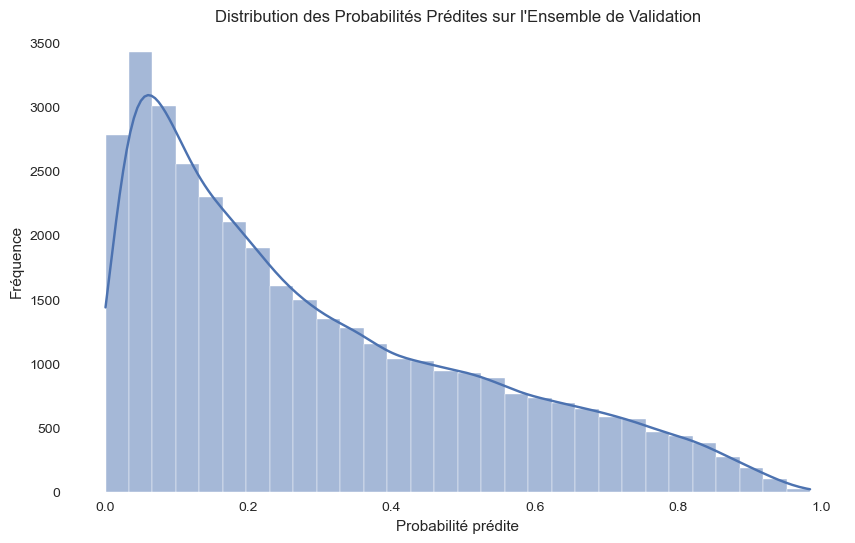

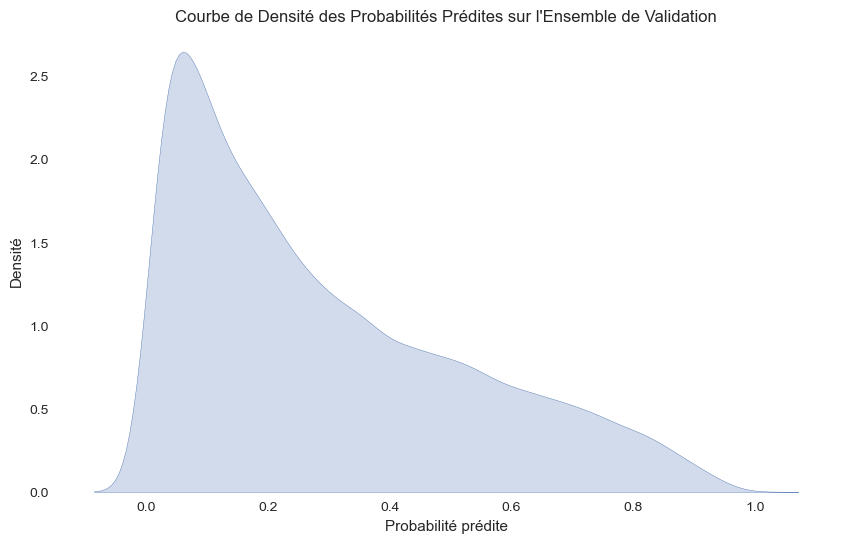

In [152]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assurez-vous que grid_search_final est ajusté
grid_search_final.fit(X_train_sd, y_ytrain)

# Obtenez les probabilités prédites sur l'ensemble de validation
y_proba_val = grid_search_final.predict_proba(X_val_sd)[:, 1]

# Créez un histogramme des probabilités prédites
plt.figure(figsize=(10, 6))
sns.histplot(y_proba_val, kde=True, bins=30)
plt.title('Distribution des Probabilités Prédites sur l\'Ensemble de Validation')
plt.xlabel('Probabilité prédite')
plt.ylabel('Fréquence')
plt.show()

# Créez une courbe de densité des probabilités prédites
plt.figure(figsize=(10, 6))
sns.kdeplot(y_proba_val, fill=True)
plt.title('Courbe de Densité des Probabilités Prédites sur l\'Ensemble de Validation')
plt.xlabel('Probabilité prédite')
plt.ylabel('Densité')
plt.show()


In [153]:
y_train_pred_proba = grid_search_final.predict_proba(X_Xtrain)

train_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X_Xtrain.index,
    'pred_proba':
    y_train_pred_proba[:, 1],
    'TARGET_True':
    y_ytrain.astype(int)
})

[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80


In [154]:
train_set_pred_proba.to_csv("C:/Users/jerom/projet_7/dashboard_streamlit/Cleaned/train_set_pred_proba.csv", index = False)

In [155]:
train_set_pred_proba

,SK_ID_CURR,pred_proba,TARGET_True
326855,326855,0.018555,0
277896,277896,0.013345,0
304597,304597,0.142127,0
207315,207315,0.033414,0
205669,205669,0.008553,0
...,...,...,...
211327,211327,0.030255,0
35800,35800,0.093153,0
169989,169989,0.005801,0
202443,202443,0.009485,0


In [156]:
def cout_metier(vp, vn, fp, fn, cout_fn=10, cout_fp=1):
    cout = cout_fn * fn + cout_fp * fp
    return cout

In [157]:
def cout_modelise(seuil, verbose=False):
    ser_TARGET_pred = (train_set_pred_proba['pred_proba'] > seuil).astype(int)
    vp = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 1)).sum()
    vn = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 0)).sum()
    fp = ((train_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 1)).sum()
    fn = ((train_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 0)).sum()
    
    
    if verbose:
        return vp, vn, fp, fn, cout_metier(vp, vn, fp, fn)
    else:
        return cout_metier(vp, vn, fp, fn)


In [158]:
seuils = np.linspace(0, 1, 1001)

couts_modelises = [cout_modelise(seuil) for seuil in seuils]

# Trouver la valeur de seuil qui conduit au coût minimal
min_value_train = min(couts_modelises)
min_index = couts_modelises.index(min_value_train)
min_seuil = seuils[min_index]

print("Seuil qui conduit au minimum de la fonction coût métier :", min_seuil)
print("Valeur minimum de la fonction coût métier :", round(min_value_train, 2))


Seuil qui conduit au minimum de la fonction coût métier : 0.079
Valeur minimum de la fonction coût métier : 221398


Nous pouvons ajouter un graphique pour illustrer visuellement l'impact de l'ajustement du seuil de probabilité sur le coût métier. 
Par exemple, nous pourrions tracer la courbe de coût en fonction du seuil.

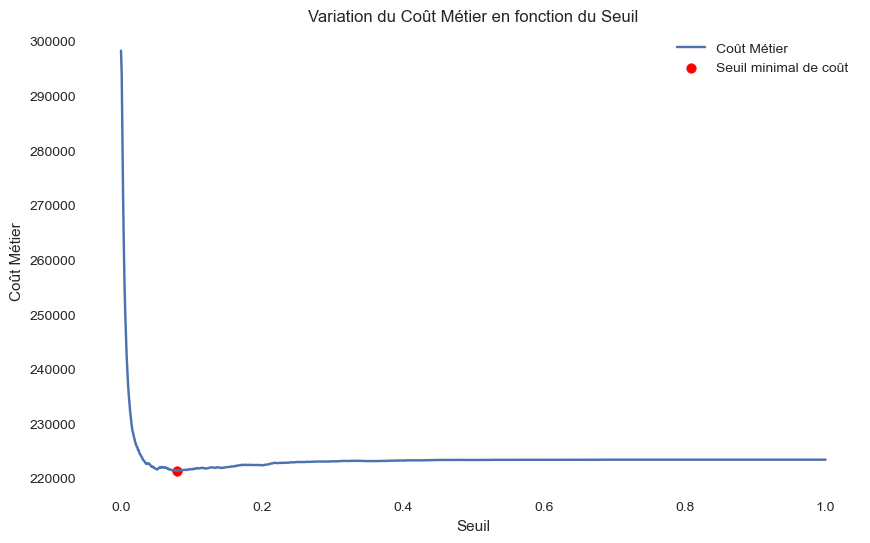

Seuil qui conduit au minimum de la fonction coût métier : 0.079
Valeur minimum de la fonction coût métier : 221398


In [159]:
import matplotlib.pyplot as plt

seuils = np.linspace(0, 1, 1001)
couts_modelises = [cout_modelise(seuil) for seuil in seuils]

# Trouver la valeur de seuil qui conduit au coût minimal
min_value_train = min(couts_modelises)
min_index = couts_modelises.index(min_value_train)
min_seuil = seuils[min_index]

# Tracer le graphique
plt.figure(figsize=(10, 6))
plt.plot(seuils, couts_modelises, label='Coût Métier')
plt.scatter(min_seuil, min_value_train, color='red', label='Seuil minimal de coût')
plt.title('Variation du Coût Métier en fonction du Seuil')
plt.xlabel('Seuil')
plt.ylabel('Coût Métier')
plt.legend()
plt.show()

print("Seuil qui conduit au minimum de la fonction coût métier :", min_seuil)
print("Valeur minimum de la fonction coût métier :", round(min_value_train, 2))


In [160]:
y_val_pred_proba = grid_search_final.predict_proba(X_val)

val_set_pred_proba = pd.DataFrame({
    'SK_ID_CURR':
    X_val.index,
    'pred_proba':
    y_val_pred_proba[:, 1],
    'TARGET_True':
    y_val.astype(int)
})

[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80


In [161]:
val_set_pred_proba .to_csv("C:/Users/jerom/projet_7/dashboard_streamlit/Cleaned/val_set_pred_proba.csv", index = False)

In [162]:
val_set_pred_proba.head(4)

,SK_ID_CURR,pred_proba,TARGET_True
43158,43158,0.026179,0
29289,29289,0.021061,0
210499,210499,0.003690,0
133573,133573,0.008782,0


In [163]:
def cout_modelise(seuil, verbose=False):
    ser_TARGET_pred = (val_set_pred_proba['pred_proba'] > seuil).astype(int)
    vp = ((val_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 1)).sum()
    vn = ((val_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 0)).sum()
    fp = ((val_set_pred_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 1)).sum()
    fn = ((val_set_pred_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 0)).sum()
    
    
    if verbose:
        return vp, vn, fp, fn, cout_metier(vp, vn, fp, fn)
    else:
        return cout_metier(vp, vn, fp, fn)


In [164]:
seuils = np.linspace(0, 1, 1001)

couts_modelises_val = [cout_modelise(seuil) for seuil in seuils]

# Trouver la valeur de seuil qui conduit au coût minimal
min_value_val = min(couts_modelises_val)
min_index_val = couts_modelises_val.index(min_value_val)
min_seuil_val = seuils[min_index_val]

print("Seuil qui conduit au minimum de la fonction coût métier pour la validation :", min_seuil_val)
print("Valeur minimum de la fonction coût métier pour la validation :", round(min_value_val, 2))


Seuil qui conduit au minimum de la fonction coût métier pour la validation : 0.074
Valeur minimum de la fonction coût métier pour la validation : 24280


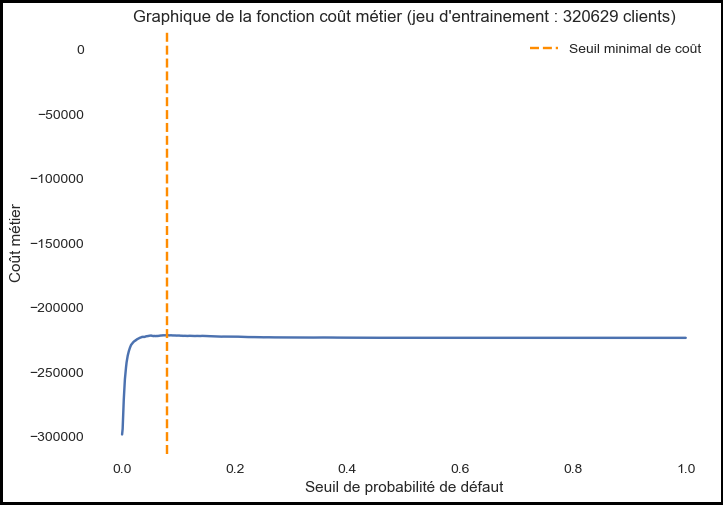

Seuil qui conduit au minimum de la fonction coût métier : 0.079
Valeur minimum de la fonction coût métier : 221398


In [165]:
# Tracé du graphique
plt.figure(edgecolor='black', linewidth=4)
plt.plot(seuils, [-g for g in couts_modelises])
plt.xlabel('Seuil de probabilité de défaut')
plt.ylabel('Coût métier')
plt.title(
    f"Graphique de la fonction coût métier (jeu d'entrainement : {len(X_Xtrain)} clients)"
)
plt.axline((min_seuil, 0), (min_seuil, 1), c='darkorange', ls='dashed', label='Seuil minimal de coût')
plt.legend()
plt.show()

print("Seuil qui conduit au minimum de la fonction coût métier :", min_seuil)
print("Valeur minimum de la fonction coût métier :", round(min_value_train, 2))

**Sérialisation**

In [166]:
#min_seuil
# le répertoire  ./api_ml  est le repository de l'API.
joblib.dump(min_seuil, './api_ml/resources/optimum_threshold.joblib')

['./api_ml/resources/optimum_threshold.joblib']

In [167]:
seuil_optimum = joblib.load('./api_ml/resources/optimum_threshold.joblib')
seuil_optimum

0.079

In [168]:
# Définissez cout_metier dans votre script principal
def cout_metier(y_true, y_pred, cout_fn=10, cout_fp=1):
    vp, vn, fp, fn = confusion_matrix(y_true, y_pred).ravel()
    cout = cout_fn * fn + cout_fp * fp
    return cout

# 

param_grid = {
    'num_leaves': [63],
    'num_iterations': [200],
    'min_data_in_leaf': [40, 80],
    'learning_rate': [0.2],
    'is_unbalance': [True]
}

lgbm_clf = LGBMClassifier()

grid_search_final = GridSearchCV(lgbm_clf,
                                 param_grid,
                                 cv=5,
                                 scoring=make_scorer(cout_metier, greater_is_better=False),
                                 return_train_score=True,
                                 n_jobs=5,
                                 verbose=10)

grid_search_final.fit(X_train_sd, y_ytrain)

# Sauvegarde le modèle
with open('./Archived/grid_search_final.pkl', 'wb') as file:
    pickle.dump(grid_search_final, file)


Fitting 5 folds for each of 2 candidates, totalling 10 fits
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.297805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24840
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 155
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


In [169]:
grid_search_final = pickle.load(open('./Archived/grid_search_final.pkl', 'rb'))

In [170]:
best_params = grid_search_final.best_params_
best_params

{'is_unbalance': True,
 'learning_rate': 0.2,
 'min_data_in_leaf': 80,
 'num_iterations': 200,
 'num_leaves': 63}

In [171]:
lgbm_clf_best = LGBMClassifier(**best_params)
lgbm_clf_best.fit(X_train_sd,
              y_ytrain,
              eval_metric='auc')

[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.337642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24840
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 155
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


LGBMClassifier(is_unbalance=True, learning_rate=0.2, min_data_in_leaf=80,
               num_iterations=200, num_leaves=63)

In [172]:
y_pred = lgbm_clf_best.predict_proba(X_val_sd)[:, 1]

[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80


In [173]:
df_predictproba = pd.DataFrame({
    'y_predict_proba': y_pred,
    'y_true': y_val
})
df_predictproba

,y_predict_proba,y_true
43158,0.358993,0.0
29289,0.041850,0.0
210499,0.221575,0.0
133573,0.109010,0.0
122030,0.730678,1.0
...,...,...
35843,0.172201,0.0
110215,0.387369,0.0
341279,0.144225,0.0
354893,0.015692,0.0


In [174]:
df_predictproba.to_csv("C:/Users/jerom/projet_7/dashboard_streamlit/Cleaned/df_predictproba.csv", index = False)

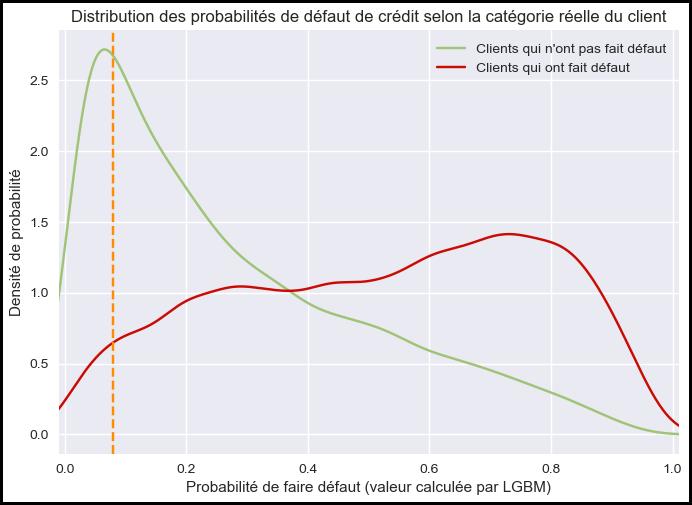

In [175]:
# valeurs de predict_proba des client y_true == 0
ser_predictproba_true0 = df_predictproba.loc[df_predictproba['y_true'] == 0,
                                             'y_predict_proba']
ser_predictproba_true1 = df_predictproba.loc[df_predictproba['y_true'] == 1,
                                             'y_predict_proba']

plt.style.use('seaborn')
plt.figure(edgecolor='black', linewidth=4)
plt.xlim(-0.01, 1.01)
bw_method = 0.15
ind = 1000
ser_predictproba_true0.plot(kind='kde',
                            c='g',
                            label='Clients qui n\'ont pas fait défaut',
                            bw_method=bw_method,
                            ind=ind)
ser_predictproba_true1.plot(kind='kde',
                            c='r',
                            label='Clients qui ont fait défaut',
                            bw_method=bw_method)
plt.title(
    'Distribution des probabilités de défaut de crédit selon la catégorie réelle du client'
)
plt.axline((seuil_optimum, 0), (seuil_optimum, 1), c='darkorange', ls='dashed')
plt.legend()
plt.xlabel('Probabilité de faire défaut (valeur calculée par LGBM)')
plt.ylabel('Densité de probabilité')
plt.annotate('Seuil optimum (fonction de coût métier)',
             color='darkorange',
             xy=(0.1, 5),
             rotation=90)
plt.show()

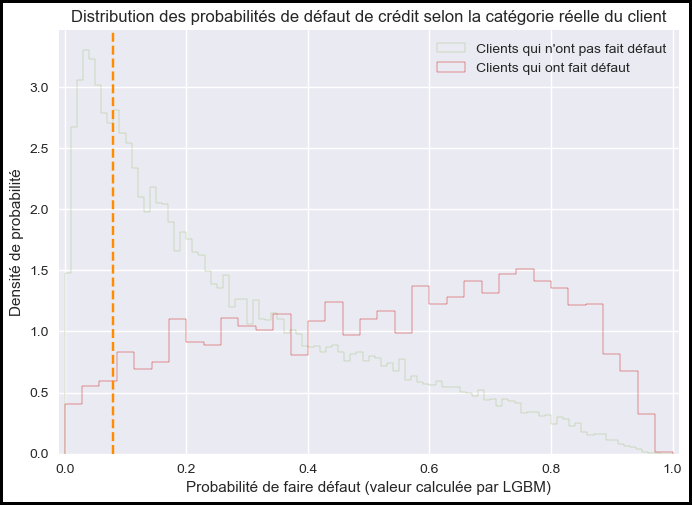

In [176]:
plt.figure(edgecolor='black', linewidth=4)
histtype = 'step'
ser_predictproba_true0.plot(kind='hist',
                            color='g',
                            label='Clients qui n\'ont pas fait défaut',
                            bins=100,
                            histtype=histtype,
                            range=(0, 1),
                            density=True)
ser_predictproba_true1.plot(kind='hist',
                            color='r',
                            label='Clients qui ont fait défaut',
                            bins=35,
                            histtype=histtype,
                            range=(0, 1),
                            density=True)
plt.title(
    'Distribution des probabilités de défaut de crédit selon la catégorie réelle du client'
)
plt.axline((seuil_optimum, 0), (seuil_optimum, 1), c='darkorange', ls='dashed')
plt.legend()
plt.xlabel('Probabilité de faire défaut (valeur calculée par LGBM)')
plt.ylabel('Densité de probabilité')
# plt.annotate('Seuil optimum (fonction de coût métier)', color='darkorange', xy=(0.1, 1000), rotation=90)
plt.xlim(-0.01, 1.01)
# plt.ylim(0, 450)
plt.show()

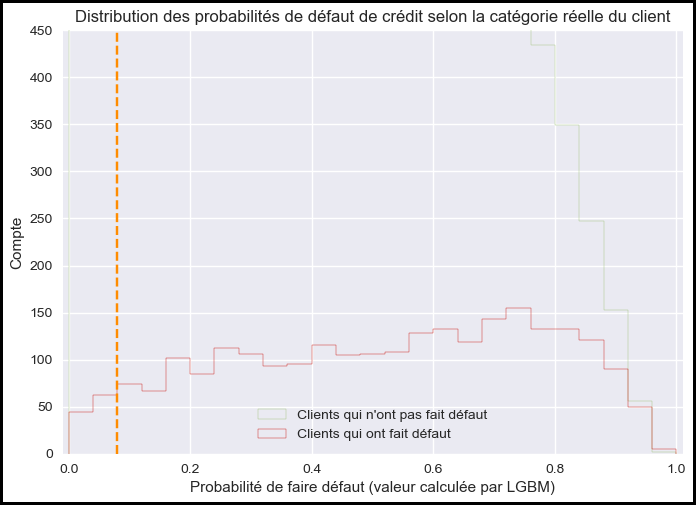

In [177]:
plt.figure(edgecolor='black', linewidth=4)
ser_predictproba_true0.plot(kind='hist',
                            color='g',
                            label='Clients qui n\'ont pas fait défaut',
                            bins=25,
                            histtype='step',
                            range=(0, 1))
ser_predictproba_true1.plot(kind='hist',
                            color='r',
                            label='Clients qui ont fait défaut',
                            bins=25,
                            histtype='step',
                            range=(0, 1))
plt.title(
    'Distribution des probabilités de défaut de crédit selon la catégorie réelle du client'
)
plt.axline((seuil_optimum, 0), (seuil_optimum, 1), c='darkorange', ls='dashed')
plt.legend()
plt.xlabel('Probabilité de faire défaut (valeur calculée par LGBM)')
plt.ylabel('Compte')
# plt.annotate('Seuil optimum (fonction de coût métier)', color='darkorange', xy=(0.1, 1000), rotation=90)
plt.xlim(-0.01, 1.01)
plt.ylim(0, 450)
plt.show()

### Utilisation des paramètres optimaux trouvés lors de la recherche sur la grille

#### Graphique de la courbe ROC pour l'ensemble de validation.

[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80


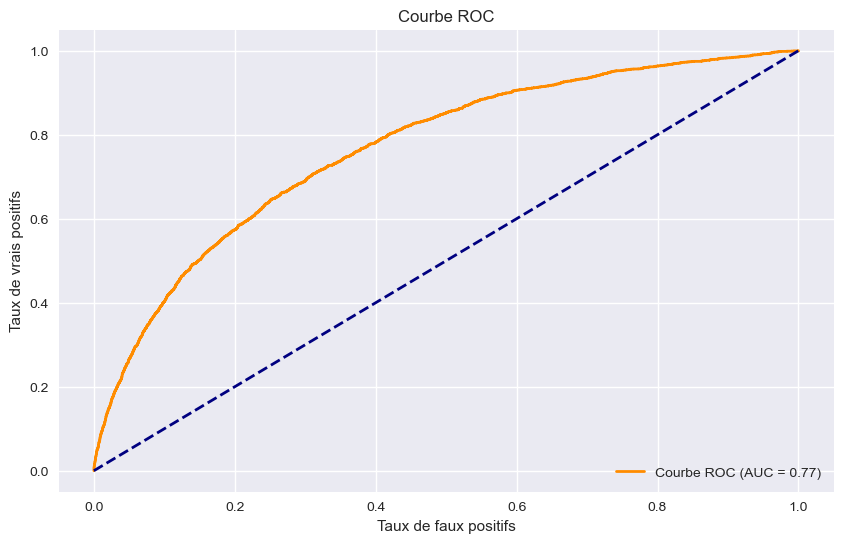

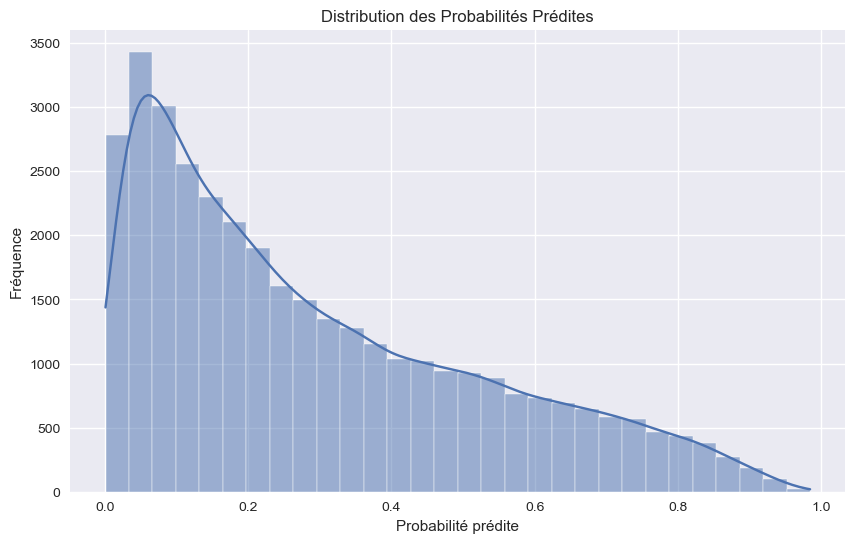

In [178]:
clf = grid_search_final
X_validation = X_val_sd
y_validation = y_val

plot_roc_and_proba(clf, X_validation, y_validation, titre="Courbe ROC")

#### Entraînement du modèle avec l'ensemble X_train, suivi de la prédiction sur l'ensemble de test

In [179]:
lgbm_clf_best = LGBMClassifier(**best_params)
lgbm_clf_best.fit(X_train_sd,
              y_ytrain,
              eval_metric='auc')

[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.279579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24840
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 155
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588


LGBMClassifier(is_unbalance=True, learning_rate=0.2, min_data_in_leaf=80,
               num_iterations=200, num_leaves=63)

In [180]:
###### y_test_pred_proba = lgbm_clf_best.predict_proba(X_val_sd)
lgbm_clf_best.predict(X_val_sd).sum()

[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80


7446.0

### Feature Selection

L'algorithme RFECV (Recursive Feature Elimination with Cross-Validation) de Scikit-learn utilise la validation croisée pour déterminer l'ensemble optimal de fonctionnalités qui maximise les performances d'un modèle. 

Son objectif est d'optimiser la métrique AUC tout en éliminant progressivement les caractéristiques les moins importantes.

In [181]:
%%time
start = time.time()
rfecv = RFECV(estimator=LGBMClassifier(), 
              step=5, 
              cv=StratifiedKFold(5), 
              scoring='roc_auc', 
              verbose=2,
              n_jobs=-1)
rfecv.fit(X_train_sd, y_ytrain)

Fitting estimator with 161 features.
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.360513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24843
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 156
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588
Fitting estimator with 156 features.
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.310786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24828
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 151
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> init

RFECV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
      estimator=LGBMClassifier(), n_jobs=-1, scoring='roc_auc', step=5,
      verbose=2)

In [182]:
print('Time Elapsed: {}'.format(time.time()-start))

Time Elapsed: 1118.3020133972168


In [183]:
print("Optimal number of features : %d" % rfecv.n_features_)
print("Selected Features: %s" % rfecv.support_[:20])
print("Feature Ranking : %s" % rfecv.ranking_[:20])

Optimal number of features : 121
Selected Features: [ True  True  True False False  True  True  True  True False  True  True  True  True  True  True  True  True  True False]
Feature Ranking : [1 1 1 2 2 1 1 1 1 5 1 1 1 1 1 1 1 1 1 5]


In [184]:
print("Dimensions de rfecv.support_:", rfecv.support_.shape)
print("Nombre de colonnes dans X_Xtrain:", len(X_Xtrain.columns))


Dimensions de rfecv.support_: (161,)
Nombre de colonnes dans X_Xtrain: 161


In [185]:
ranking = pd.DataFrame({'Features': X_Xtrain.columns})
ranking['RANK'] = np.asarray(rfecv.ranking_)
ranking.sort_values('RANK', inplace=True)

In [186]:
features_selection = ranking[ranking.RANK == 1]['Features'].to_list()
print(len(features_selection))
print(features_selection)


121
['NAME_CONTRACT_TYPE', 'PREV_AMT_APPLICATION_MAX', 'PREV_AMT_APPLICATION_MEAN', 'PREV_AMT_CREDIT_MIN', 'PREV_AMT_CREDIT_MAX', 'PREV_AMT_CREDIT_MEAN', 'PREV_APP_CREDIT_PERC_MIN', 'PREV_APP_CREDIT_PERC_MAX', 'PREV_APP_CREDIT_PERC_MEAN', 'PREV_APP_CREDIT_PERC_VAR', 'PREV_AMT_DOWN_PAYMENT_MIN', 'PREV_AMT_DOWN_PAYMENT_MAX', 'PREV_AMT_DOWN_PAYMENT_MEAN', 'PREV_AMT_GOODS_PRICE_MIN', 'PREV_AMT_GOODS_PRICE_MEAN', 'PREV_HOUR_APPR_PROCESS_START_MIN', 'PREV_AMT_APPLICATION_MIN', 'PREV_AMT_ANNUITY_MEAN', 'PREV_AMT_ANNUITY_MAX', 'PREV_AMT_ANNUITY_MIN', 'INSTAL_DAYS_ENTRY_PAYMENT_SUM', 'BURO_DAYS_CREDIT_ENDDATE_MAX', 'BURO_DAYS_CREDIT_ENDDATE_MEAN', 'BURO_DAYS_CREDIT_UPDATE_MEAN', 'BURO_CREDIT_DAY_OVERDUE_MAX', 'BURO_AMT_CREDIT_SUM_MAX', 'BURO_AMT_CREDIT_SUM_MEAN', 'PREV_HOUR_APPR_PROCESS_START_MAX', 'BURO_AMT_CREDIT_SUM_SUM', 'BURO_AMT_CREDIT_SUM_DEBT_MEAN', 'BURO_AMT_CREDIT_SUM_DEBT_SUM', 'BURO_AMT_CREDIT_SUM_OVERDUE_MEAN', 'BURO_AMT_CREDIT_SUM_LIMIT_MEAN', 'BURO_AMT_CREDIT_SUM_LIMIT_SUM', 'BUR

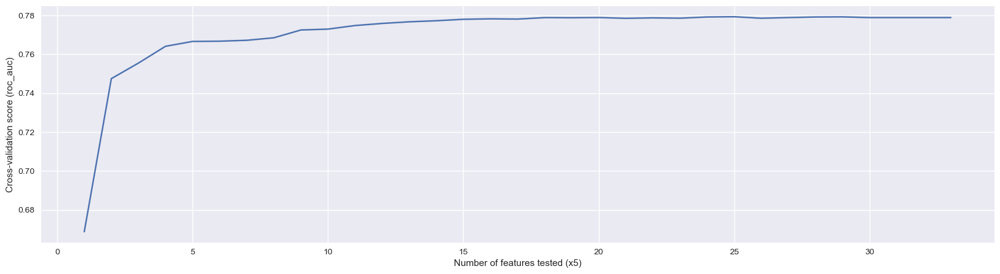

In [187]:
# Plot number of features vs CV scores
step = 5
plt.figure(figsize=(20, 5))
plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
plt.xlabel('Number of features tested (x%d)' % step)
plt.ylabel('Cross-validation score (roc_auc)')
plt.show()


In [188]:
data_rfecv = X_Xtrain.loc[:, X_Xtrain.columns[rfecv.get_support()]]
data_rfecv.shape

(320629, 121)

In [189]:
data_rfecv.to_csv("C:/Users/jerom/projet_7/dashboard_streamlit/Cleaned/data_rfecv.csv", index = False)

In [190]:
data_rfecv.head(2)

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_BB_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
326855,0,0,0,202500.0,341280.0,22936.5,270000.0,3,4,1,1,0.016612,-21916,-1663.0,-7391.0,-4648,0,0,1,12,2,2,4,17,0,57,0.605344,0.368969,0.0,0.0,0.0,-1919.0,1,0.0,0.0,0.120075,0.593354,101250.0,0.113267,0.067207,-2848.0,-30.0,-904.888889,873881.398693,-2387.0,341.0,-636.2,-618.166667,0.0,526500.0,145718.250000,2622928.50,188365.5,11772.84375,188365.50,0.0,0.0,0.0,0.0,542.0,7516.26,27113.085,17308.275000,0.0,675000.0,221936.062500,0.0,756081.0,247330.687500,0.872638,1.154782,0.935012,0.011767,0.0,13833.0,6916.5,63828.0,295914.75,11.0,17.0,15.500000,0.0,0.204350,0.102175,-1919.0,-61.0,-748.125000,23.666667,142.0,-2.0,-43.281250,32.0,14.0,0.0,0.000000,3.0,25.0,0.862069,25.0,43.0,15.758621,457.0,1.0,0.965517,28.0,0.033990,18094.995,628.327241,18221.490,1.128556e+07,723344.22,46259.514310,1341525.915,126.495,723344.22,45631.187069,1323304.425,-48.0,-1346.862069,-39059.0,29.0
277896,0,0,1,112500.0,755190.0,36459.0,675000.0,4,1,1,1,0.025164,-13017,-6080.0,-863.0,-4615,0,1,0,16,2,2,0,14,0,30,0.472537,0.614414,7.0,1.0,0.0,-2019.0,1,0.0,0.0,0.467082,0.148969,37500.0,0.324080,0.048278,-2853.0,-411.0,-1730.823529,662930.904412,-2545.0,2146.0,-1175.0,-765.529412,0.0,2437542.0,287756.327647,4891857.57,2246350.5,168243.57000,2691897.12,0.0,0.0,0.0,0.0,884.0,5301.

In [191]:
# Obtenir les noms des colonnes à conserver à partir de data_rfecv
colonnes_a_garder = data_rfecv.columns

# Créer un nouveau DataFrame en ne conservant que les colonnes de df_all_imputed présentes dans colonnes_a_garder
new_df = df_all_imputed.loc[:, colonnes_a_garder]

# Afficher le nouveau DataFrame
print(new_df.shape)
display(new_df)

(356255, 121)


,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_BB_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
0,Cash loans,M,N,202500.0,406597.5,24700.5,351000.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637.0,-3648.0,-2120,0,1,0,Laborers,2,2,WEDNESDAY,10,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,-1134.0,1,0.0,0.0,0.067329,0.498036,202500.0,0.121978,0.060749,-1437.0,-103.0,-874.000000,186150.000000,-1072.0,780.0,-349.000000,-499.875000,0.0,450000.00,1.081319e+05,865055.565,245781.00,49156.200,245781.000,0.0,7997.14125,31988.565,0.0,110.0,9251.775,9251.775,9251.77500,179055.000,179055.0,179055.0000,179055.000,179055.0,179055.0000,1.000000,1.000000,1.000000,0.009790,0.00,0.0,0.000000,179055.000,179055.0000,9.0,9.0,9.000000,0.000000,0.000000,0.000000,-606.0,-606.0,-606.000000,24.000000,24.0,-1.0,-10.000000,19.0,0.0,0.0,0.0,2.0,0.0,0.000000,0.0,31.0,20.421053,388.0,1.0,1.000000,19.0,0.000000,0.000,0.000000,0.000,0.000000e+00,53093.745,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,-49.0,-315.421053,-5993.0,19.0
1,Cash loans,F,N,270000.0,1293502.5,35698.5,1129500.0,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188.0,-1186.0,-291,0,1,0,Core staff,1,1,MONDAY,11,0,School,0.622246,0.533482,1.0,0.0,0.0,-828.0,1,0.0,0.0,0.070862,0.208736,135000.0,0.13221

In [192]:
TARGET = df_all_imputed['TARGET']

In [193]:
new_df = new_df.merge(TARGET, left_index=True, right_index=True)

In [194]:
new_df.shape

(356255, 122)

In [195]:
new_df.to_csv('./Archived/new_df.csv', index=True)

In [196]:
new_df.sample(50000).to_csv('./Archived/new_df_sample.csv', index=True)

In [197]:
#Transform data with rfecv 
X_train_new = rfecv.transform(X_Xtrain)
X_val_new = rfecv.transform(X_val)

In [198]:
X_train_new_df = pd.DataFrame(X_train_new, columns=list(data_rfecv))
X_train_new_df.head(1)

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_BB_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
0,0.0,0.0,0.0,202500.0,341280.0,22936.5,270000.0,3.0,4.0,1.0,1.0,0.016612,-21916.0,-1663.0,-7391.0,-4648.0,0.0,0.0,1.0,12.0,2.0,2.0,4.0,17.0,0.0,57.0,0.605344,0.368969,0.0,0.0,0.0,-1919.0,1.0,0.0,0.0,0.120075,0.593354,101250.0,0.113267,0.067207,-2848.0,-30.0,-904.888889,873881.398693,-2387.0,341.0,-636.2,-618.166667,0.0,526500.0,145718.25,2622928.5,188365.5,11772.84375,188365.5,0.0,0.0,0.0,0.0,542.0,7516.26,27113.085,17308.275,0.0,675000.0,221936.0625,0.0,756081.0,247330.6875,0.872638,1.154782,0.935012,0.011767,0.0,13833.0,6916.5,63828.0,295914.75,11.0,17.0,15.5,0.0,0.20435,0.102175,-1919.0,-61.0,-748.125,23.666667,142.0,-2.0,-43.28125,32.0,14.0,0.0,0.0,3.0,25.0,0.862069,25.0,43.0,15.758621,457.0,1.0,0.965517,28.0,0.03399,18094.995,628.327241,18221.49,1.128556e+07,723344.22,46259.51431,1341525.915,126.495,723344.22,45631.187069,1323304.425,-48.0,-1346.862069,-39059.0,29.0


In [199]:
data_rfecv

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_BB_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
326855,0,0,0,202500.0,341280.0,22936.5,270000.0,3,4,1,1,0.016612,-21916,-1663.0,-7391.0,-4648,0,0,1,12,2,2,4,17,0,57,0.605344,0.368969,0.0,0.0,0.0,-1919.0,1,0.0,0.0,0.120075,0.593354,101250.0,0.113267,0.067207,-2848.0,-30.0,-904.888889,873881.398693,-2387.0,341.0,-636.200000,-618.166667,0.0,526500.0,145718.250000,2622928.500,188365.50,11772.843750,188365.500,0.0,0.000000,0.0,0.0,542.0,7516.260,27113.085,17308.275000,0.0,675000.0,221936.062500,0.0,756081.0,247330.687500,0.872638,1.154782,0.935012,0.011767,0.0,13833.0,6916.500000,63828.0,295914.7500,11.0,17.0,15.500000,0.0,0.204350,0.102175,-1919.0,-61.0,-748.125000,23.666667,142.0,-2.0,-43.281250,32.0,14.0,0.0,0.000000,3.0,25.0,0.862069,25.0,43.0,15.758621,457.0,1.0,0.965517,28.0,0.033990,18094.995,628.327241,18221.490,1.128556e+07,723344.220,46259.514310,1341525.915,126.495,723344.220,45631.187069,1323304.425,-48.0,-1346.862069,-39059.0,29.0
277896,0,0,1,112500.0,755190.0,36459.0,675000.0,4,1,1,1,0.025164,-13017,-6080.0,-863.0,-4615,0,1,0,16,2,2,0,14,0,30,0.472537,0.614414,7.0,1.0,0.0,-2019.0,1,0.0,0.0,0.467082,0.148969,37500.0,0.324080,0.048278,-2853.0,-411.0,-1730.823529,662930.904412,-2545.0,2146.0,-1175.000000,-765.529412,0.0,2437542.0,287756.327647,4891857.570,2246350.50,168243.570000,269189

In [200]:
%%time

name = []
auc = []
accuracy = []
precision = []
recall = []
f1 = []
f2 = []
cout_metier_value = []
time_ = []

for model in models_to_add:
    start = time.time()
    results = train_models(model, X_train = X_train_new, X_test = X_val_new, y_train = y_ytrain, y_test=y_val)
    
    name.append(type(model).__name__)
    auc.append(results['AUC'])
    accuracy.append(results['Accuracy'])
    precision.append(results['Precision'])
    recall.append(results['Recall'])
    f1.append(results['F1'])
    f2.append(results['F2'])
    cout_metier_value.append(results['Cout_metier'])
    time_.append(time.time()-start)

#Initialise data of lists
rfe_models = pd.DataFrame(data=[name, auc, accuracy, precision, recall, f1, f2, cout_metier_value, time_]).T
rfe_models.columns = ['Model', 'AUC', 'Accuracy', 'Precision', 'Recall', 'F1', 'F2','Cout_metier', 'Time']
rfe_models.sort_values('AUC', ascending=False, inplace=True)

[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.200818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23627
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 121
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588
CPU times: total: 14min 45s
Wall time: 12min 19s


In [201]:
rfe_models

,Model,AUC,Accuracy,Precision,Recall,F1,F2,Cout_metier,Time
4,LGBMClassifier,0.781245,0.930641,0.546154,0.028594,0.054344,0.035281,3122,10.640064
3,XGBClassifier,0.778964,0.929798,0.46281,0.045107,0.082202,0.055042,3491,132.709283
2,RandomForestClassifier,0.718404,0.930332,0.571429,0.001611,0.003213,0.002012,2519,487.893593
0,LogisticRegression,0.580951,0.930276,0.0,0.0,0.0,0.0,2483,9.004883
1,DecisionTreeClassifier,0.539416,0.868467,0.130741,0.157068,0.1427,0.150987,5993,99.152779


In [202]:
base_models

,Model,AUC,Accuracy,Precision,Recall,F1,F2,Cout_metier,Time
4,LGBMClassifier,0.78145,0.930612,0.547826,0.025373,0.048499,0.031353,3050,11.87345
3,XGBClassifier,0.775526,0.930584,0.520492,0.051148,0.093143,0.062402,3626,144.983011
0,LogisticRegression,0.760004,0.9305,0.568627,0.011679,0.022889,0.014525,2744,7.974681
2,RandomForestClassifier,0.72021,0.930304,0.5,0.001208,0.002411,0.001509,2510,386.829301
1,DecisionTreeClassifier,0.537519,0.86667,0.12677,0.155054,0.139493,0.148431,5948,76.532924


### Hyperparameters tunning

Il est crucial de choisir les hyperparamètres appropriés pour améliorer les performances d'un algorithme d'apprentissage automatique, surtout dans le contexte d'une classification binaire où la métrique clé est le score AUC.

Bien que Grid Search et Random Search soient des méthodes courantes pour cette tâche, Hyperopt se distingue en offrant une approche plus avancée. 

Contrairement aux méthodes classiques, Hyperopt permet d'explorer un espace de paramètres beaucoup plus large et complexe. Cette flexibilité est particulièrement utile dans notre cas.

Avec Hyperopt, nous pouvons analyser notre modèle de Boosting tout en explorant divers hyperparamètres que nous définissons.

Une caractéristique notable d'Hyperopt est sa compatibilité avec les algorithmes de ML distribués tels qu'Apache Spark MLlib et Horovod, ainsi qu'avec les modèles ML mono-machine comme scikit-learn et TensorFlow. Cela en fait un outil puissant et polyvalent pour l'optimisation des hyperparamètres.

In [203]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials, space_eval

In [204]:
from hyperopt import STATUS_FAIL

Petite explication: 


Dans le contexte de la bibliothèque Hyperopt, tpe signifie "Tree-structured Parzen Estimator". C'est un algorithme d'optimisation séquentielle basé sur les modèles de probabilité. 

Voici ce que cela signifie :

Dans le contexte de la bibliothèque Hyperopt, tpe signifie "Tree-structured Parzen Estimator". C'est un algorithme d'optimisation séquentielle basé sur les modèles de probabilité. Voici ce que cela signifie :

Séquentiel : Hyperopt utilise une approche séquentielle pour l'optimisation des hyperparamètres. Cela signifie qu'il explore un espace de recherche défini séquentiellement, en évaluant un ensemble limité de combinaisons d'hyperparamètres à chaque itération.

Modèles de probabilité : TPE utilise des modèles de probabilité pour estimer les performances des différentes configurations d'hyperparamètres. Ces modèles sont basés sur la théorie des probabilités et sont utilisés pour estimer quelle combinaison d'hyperparamètres est la plus susceptible de produire de bonnes performances.

Parzen Estimator : Le nom "Parzen Estimator" se réfère à la méthode utilisée pour estimer la distribution de probabilité des hyperparamètres. Cette méthode est basée sur des noyaux (ou fonctions de noyau) qui sont utilisés pour estimer la densité de probabilité des points dans l'espace de recherche.

Tree-structured : TPE organise les estimations de probabilité dans une structure d'arbre. Cela signifie qu'à chaque itération, TPE décide quelle combinaison d'hyperparamètres tester ensuite en se basant sur les estimations de probabilité précédentes. Cette approche permet à TPE de converger plus rapidement vers des régions prometteuses de l'espace des hyperparamètres.

En résumé, l'algorithme TPE de Hyperopt est une méthode d'optimisation intelligente qui utilise des modèles de probabilité et des techniques d'estimation de densité pour guider la recherche des meilleures combinaisons d'hyperparamètres de manière efficace 

 ce code utilise Hyperopt pour rechercher les meilleures valeurs d'hyperparamètres pour un modèle LGBMClassifier en utilisant l'algorithme TPE. 
 
 L'objectif est de trouver les paramètres qui minimisent la perte (ou maximisent la métrique de performance) **sur les données d'entraînement**. 
 
 Ce processus d'optimisation peut être intensif en calcul, surtout avec un grand nombre d'évaluations et un grand espace de recherche.

In [205]:
y_ytrain.shape, X_train_new.shape

((320629,), (320629, 121))

In [206]:
X_train_new.shape

(320629, 121)

In [207]:
#Parameter space
space = {
    'n_estimators': hp.quniform('n_estimators', 100, 600, 100),
    'learning_rate': hp.uniform('learning_rate', 0.001, 0.03),
    'max_depth': hp.quniform('max_depth', 3, 7, 1),
    'subsample': hp.uniform('subsample', 0.60, 0.95),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.60, 0.95),
    'reg_lambda': hp.uniform('reg_lambda', 1, 20)
    }

In [208]:
def objective(params, eval_metric='custom_score'):
    #objective function to be minimized. 
    #Hyperopt will seek to minimize the loss returned by this function.
    
    params = {
        'n_estimators': int(params['n_estimators']),
        'learning_rate': params['learning_rate'],
        'max_depth': int(params['max_depth']),
        'subsample': params['subsample'],
        'colsample_bytree': params['colsample_bytree'],
        'reg_lambda': params['reg_lambda'],
        'device':'gpu'
        }
  
    
    model= LGBMClassifier(**params)
    cv = StratifiedKFold(5)
    if eval_metric == 'roc_auc': 
        score = cross_val_score(model, X_train_new, y_ytrain, scoring='roc_auc', cv=cv).mean()

    elif eval_metric == 'custom_score': 
        y_pred = cross_val_predict(model, X_train_new, y_ytrain, method='predict', cv=cv)
        
        score = custom_score(y_ytrain, y_pred, beta=3)
  
    loss = 1 - score    
    return {'loss': loss, 'params': params, 'status': STATUS_OK}

In [209]:
import random

In [210]:
%%time
# Utilisation de random au lieu de numpy.random pour créer l'état aléatoire
best = fmin(fn=objective, space=space, max_evals=30, rstate=random.seed(1), algo=tpe.suggest)

  0%|          | 0/30 [00:00<?, ?trial/s, best loss=?]

build_posterior_wrapper took 0.001899 seconds
TPE using 0 trials


[LightGBM] [Info] Number of positive: 17874, number of negative: 238629
[LightGBM] [Info] This is the GPU trainer!!           
[LightGBM] [Info] Total Bins 23625                    
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built        
[LightGBM] [Info] Size of histogram bin entry: 8      
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred to GPU in 0.027188 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069683 -> initscore=-2.591563
[LightGBM] [Info] Start training from score -2.591563 
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

build_posterior_wrapper took 0.000000 seconds
TPE using 1/1 trials with best loss 0.981290


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629          
[LightGBM] [Info] This is the GPU trainer!!                                      
[LightGBM] [Info] Total Bins 23625                                               
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                       
[LightGBM] [Info] GPU programs have been built                                   
[LightGBM] [Info] Size of histogram bin entry: 8                                 
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred 

build_posterior_wrapper took 0.009225 seconds
TPE using 2/2 trials with best loss 0.980915


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629            
[LightGBM] [Info] This is the GPU trainer!!                                        
[LightGBM] [Info] Total Bins 23625                                                 
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                         
[LightGBM] [Info] GPU programs have been built                                     
[LightGBM] [Info] Size of histogram bin entry: 8                                   
[LightGBM] [Info] 93 dense feature groups (23.48 MB) 

build_posterior_wrapper took 0.011591 seconds
TPE using 3/3 trials with best loss 0.980915


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629          
[LightGBM] [Info] This is the GPU trainer!!                                      
[LightGBM] [Info] Total Bins 23625                                               
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                       
[LightGBM] [Info] GPU programs have been built                                   
[LightGBM] [Info] Size of histogram bin entry: 8                                 
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred 

build_posterior_wrapper took 0.000000 seconds
TPE using 4/4 trials with best loss 0.980915


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629          
[LightGBM] [Info] This is the GPU trainer!!                                      
[LightGBM] [Info] Total Bins 23625                                               
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                       
[LightGBM] [Info] GPU programs have been built                                   
[LightGBM] [Info] Size of histogram bin entry: 8                                 
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred 

build_posterior_wrapper took 0.010169 seconds
TPE using 5/5 trials with best loss 0.980915


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629          
[LightGBM] [Info] This is the GPU trainer!!                                      
[LightGBM] [Info] Total Bins 23625                                               
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                       
[LightGBM] [Info] GPU programs have been built                                   
[LightGBM] [Info] Size of histogram bin entry: 8                                 
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred 

build_posterior_wrapper took 0.000000 seconds
TPE using 6/6 trials with best loss 0.980727


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629            
[LightGBM] [Info] This is the GPU trainer!!                                        
[LightGBM] [Info] Total Bins 23625                                                 
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                         
[LightGBM] [Info] GPU programs have been built                                     
[LightGBM] [Info] Size of histogram bin entry: 8                                   
[LightGBM] [Info] 93 dense feature groups (23.48 MB) 

build_posterior_wrapper took 0.000000 seconds
TPE using 7/7 trials with best loss 0.980727


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629          
[LightGBM] [Info] This is the GPU trainer!!                                      
[LightGBM] [Info] Total Bins 23625                                               
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                       
[LightGBM] [Info] GPU programs have been built                                   
[LightGBM] [Info] Size of histogram bin entry: 8                                 
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred 

build_posterior_wrapper took 0.002016 seconds
TPE using 8/8 trials with best loss 0.980727


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629          
[LightGBM] [Info] This is the GPU trainer!!                                      
[LightGBM] [Info] Total Bins 23625                                               
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                       
[LightGBM] [Info] GPU programs have been built                                   
[LightGBM] [Info] Size of histogram bin entry: 8                                 
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred 

build_posterior_wrapper took 0.001853 seconds
TPE using 9/9 trials with best loss 0.980727


[LightGBM] [Info] Number of positive: 17874, number of negative: 238629          
[LightGBM] [Info] This is the GPU trainer!!                                      
[LightGBM] [Info] Total Bins 23625                                               
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                       
[LightGBM] [Info] GPU programs have been built                                   
[LightGBM] [Info] Size of histogram bin entry: 8                                 
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred to GPU in 0.016591 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069683 -> initscore=-2.591563  
[LightGBM] [Info] Start training from score -2.591563                            
[LightGBM] [Warning] No further splits with pos

build_posterior_wrapper took 0.010383 seconds
TPE using 10/10 trials with best loss 0.980727


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transf

build_posterior_wrapper took 0.005196 seconds
TPE using 11/11 trials with best loss 0.980727


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629          
[LightGBM] [Info] This is the GPU trainer!!                                      
[LightGBM] [Info] Total Bins 23625                                               
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                       
[LightGBM] [Info] GPU programs have been built                                   
[LightGBM] [Info] Size of histogram bin entry: 8                                 
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred 

build_posterior_wrapper took 0.016082 seconds
TPE using 12/12 trials with best loss 0.980727


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transf

build_posterior_wrapper took 0.000000 seconds
TPE using 13/13 trials with best loss 0.980727


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transf

build_posterior_wrapper took 0.004068 seconds
TPE using 14/14 trials with best loss 0.980727


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transf

build_posterior_wrapper took 0.000000 seconds
TPE using 15/15 trials with best loss 0.980727


[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred to GPU in 0.018601 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069683 -> initscore=-2.591563   
[LightGBM] [Info] Start training from score -2.591563                             
[LightGBM] [Warning] No further splits 

build_posterior_wrapper took 0.003679 seconds
TPE using 16/16 trials with best loss 0.980727


[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred to GPU in 0.020619 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069683 -> initscore=-2.591563   
[LightGBM] [Info] Start training from score -2.591563                             
[LightGBM] [Warning] No further splits 

build_posterior_wrapper took 0.001845 seconds
TPE using 17/17 trials with best loss 0.980727


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transf

build_posterior_wrapper took 0.000000 seconds
TPE using 18/18 trials with best loss 0.980727


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transf

build_posterior_wrapper took 0.002868 seconds
TPE using 19/19 trials with best loss 0.980727


[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred to GPU in 0.018475 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069683 -> initscore=-2.591563   
[LightGBM] [Info] Start training from score -2.591563                             
[LightGBM] [Info] Number of positive: 1

build_posterior_wrapper took 0.012251 seconds
TPE using 20/20 trials with best loss 0.980727


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transf

build_posterior_wrapper took 0.000000 seconds
TPE using 21/21 trials with best loss 0.980559


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transf

build_posterior_wrapper took 0.000000 seconds
TPE using 22/22 trials with best loss 0.980546


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629           
[LightGBM] [Info] This is the GPU trainer!!                                       
[LightGBM] [Info] Total Bins 23625                                                
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                        
[LightGBM] [Info] GPU programs have been built                                    
[LightGBM] [Info] Size of histogram bin entry: 8                                  
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transf

build_posterior_wrapper took 0.000000 seconds
TPE using 23/23 trials with best loss 0.980546


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629             
[LightGBM] [Info] This is the GPU trainer!!                                         
[LightGBM] [Info] Total Bins 23625                                                  
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                          
[LightGBM] [Info] GPU programs have been built                                      
[LightGBM] [Info] Size of histogram bin entry: 8                                    
[LightGBM] [Info] 93 dense feature groups (23.4

build_posterior_wrapper took 0.000000 seconds
TPE using 24/24 trials with best loss 0.980546


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629             
[LightGBM] [Info] This is the GPU trainer!!                                         
[LightGBM] [Info] Total Bins 23625                                                  
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                          
[LightGBM] [Info] GPU programs have been built                                      
[LightGBM] [Info] Size of histogram bin entry: 8                                    
[LightGBM] [Info] 93 dense feature groups (23.4

build_posterior_wrapper took 0.000000 seconds
TPE using 25/25 trials with best loss 0.980546


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629             
[LightGBM] [Info] This is the GPU trainer!!                                         
[LightGBM] [Info] Total Bins 23625                                                  
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                          
[LightGBM] [Info] GPU programs have been built                                      
[LightGBM] [Info] Size of histogram bin entry: 8                                    
[LightGBM] [Info] 93 dense feature groups (23.4

build_posterior_wrapper took 0.000000 seconds
TPE using 26/26 trials with best loss 0.980546


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629             
[LightGBM] [Info] This is the GPU trainer!!                                         
[LightGBM] [Info] Total Bins 23625                                                  
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                          
[LightGBM] [Info] GPU programs have been built                                      
[LightGBM] [Info] Size of histogram bin entry: 8                                    
[LightGBM] [Info] 93 dense feature groups (23.4

build_posterior_wrapper took 0.002914 seconds
TPE using 27/27 trials with best loss 0.980454


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629             
[LightGBM] [Info] This is the GPU trainer!!                                         
[LightGBM] [Info] Total Bins 23625                                                  
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                          
[LightGBM] [Info] GPU programs have been built                                      
[LightGBM] [Info] Size of histogram bin entry: 8                                    
[LightGBM] [Info] 93 dense feature groups (23.4

build_posterior_wrapper took 0.000000 seconds
TPE using 28/28 trials with best loss 0.980454


[LightGBM] [Info] Number of positive: 17874, number of negative: 238629             
[LightGBM] [Info] This is the GPU trainer!!                                         
[LightGBM] [Info] Total Bins 23625                                                  
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                          
[LightGBM] [Info] GPU programs have been built                                      
[LightGBM] [Info] Size of histogram bin entry: 8                                    
[LightGBM] [Info] 93 dense feature groups (23.48 MB) transferred to GPU in 0.022664 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069683 -> initscore=-2.591563     
[LightGBM] [Info] Start training from score -2.591563                               
[LightGBM] [Warning] No

build_posterior_wrapper took 0.000000 seconds
TPE using 29/29 trials with best loss 0.980454


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 17874, number of negative: 238629             
[LightGBM] [Info] This is the GPU trainer!!                                         
[LightGBM] [Info] Total Bins 23625                                                  
[LightGBM] [Info] Number of data points in the train set: 256503, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...                          
[LightGBM] [Info] GPU programs have been built                                      
[LightGBM] [Info] Size of histogram bin entry: 8                                    
[LightGBM] [Info] 93 dense feature groups (23.4

In [211]:
%%time
lgbm_clf = LGBMClassifier( #Fit a new model based on the best parameters
    n_estimators=int(best['n_estimators']), 
    colsample_bytree= best['colsample_bytree'],
    learning_rate= best['learning_rate'],
    max_depth= int(best['max_depth']),
    subsample= best['subsample'],
    reg_lambda= best['reg_lambda'],
    device='gpu')

lgbm_clf.fit(X_train_new, y_ytrain)

pickle.dump(lgbm_clf, open("./Archived/LGBMClassifier.pkl", "wb"))

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 22342, number of negative: 298287
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 23627
[LightGBM] [Info] Number of data points in the train set: 320629, number of used features: 121
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 93 dense feature groups (29.35 MB) transferred to GPU in 0.028142 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.069682 -> initscore=-2.591588
[LightGBM] [Info] Start training from score -2.591588
CPU

In [212]:
y_val.shape, X_val_new.shape

((35626,), (35626, 121))

In [213]:
y_val_df.shape , X_val_sd_df.shape

((35626, 1), (35626, 161))

In [214]:
X_val_new.shape

(35626, 121)

In [215]:
data_rfecv.shape

(320629, 121)

In [216]:
X_val_new_df = pd.DataFrame(X_val_new, columns=list(data_rfecv))

In [217]:
X_validation_df = X_val_new_df
y_validation_df = y_val_df

In [218]:
# S'assurer que le dossier de sauvegarde existe, sinon le créer
save_folder = "./Cleaned/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

# Sauvegarder X_validation_df
X_validation_df.to_csv(os.path.join(save_folder, "X_validation.csv"), index=False)

# Sauvegarder y_validation_df
y_validation_df.to_csv(os.path.join(save_folder, "y_validation.csv"), index=False)


In [219]:
# S'assurer que le dossier de sauvegarde existe, sinon le créer
save_folder = "./Cleaned/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

# Sauvegarder X_val_new
np.save(os.path.join(save_folder, "X_validation_np.npy"), X_val_new)

# Sauvegarder y_val
np.save(os.path.join(save_folder, "y_validation_np.npy"), y_val)


In [220]:
roc_auc = roc_auc_score(y_val, lgbm_clf.predict_proba(X_val_new)[:,1])
print('AUC : %0.6f' %roc_auc)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
AUC : 0.788382


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


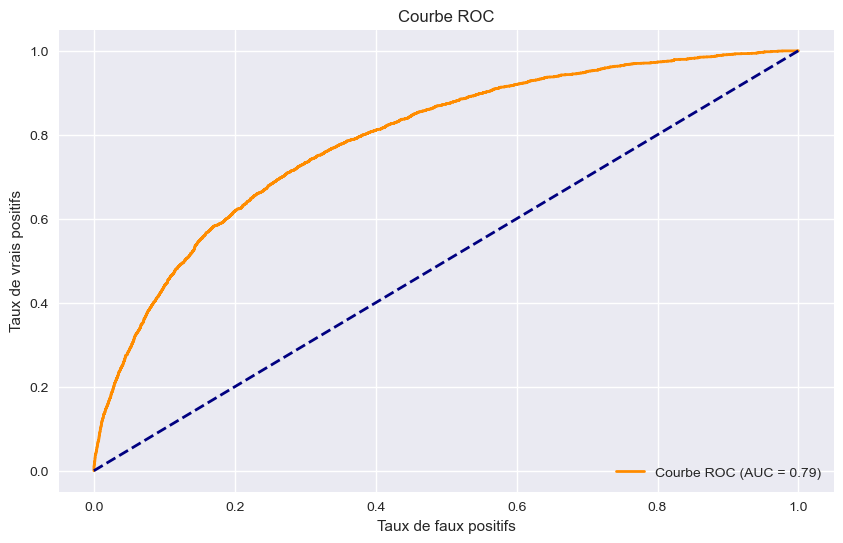

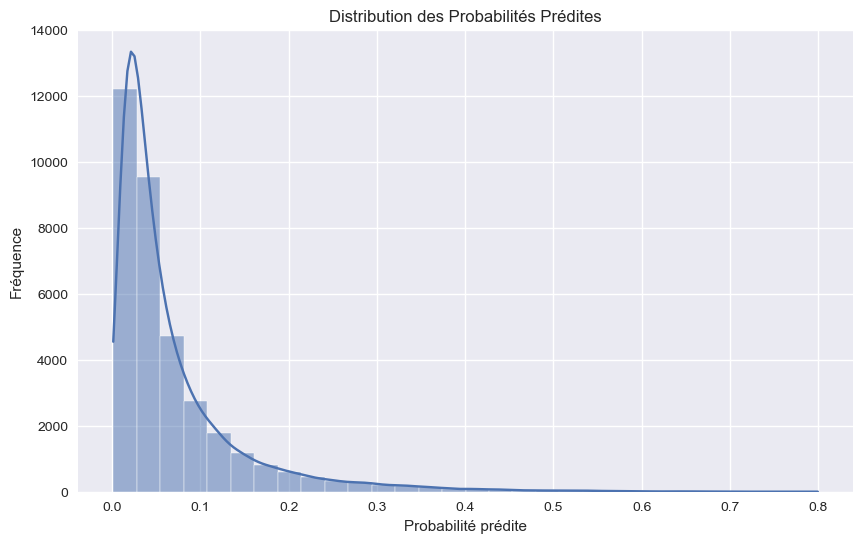

In [221]:
clf = lgbm_clf
X_validation = X_val_new
y_validation = y_val

plot_roc_and_proba(clf, X_validation, y_validation, titre="Courbe ROC")

In [222]:
#FP and FN
cost_false(lgbm_clf, y_val, X_val_new)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


(0.0016280244765059227, 0.06742266883736597)

In [223]:
fp, fn = cost_false(lgbm_clf, y_val, X_val_new)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


In [224]:
print(f"Coût personnalisé : FP = {fp:.2%}, FN = {fn:.2%}")

Coût personnalisé : FP = 0.16%, FN = 6.74%


In [225]:
y_val.shape, X_val_new.shape

((35626,), (35626, 121))

## Feature Importance

### Feature Importance Globale

In [226]:
feature_importances = lgbm_clf.feature_importances_
print("Shape :", feature_importances.shape)

Shape : (121,)


In [227]:
pprint(feature_importances)

array([ 40, 173,  97,  92, 270, 301, 276,  56, 120, 156,  39, 151, 474, 226, 257, 315,  65,  30,  46, 130,  15,  92,  80,  88,  48, 177, 494, 551,  55,  57,  52,
       247,  84, 140, 112, 184, 186, 101, 269, 916, 115, 359, 163, 102, 130, 469, 126, 118,   3, 206, 195, 159, 115, 189, 179,  69, 108,  60,  34, 406, 180,  77,
       173,  31, 108,  63,  51,  96,  67, 200, 134, 147,  96,  31, 163,  58, 125,  75,  50,  82, 164,  43,  66,  97, 164, 195, 173, 332, 195, 151,  92, 212,  49,
        44, 116,  83,  73, 241,  76, 142, 150, 146,  18, 133,  74,  59,  92, 109, 106,  43, 156,  54,  92, 215, 177, 131, 185, 260, 274, 181,  63])


In [228]:
features_importances_list = sorted(zip(new_df.drop(columns='TARGET').columns,
                                      feature_importances),
                                  key=lambda x: x[1],
                                  reverse=True)
features_importances_list

[('PAYMENT_RATE', 916),
 ('EXT_SOURCE_3', 551),
 ('EXT_SOURCE_2', 494),
 ('DAYS_BIRTH', 474),
 ('BURO_DAYS_CREDIT_ENDDATE_MAX', 469),
 ('BURO_BB_MONTHS_BALANCE_SIZE_SUM', 406),
 ('BURO_DAYS_CREDIT_MAX', 359),
 ('PREV_CNT_PAYMENT_MEAN', 332),
 ('DAYS_ID_PUBLISH', 315),
 ('AMT_ANNUITY', 301),
 ('AMT_GOODS_PRICE', 276),
 ('INSTAL_DAYS_ENTRY_PAYMENT_MEAN', 274),
 ('AMT_CREDIT', 270),
 ('ANNUITY_INCOME_PERC', 269),
 ('INSTAL_DAYS_ENTRY_PAYMENT_MAX', 260),
 ('DAYS_REGISTRATION', 257),
 ('DAYS_LAST_PHONE_CHANGE', 247),
 ('INSTAL_DPD_MEAN', 241),
 ('DAYS_EMPLOYED', 226),
 ('INSTAL_AMT_PAYMENT_MIN', 215),
 ('POS_MONTHS_BALANCE_SIZE', 212),
 ('BURO_AMT_CREDIT_SUM_MAX', 206),
 ('PREV_APP_CREDIT_PERC_MIN', 200),
 ('BURO_AMT_CREDIT_SUM_MEAN', 195),
 ('PREV_DAYS_DECISION_MAX', 195),
 ('PREV_CNT_PAYMENT_SUM', 195),
 ('BURO_AMT_CREDIT_SUM_DEBT_MEAN', 189),
 ('INCOME_CREDIT_PERC', 186),
 ('INSTAL_AMT_PAYMENT_SUM', 185),
 ('DAYS_EMPLOYED_PERC', 184),
 ('INSTAL_DAYS_ENTRY_PAYMENT_SUM', 181),
 ('PREV_AMT_

<BarContainer object of 20 artists>

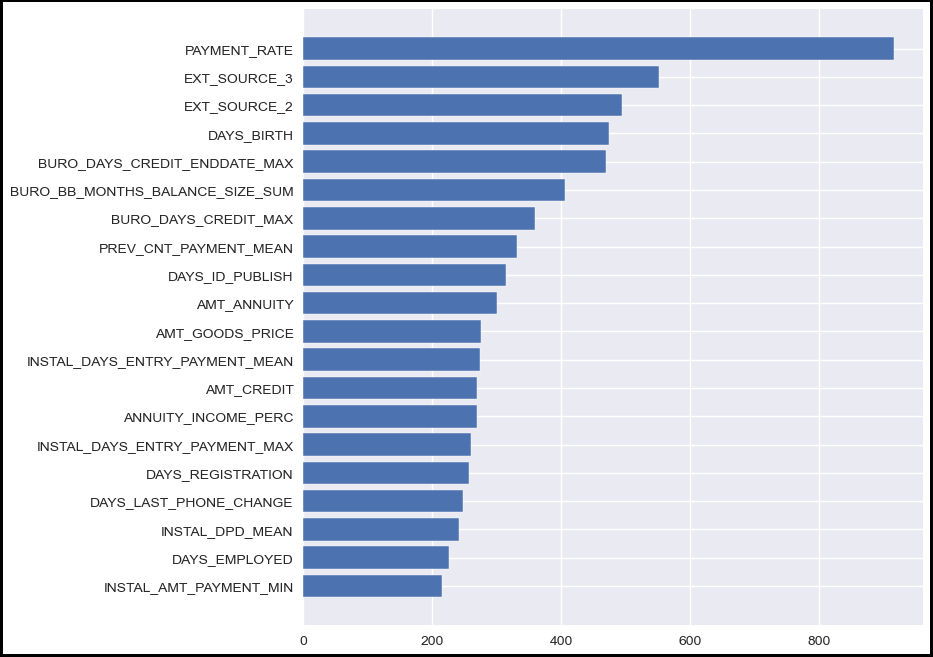

In [229]:
features_importances_list = np.array(features_importances_list)

plt.figure(figsize=(8, 8), edgecolor='black', linewidth=4)
plt.style.use('seaborn')
plt.barh(features_importances_list[:20, 0][::-1],
         features_importances_list[:20, 1][::-1].astype(float))

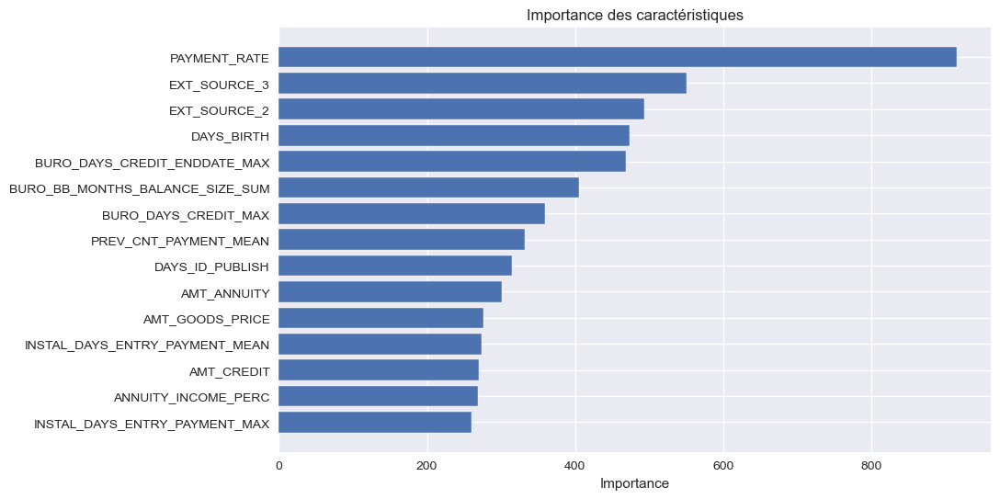

In [230]:
import matplotlib.pyplot as plt

#  lgbm_clf est notre modèle entraîné et feature_importances contient les importances des caractéristiques
# data_rfecv contient les vrais noms des colonnes
feature_importance = sorted(zip(data_rfecv.columns, lgbm_clf.feature_importances_), key=lambda x: x[1], reverse=True)

# Obtenir les noms des caractéristiques et leurs importances
feature_names, importances = zip(*feature_importance[:15])

# Tracer l'importance des caractéristiques en utilisant l'axe spécifié
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(range(len(feature_names)), importances, align='center')
ax.set_yticks(range(len(feature_names)))
ax.set_yticklabels(feature_names)  # Remplacer les étiquettes par les vrais noms des colonnes
ax.invert_yaxis()  # Inverser l'axe y pour avoir les caractéristiques les plus importantes en haut
ax.set_xlabel('Importance')
ax.set_title('Importance des caractéristiques')

plt.show()


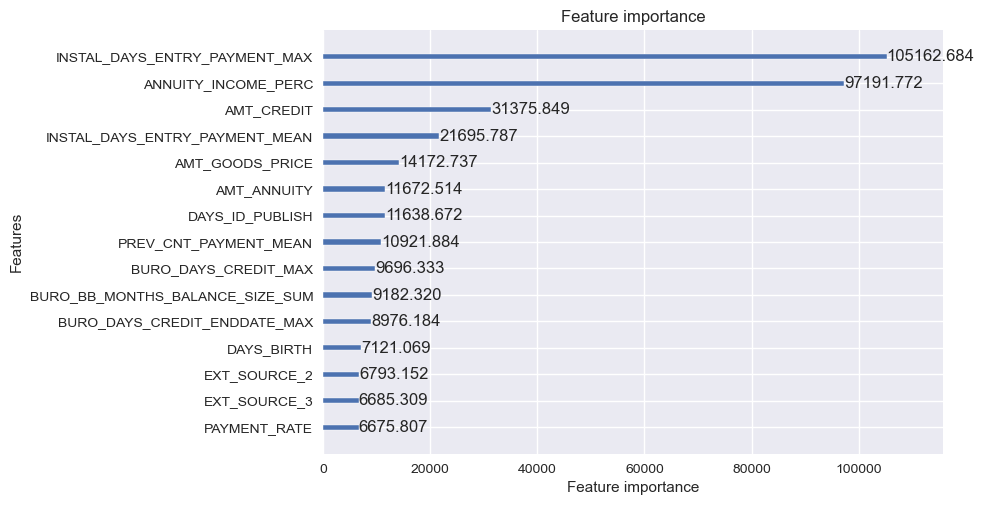

In [231]:
plot_importance(lgbm_clf, max_num_features=15, importance_type='gain')

# Obtenir les noms des caractéristiques et leurs importances pour les 15 premières caractéristiques
feature_importance = sorted(zip(data_rfecv.columns, lgbm_clf.feature_importances_), key=lambda x: x[1], reverse=True)[:15]
feature_names, importances = zip(*feature_importance)

# Mettre à jour les étiquettes de l'axe x avec les vrais noms des caractéristiques
plt.yticks(range(len(feature_names)), feature_names)

# Afficher le graphique d'importance des 15 premières caractéristiques
plt.show()

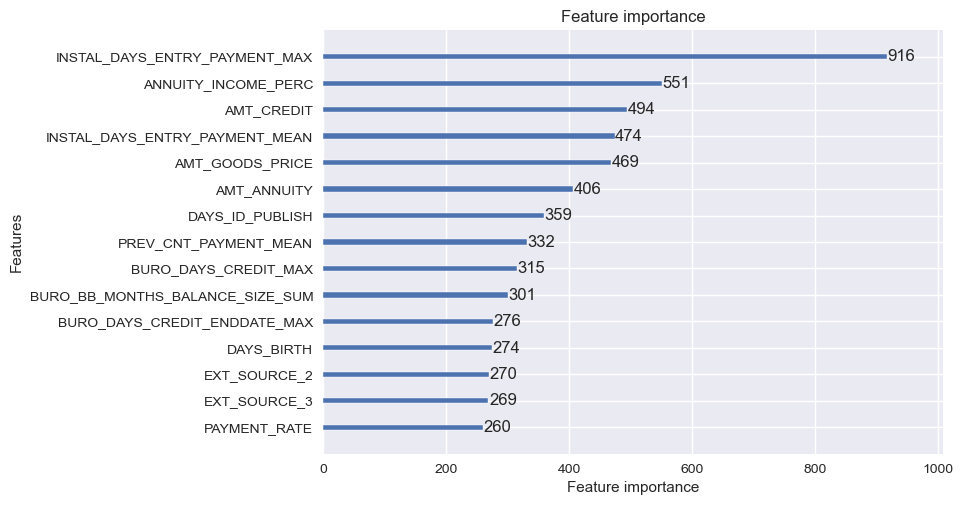

In [232]:
plot_importance(lgbm_clf, max_num_features=15, importance_type='split')

# Obtenir les noms des caractéristiques et leurs importances pour les 15 premières caractéristiques
feature_importance = sorted(zip(data_rfecv.columns, lgbm_clf.feature_importances_), key=lambda x: x[1], reverse=True)[:15]
feature_names, importances = zip(*feature_importance)

# Mettre à jour les étiquettes de l'axe x avec les vrais noms des caractéristiques
plt.yticks(range(len(feature_names)), feature_names)

# Afficher le graphique d'importance des 15 premières caractéristiques
plt.show()

In [233]:
importance_results = permutation_importance(lgbm_clf,
                                 X_train_new,
                                 y_ytrain,
                                 scoring='roc_auc',
                                 n_repeats=1,
                                 max_samples=1.0)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

In [234]:
pickle.dump(importance_results, open('./Archived/results_permutation_importance.pkl', 'wb'))

In [235]:
importance_results = pickle.load(open('./Archived/results_permutation_importance.pkl', 'rb'))

In [236]:
importances_mean = importance_results.importances_mean

features_importances_list = sorted(zip(data_rfecv.columns, importances_mean),
                                  key=lambda x: x[1],
                                  reverse=True)
features_importances_list

[('EXT_SOURCE_2', 0.03296315471322464),
 ('EXT_SOURCE_3', 0.02715120906694779),
 ('BURO_BB_MONTHS_BALANCE_SIZE_SUM', 0.012747679141371426),
 ('PAYMENT_RATE', 0.012126323934318006),
 ('CODE_GENDER', 0.009357219896587998),
 ('DAYS_BIRTH', 0.00596532824935081),
 ('AMT_ANNUITY', 0.005066128981018991),
 ('PREV_CNT_PAYMENT_MEAN', 0.0044860418498534615),
 ('AMT_GOODS_PRICE', 0.004452578461669687),
 ('BURO_DAYS_CREDIT_ENDDATE_MAX', 0.004418222710465991),
 ('NAME_EDUCATION_TYPE', 0.0039309159745196665),
 ('INSTAL_DPD_MEAN', 0.003749877470394458),
 ('AMT_REQ_CREDIT_BUREAU_QRT', 0.003724895957456842),
 ('FLAG_OWN_CAR', 0.0035556493396528),
 ('AMT_CREDIT', 0.0030283754841644583),
 ('DAYS_ID_PUBLISH', 0.002938199102372807),
 ('DAYS_EMPLOYED', 0.0027430320922939844),
 ('POS_MONTHS_BALANCE_SIZE', 0.0027385581229288913),
 ('ORGANIZATION_TYPE', 0.002719912132346014),
 ('NAME_FAMILY_STATUS', 0.0026676337943126738),
 ('INSTAL_DAYS_ENTRY_PAYMENT_MEAN', 0.002436079320352058),
 ('INSTAL_DAYS_ENTRY_PAYMENT_M

Somme des feature importances (avant normalisation) :  0.229


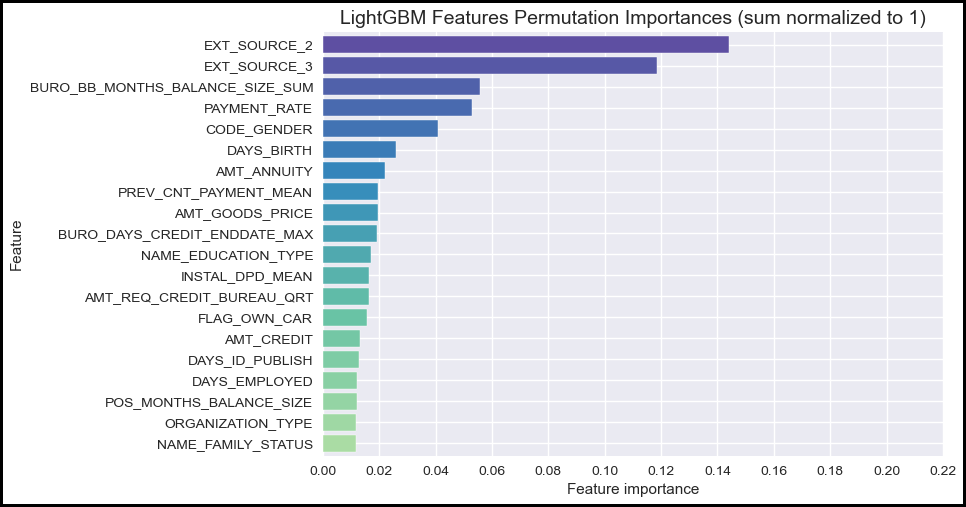

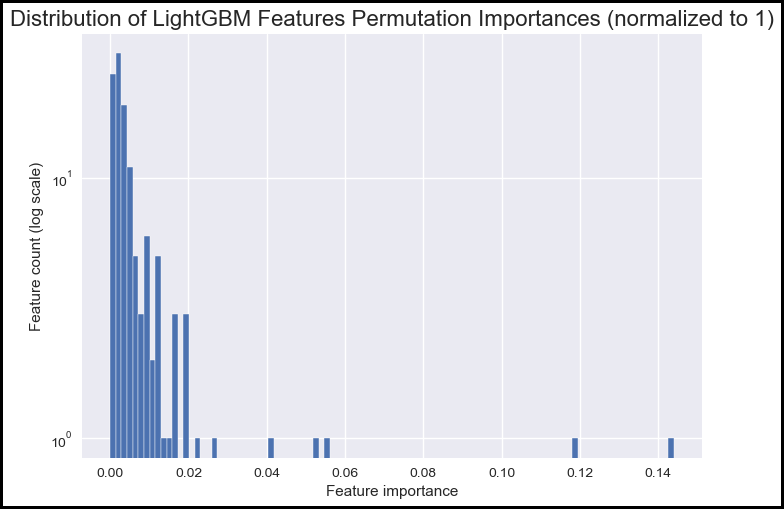

In [237]:
# Somme des feature importances
features_importances_list = np.array(features_importances_list)
somme = features_importances_list[:, 1].astype(float).sum()
print("Somme des feature importances (avant normalisation) : ",
      round(somme, 3))

# Normalisation
features_importances_list[:,
                         1] =features_importances_list[:,
                                                       1].astype(float) / somme

# Chart 'LightGBM Features Permutation Importances'
nb_features = 20
plt.style.use('seaborn')
fig = plt.figure(edgecolor='black', linewidth=4)
plt.title('LightGBM Features Permutation Importances (sum normalized to 1)',
          size=14)
plt.xlabel('Feature importance')
plt.ylabel('Feature')
plt.barh(features_importances_list[:nb_features, 0][::-1],
         features_importances_list[:nb_features, 1][::-1].astype(float),
         color=[
             Spectral(0.7 + 0.3 * i / (nb_features - 1))
             for i in range(nb_features)
         ])
plt.xticks([i * 0.02 for i in range(12)])
plt.ylim(-0.6, nb_features - 0.4)
joblib.dump(
    fig,
    './dashboard_streamlit/resources/figure_features_permutation_importances.joblib'
)
plt.show()
# list of strings of top20 features
joblib.dump(
    list(features_importances_list[:nb_features, 0]),
    './dashboard_streamlit/resources/list_features_permutation_importances.joblib'
)

# Chart 'Distribution of LightGBM Features Permutation Importances'
plt.figure(edgecolor='black', linewidth=4)
plt.yscale("log")
plt.xlabel('Feature importance')
plt.ylabel('Feature count (log scale)')
plt.title(
    'Distribution of LightGBM Features Permutation Importances (normalized to 1)',
    size=16)
plt.hist(features_importances_list[:, 1].astype(float), bins=100)
plt.show()



### Feature importance locale avec SHAP

In [238]:
shap.initjs()  # nécessaire pour tracer les force plots
explainer = shap.TreeExplainer(lgbm_clf)

In [239]:
X_val_new_df = pd.DataFrame(X_val_new, columns=list(data_rfecv))

In [240]:
sample = X_val_new_df.iloc[0]
sample

NAME_CONTRACT_TYPE                     0.000000
CODE_GENDER                            1.000000
FLAG_OWN_CAR                           0.000000
AMT_INCOME_TOTAL                  180000.000000
AMT_CREDIT                        114682.500000
                                      ...      
INSTAL_AMT_PAYMENT_SUM            231900.120000
INSTAL_DAYS_ENTRY_PAYMENT_MAX        -52.000000
INSTAL_DAYS_ENTRY_PAYMENT_MEAN      -524.266667
INSTAL_DAYS_ENTRY_PAYMENT_SUM      -7864.000000
INSTAL_COUNT                          15.000000
Name: 0, Length: 121, dtype: float64

In [241]:
# Sélectionner un échantillon aléatoire dans X_val_new_df
random_sample_idx = X_val_new_df.sample(1).index
sample_idx = random_sample_idx[0]

# Obtenir la classe prédite par le modèle pour l'échantillon sélectionné
predicted_class = int(lgbm_clf.predict(X_val_new_df.loc[[sample_idx]]))

# Obtenir les valeurs SHAP pour la classe prédite par le modèle
shap_values = explainer.shap_values(X_val_new_df.loc[[sample_idx]])[predicted_class]

# Visualiser l'importance des fonctionnalités pour cet échantillon individuel
shap.initjs()
shap.force_plot(explainer.expected_value[predicted_class], shap_values, X_val_new_df.loc[[sample_idx]])


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


In [242]:
shap_values[0].shape

(121,)

In [243]:
X_val_new_df.shape, y_val_df.shape

((35626, 121), (35626, 1))

In [244]:
import pandas as pd
import shap

# Sélectionner un échantillon aléatoire dans X_val_new_df
random_sample_idx = X_val_new_df.sample(1).index
sample_idx = random_sample_idx[0]

# Obtenir les valeurs SHAP pour l'échantillon sélectionné
shap_values = explainer.shap_values(X_val_new_df.loc[[sample_idx]])[0]

# Transposer les valeurs SHAP pour les convertir en un tableau avec une seule ligne
shap_values = shap_values.reshape(1, -1)

# Créez un DataFrame avec les valeurs SHAP et les noms des fonctionnalités
shap_df = pd.DataFrame(data=shap_values, columns=X_val_new_df.columns)

# Affichez le DataFrame
display(shap_df)


,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_BB_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
0,-0.010402,0.158754,-0.06261,-0.001084,0.018411,0.166697,-0.065851,-0.030316,-0.067455,-0.036995,-0.023511,-0.019612,0.086032,-0.073982,-0.017734,-0.033784,0.01026,-0.016312,-0.013335,-0.028839,0.000571,0.008578,-0.013877,-0.002638,-0.08017,0.073603,-0.003748,-0.657728,0.012416,-0.092061,-0.038718,0.004773,-0.030481,0.009445,-0.033175,-0.013595,-0.003348,0.01035,-0.026874,-0.212165,-0.004869,0.036027,-0.003593,0.00163,-0.026747,0.051866,-0.004576,-0.019331,0.000015,-0.016058,0.006535,-0.004016,-0.006888,-0.113593,0.004549,0.001412,-0.04797,-0.042793,0.000533,-0.177712,0.01007,-0.003686,-0.028291,0.004595,0.012523,0.005079,0.001268,0.027062,0.00429,0.055953,-0.020116,0.025521,0.02077,-0.000595,-0.037526,-0.005519,0.006984,0.001658,-0.006541,-0.018957,-0.02544,-0.008868,-0.01148,-0.023806,-0.006508,0.012945,0.015658,0.080494,0.031814,-0.01083,0.005367,-0.011814,0.013519,0.002426,0.011999,0.005978,-0.026744,-0.112606,-0.016537,-0.002987,0.00617,-0.003095,-0.000608,-0.043759,-0.002514,0.006959,0.008021,-0.024961,-0.004662,0.001173,0.014092,0.000238,-0.00389,-0.052722,0.010053,-0.021361,-0.021623,-0.01485,0.051316,-0.0281,-0.002317


In [245]:
# Transposer les valeurs SHAP et renommez la colonne en "SHAP VALUES"
shap_df_transposed = shap_df.T.rename(columns={0: "SHAP VALUES"})

# Afficher le DataFrame transposé avec la colonne renommée
display(shap_df_transposed)

,SHAP VALUES
NAME_CONTRACT_TYPE,-0.010402
CODE_GENDER,0.158754
FLAG_OWN_CAR,-0.062610
AMT_INCOME_TOTAL,-0.001084
AMT_CREDIT,0.018411
...,...
INSTAL_AMT_PAYMENT_SUM,-0.021623
INSTAL_DAYS_ENTRY_PAYMENT_MAX,-0.014850
INSTAL_DAYS_ENTRY_PAYMENT_MEAN,0.051316
INSTAL_DAYS_ENTRY_PAYMENT_SUM,-0.028100


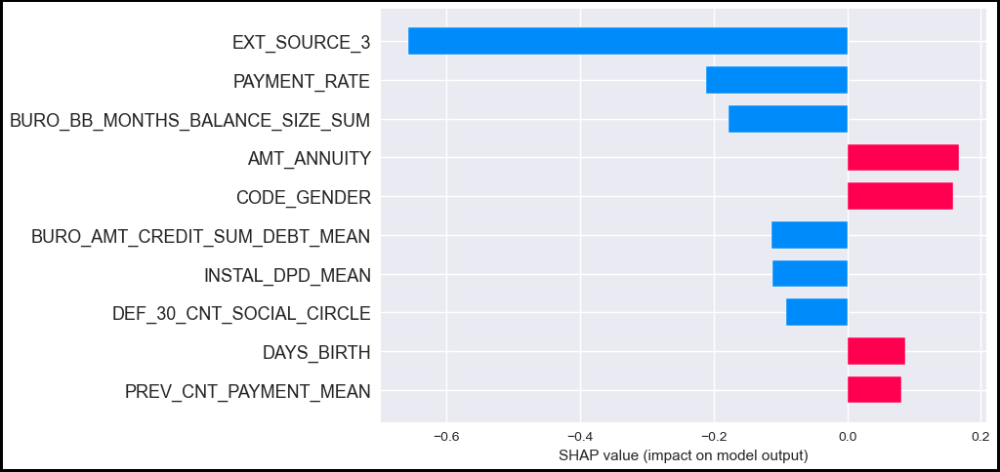

In [246]:
plt.figure(edgecolor='black', linewidth=4)
shap.bar_plot(shap_values[0],
              feature_names=X_val_new_df.columns,
              max_display=10)

In [247]:
shap.plots.force(base_value=0,
                 shap_values=shap_values[0],
                 feature_names=X_val_new_df.columns,
                 out_names="Score")

### Importance globale avec SHAP

In [248]:
df_sample = X_val_new_df.sample(10000)
shap_values = explainer.shap_values(df_sample)

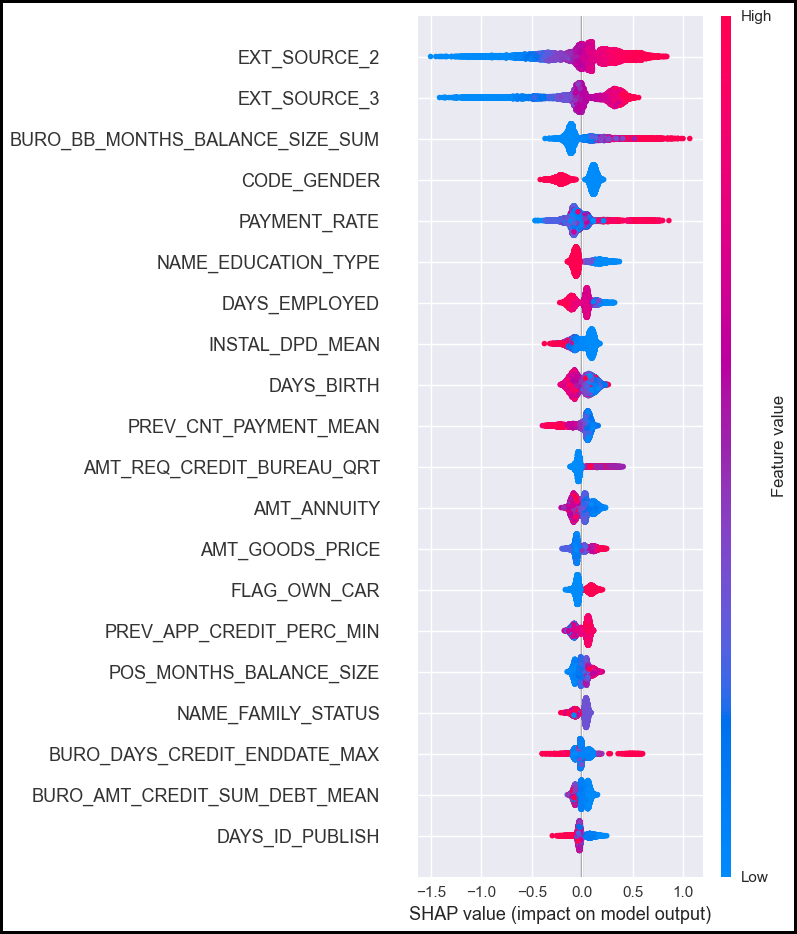

In [249]:
fig = plt.figure(edgecolor='black', linewidth=4)
shap.summary_plot(shap_values[0],
                  features=df_sample,
                  feature_names=X_val_new_df.columns,
                  max_display=20)

# Sérialisation
joblib.dump(
    fig,
    './dashboard_streamlit/resources/figure_summary_plot_shap.joblib'
)

fig.show()

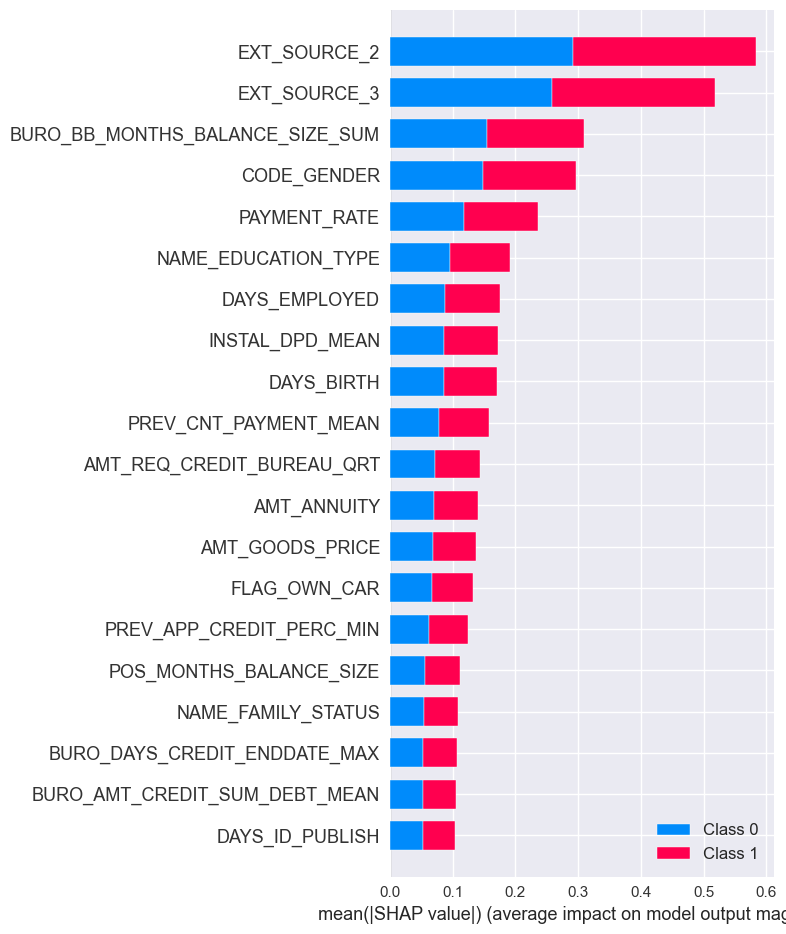

In [250]:
shap.summary_plot(shap_values, feature_names=X_val_new_df.columns)

In [251]:
list_summary_plot_shap = [
    'EXT_SOURCE_2', 'EXT_SOURCE_3','BURO_BB_MONTHS_BALANCE_SIZE_SUM', 'CODE_GENDER', 'PAYMENT_RATE', 
    'INSTAL_DPD_MEAN', 'NAME_EDUCATION_TYPE', 'DAYS_EMPLOYED', 'DAYS_BIRTH', 'PREV_CNT_PAYMENT_MEAN',
    'AMT_GOODS_PRICE', 'AMT_ANNUITY', 'AMT_REQ_CREDIT_BUREAU_QRT', 'FLAG_OWN_CAR', 'PREV_APP_CREDIT_PREC_MIN', 
    'BURO_DAYS_CREDIT_ENDDATE_MAX', 'NAME_FAMILY_STATUS', 'DAYS_ID_PUBLISH', 'BURO_AMT_CREDIT_SUM_DEBT_MEAN', 'POS_MONTHS_BALANCE_SIZE'
]

joblib.dump(list_summary_plot_shap,
            './dashboard_streamlit/resources/list_summary_plot_shap.joblib')

['./dashboard_streamlit/resources/list_summary_plot_shap.joblib']

## Développement de l'API

### Présentation de MLFlow

MLflow is a platform to streamline machine learning development, including tracking experiments, packaging code into reproducible runs, and sharing and deploying models. MLflow offers a set of lightweight APIs that can be used with any existing machine learning application or library (TensorFlow, PyTorch, XGBoost, etc), wherever you currently run ML code (e.g. in notebooks, standalone applications or the cloud). MLflow's current components are:

MLflow Tracking: An API to log parameters, code, and results in machine learning experiments and compare them using an interactive UI.

MLflow Projects: A code packaging format for reproducible runs using Conda and Docker, so you can share your ML code with others.

**MLflow Models: A model packaging format and tools that let you easily deploy the same model (from any ML library) to batch and real-time scoring on platforms >such as Docker, Apache Spark, Azure ML and AWS SageMaker.**

MLflow Model Registry: A centralized model store, set of APIs, and UI, to collaboratively manage the full lifecycle of MLflow Models.

MLflow est une librairie dédiée à la gestion du cycle de vie d'un projet de machine learning, à savoir :

-> le suivi des résultats liés aux expériences (MLflow Tracking)

-> garantir la reproducibilité des expériences et le partage de code (MLflow Projects)

-> la gestion des modèles sous un format normalisé afin de simplifier les déploiements locaux ou cloud (MLflow Models)

-> la centralisation et le versionnage les modèles (MLflow Model Registry

### Format de stockage d'un modèle

Un modèle MLflow est un répertoire contenant une liste de fichiers, dont un nommé MLmodel qui liste les différentes flavors (terme MLflow) dans lesquelles le modèle est utilisable.

Les flavors sont une façon pratique de définir comment exécuter un modèle, cette convention facilite le déploiement car la flavor standardise la façon de prédire à partir d'un modèle. MLflow définit par exemple des flavors pour une fonction python, sklearn, tensorflow, xgboost.

Dans le répertoire de sauvegarde du modèle MLflow, le fichier MLmodel contient l'ensemble des flavors disponibles, par exemple :
```yaml
time_created: 2018-05-25T17:28:53.35

flavors:
  sklearn:
    sklearn_version: 0.19.1
    pickled_model: model.pkl
  python_function:
    loader_module: mlflow.sklearn
```

Tous les outils supportant les flavors `python_function` ou `sklearn` pourront utiliser ce modèle, par exemple pour un déploiement avec la commande suivante.

```python
mlflow models serve -m my_model
```

D'autres outils cloud comme AWS SageMaker ou Azure ML peuvent utiliser ces flavors.

[Documentation pour approfondir](https://mlflow.org/docs/latest/models.html#storage-format)

-----------

### Signature d'un modèle

Afin de garantir que les données d'entrée d'un modèle sont conformes à ce qui est attendu, les modèles MLflow peuvent inclure des metadatas décrivant les entrées et sorties :

Model Signature - description des entrées et sorties du modèle
Model Input Example - exemple d'une entrée valide
La signature du modèle permet de renseigner le nom des colonnes et leurs types afin de vérifier si ils sont similaires lors de la prédiction.

In [252]:
from mlflow.models.signature import infer_signature

Utiliser la fonction infer_signature afin d'extraire la signature à partir des données d'entrée et de sortie.

In [253]:
signature = infer_signature(X_train_new, y_ytrain)

*Export du modèle via un fichier joblib*

In [254]:
#Meilleurs paramètres de la CV
best_params = {
    'num_leaves': 63,
    'num_iterations': 200,
    'min_data_in_leaf': 40,
    'learning_rate': 0.05
}

In [255]:
clf_best_params = LGBMClassifier(**best_params, verbose=-1)
clf_best_params.fit(X_train_new,
                    y_ytrain,
                    )

LGBMClassifier(learning_rate=0.05, min_data_in_leaf=40, num_iterations=200,
               num_leaves=63, verbose=-1)

In [256]:
# le répertoire  ./api_ml  est le repository de l'API.
joblib.dump(clf_best_params, './api_ml/resources/API_model.joblib')

['./api_ml/resources/API_model.joblib']

In [257]:
clf_best_params = joblib.load('./api_ml/resources/API_model.joblib')
clf_best_params

LGBMClassifier(learning_rate=0.05, min_data_in_leaf=40, num_iterations=200,
               num_leaves=63, verbose=-1)

### Export de clients vers l'API et vers le dashboard

#### Tous les clients du set X_val_new_df

In [258]:
y_val.shape, X_val_new.shape, X_val_new_df.shape

((35626,), (35626, 121), (35626, 121))

In [259]:
joblib.dump(X_val_new_df,
            './dashboard_streamlit/src/X_val_new_df.joblib',
            compress=3)  # 100 Mo => 21 Mo avec compression
joblib.dump(y_val, './dashboard_streamlit/src/y_val.joblib')

['./dashboard_streamlit/src/y_val.joblib']

In [260]:
X_train.shape, X_test.shape

((356255, 161), (0, 161))

#### Un échantillon des clients

In [261]:
df_val_sample = X_val_new_df.sample(100)
df_val_sample

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_BB_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCESS_START_MIN,PREV_HOUR_APPR_PROCESS_START_MAX,PREV_HOUR_APPR_PROCESS_START_MEAN,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,POS_MONTHS_BALANCE_MAX,POS_MONTHS_BALANCE_MEAN,POS_MONTHS_BALANCE_SIZE,POS_SK_DPD_MAX,POS_SK_DPD_DEF_MAX,POS_SK_DPD_DEF_MEAN,INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE,INSTAL_DPD_MAX,INSTAL_DPD_MEAN,INSTAL_DPD_SUM,INSTAL_DBD_MAX,INSTAL_DBD_MEAN,INSTAL_DBD_SUM,INSTAL_PAYMENT_PERC_MAX,INSTAL_PAYMENT_PERC_MEAN,INSTAL_PAYMENT_PERC_SUM,INSTAL_PAYMENT_PERC_VAR,INSTAL_PAYMENT_DIFF_MAX,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_PAYMENT_DIFF_VAR,INSTAL_AMT_INSTALMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
10116,0.0,0.0,0.0,337500.0,1220967.0,81922.5,1170000.0,1.0,4.0,1.0,1.0,0.046220,-13421.0,-1845.0,-887.0,-2282.0,1.0,1.0,0.0,15.0,1.0,1.0,1.0,14.0,0.0,42.0,0.713256,0.533482,1.0,0.0,0.0,-1366.0,0.0,0.0,0.0,0.137471,0.276420,84375.0,0.242733,0.067096,-1822.0,-305.0,-1052.500000,3.803969e+05,-1272.0,912.0,-131.788889,-479.300000,0.0,450000.000,1.972972e+05,9.788207e+05,152617.500,4.476038e+04,173367.000,0.000000,0.000000,0.000,0.0,0.0,14461.290,21965.355,18119.936250,0.00,376740.00,161259.000000,0.00,426469.5,158905.500000,0.883393,1.583099,1.163224,1.025946e-01,0.00,47682.000,17222.400000,119205.00,1.935108e+05,10.0,20.0,14.166667,0.000000,0.422262,0.149806,-1366.0,-73.0,-626.000000,12.000000,48.0,-1.0,-14.944444,36.0,0.0,0.0,0.000000,1.0,0.0,0.000000,0.0,30.0,10.781250,345.0,1.000000,1.000000,32.000000,0.000000,0.000,0.000000,0.000,0.000000e+00,21965.355,19218.569062,614994.210,14461.290,2.196535e+04,19218.569062,614994.210,-21.0,-411.281250,-13161.0,32.0
16052,0.0,1.0,0.0,112500.0,364500.0,17532.0,364500.0,7.0,4.0,1.0,1.0,0.018209,-13258.0,-5203.0,-3481.0,-3506.0,0.0,0.0,0.0,8.0,3.0,3.0,6.0,13.0,0.0,30.0,0.443255,0.631355,0.0,0.0,0.0,-1138.0,1.0,0.0,0.0,0.392442,0.308642,56250.0,0.155840,0.048099,-1815.0,-163.0,-1281.750000,6.073609e+05,-1631.0,7

In [262]:
joblib.dump(df_val_sample, './dashboard_streamlit/src/df_val_sample.joblib')

['./dashboard_streamlit/src/df_val_sample.joblib']

In [263]:
df_val_sample = joblib.load('./dashboard_streamlit/src/df_val_sample.joblib')


 ### Sauvegarde du modèle sklearn

In [264]:
import mlflow.sklearn

In [266]:
mlflow.sklearn.save_model(clf_best_params, './dashboard_streamlit/mlflow_model', signature=signature)

### Deploiement d'une API REST

In [268]:
val_set_pred_proba.head(2)

,SK_ID_CURR,pred_proba,TARGET_True
43158,43158,0.026179,0
29289,29289,0.021061,0


### Tests de l'API

In [269]:
response = requests.get(HOST + '/optimum_threshold')
print("response.content :  ", response.content)
print("response.url :  ", response.url)
float(response.content)

NameError: name 'HOST' is not defined